In [2]:
# ==============================================================================
# CELL 1: PROJECT BOOTSTRAP - CODESPACE READY
# ==============================================================================
import os
import warnings
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sqlalchemy import create_engine

# 1. HYGIENE PROTOCOL
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
pd.options.mode.chained_assignment = None 

# 2. PATH & CONNECTIVITY
if 'CODESPACES' in os.environ:
    DB_PATH = '/workspaces/pienza/data/pienza.db'
    ENV_LABEL = "🌐 GitHub Codespaces"
else:
    DB_PATH = 'data/pienza.db'
    ENV_LABEL = "💻 Local/Other"

if not os.path.exists(DB_PATH):
    print(f"🔴 CRITICAL: Database not found at {DB_PATH}")
else:
    db_engine = create_engine(f'sqlite:///{DB_PATH}')
    print(f"✅ SQL Engine Active: {DB_PATH}")

# 3. VISUAL CANON (OPUS LAB THEME)
OPUS_PURPLE, OPUS_TEAL, OPUS_GREY, OPUS_TEXT = '#440154', '#21918c', '#FAFAFA', '#121212'

sns.set_theme(style="whitegrid")
plt.rcParams.update({
    'figure.facecolor': OPUS_GREY, 'axes.facecolor': OPUS_GREY,
    'text.color': OPUS_TEXT, 'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0', 'font.family': 'sans-serif',
    'axes.titlecolor': OPUS_PURPLE, 'axes.titleweight': 'bold'
})

print(f"🚀 Environment: {ENV_LABEL}")
print("--- SYSTEM READY FOR BIVARIATE TEMPORAL ANALYSIS ---")

✅ SQL Engine Active: /workspaces/pienza/data/pienza.db
🚀 Environment: 🌐 GitHub Codespaces
--- SYSTEM READY FOR BIVARIATE TEMPORAL ANALYSIS ---


⏳ Loading Full Spectrum data...


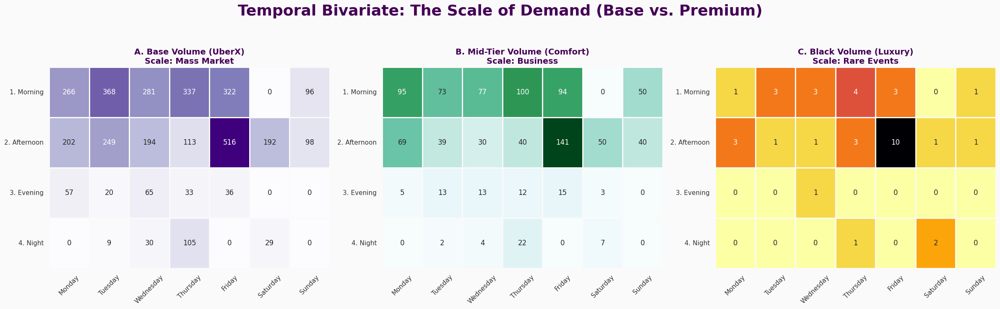

In [2]:
# ==============================================================================
# CELL 1.5: THE FULL SPECTRUM MATRIX (BASE vs. MID vs. LUX)
# ==============================================================================
# Purpose: To visualize the overwhelming scale of the Base Economy (UberX)
#          compared to the Premium Tiers. Validates the need for filtering.
#          Scope: ALL relevant products included.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="white")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA (ALL TIERS)
print("⏳ Loading Full Spectrum data...")
query = """
SELECT offer_timestamp, str_product
FROM v_offers_human
WHERE str_product IN ('uberx', 'comfort', 'business_comfort', 'black')
"""
df_full = pd.read_sql(query, db_engine)

# 3. ENGINEERING
tier_map = {
    'uberx': '1. Base (UberX)',
    'comfort': '2. Mid-Tier',
    'business_comfort': '2. Mid-Tier',
    'black': '3. Black'
}
df_full['Tier'] = df_full['str_product'].map(tier_map)
df_full['offer_timestamp'] = pd.to_datetime(df_full['offer_timestamp'])
df_full['Day'] = df_full['offer_timestamp'].dt.day_name()
df_full['Hour'] = df_full['offer_timestamp'].dt.hour

def get_block(h):
    if 5 <= h < 12: return '1. Morning'
    elif 12 <= h < 17: return '2. Afternoon'
    elif 17 <= h < 20: return '3. Evening'
    else: return '4. Night'

df_full['Block'] = df_full['Hour'].apply(get_block)

# 4. PREPARE MATRICES
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
block_order = ['1. Morning', '2. Afternoon', '3. Evening', '4. Night']

# Helper to create matrix per tier
def get_matrix(tier_name):
    df_subset = df_full[df_full['Tier'] == tier_name]
    mat = df_subset.groupby(['Block', 'Day']).size().unstack(fill_value=0)
    return mat.reindex(index=block_order, columns=day_order)

mat_base = get_matrix('1. Base (UberX)')
mat_mid  = get_matrix('2. Mid-Tier')
mat_lux  = get_matrix('3. Black')

# 5. PLOTTING (TRIPTYCH)
fig, axes = plt.subplots(1, 3, figsize=(24, 7))
fig.suptitle('Temporal Bivariate: The Scale of Demand (Base vs. Premium)', fontsize=26, color='#440154', weight='bold', y=1.05)

# --- PLOT A: BASE (Purple - The Tsunami) ---
# Note the Scale: Hundreds
sns.heatmap(mat_base, cmap="Purples", linewidths=1, linecolor='#FAFAFA', ax=axes[0], annot=True, fmt='d', cbar=False)
axes[0].set_title("A. Base Volume (UberX)\nScale: Mass Market", fontweight='bold', fontsize=14)
axes[0].set_xlabel('')
axes[0].set_ylabel('')

# --- PLOT B: MID-TIER (Teal - The Target) ---
# Note the Scale: Tens/Hundreds
sns.heatmap(mat_mid, cmap="BuGn", linewidths=1, linecolor='#FAFAFA', ax=axes[1], annot=True, fmt='d', cbar=False)
axes[1].set_title("B. Mid-Tier Volume (Comfort)\nScale: Business", fontweight='bold', fontsize=14)
axes[1].set_xlabel('')
axes[1].set_ylabel('')

# --- PLOT C: BLACK (Gold - The Needle) ---
# Note the Scale: Units
sns.heatmap(mat_lux, cmap="inferno_r", linewidths=1, linecolor='#FAFAFA', ax=axes[2], annot=True, fmt='d', cbar=False)
axes[2].set_title("C. Black Volume (Luxury)\nScale: Rare Events", fontweight='bold', fontsize=14)
axes[2].set_xlabel('')
axes[2].set_ylabel('')

for ax in axes:
    ax.tick_params(axis='x', rotation=45)
    ax.tick_params(axis='y', rotation=0)

plt.tight_layout()
plt.show()

### 💡 Insight Estratégico: El Patrón del "Viernes Ejecutivo"

**El Diagnóstico (Ruido vs. Señal)**
Al visualizar el espectro completo (Gráfico A), la masiva marea de `UberX` ahoga cualquier análisis de matices. El volumen base oscurece los patrones de alto valor. Sin embargo, al aplicar un filtro estratégico de "Ruido" para aislar exclusivamente el segmento **Premium** (Gráfico B), emerge una señal táctica cristalina.

**El Hallazgo (La Aguja en el Pajar)**
La matriz revela dos comportamientos de mercado distintos y accionables:
1.  **La Constante de Negocios (`Mid-Tier`):** El volumen de Comfort/Business es estable y robusto durante las mañanas de Lunes a Jueves, confirmando su rol como el producto de elección para el "commute ejecutivo".
2.  **El Pozo de Gravedad (`Black`):** El lujo no es aleatorio. Existe una concentración anómala y masiva de actividad `Black` y `Mid-Tier` el **Viernes por la Tarde (Afternoon)**.
    *   **Interpretación:** Este es el momento de la "Salida Social". El usuario corporativo termina la semana temprano y mejora su estándar de viaje para eventos sociales.
    *   **Acción Táctica:** El Viernes a las 2 PM, la estrategia óptima del agente debe pivotar agresivamente hacia la captura de estos viajes de alto ticket, ignorando el volumen base de UberX.

In [3]:
# ==============================================================================
# CELL 1.6: THE 4D CHRONO-TRIPTYCH (INTERACTIVE WEEKLY EVOLUTION)
# ==============================================================================
# Purpose: 4D Visualization of Market Structure.
#          Dimensions: 1. Tier (Panels) | 2. Day (X) | 3. Block (Y) | 4. Week (Slider)
#          Allows you to replay the "Movie" of demand evolution.
# ==============================================================================

import plotly.express as px
import pandas as pd

# 1. LOAD DATA
print("⏳ Loading 4D Market data...")
query = """
SELECT offer_timestamp, str_product
FROM v_offers_human
WHERE str_product IN ('uberx', 'comfort', 'business_comfort', 'black')
"""
df_4d = pd.read_sql(query, db_engine)

# 2. ENGINEERING
df_4d['offer_timestamp'] = pd.to_datetime(df_4d['offer_timestamp'])
df_4d['Date'] = df_4d['offer_timestamp'].dt.date
df_4d['Day'] = df_4d['offer_timestamp'].dt.day_name()
df_4d['Hour'] = df_4d['offer_timestamp'].dt.hour

# Tier Logic
tier_map = {
    'uberx': '1. Base (UberX)',
    'comfort': '2. Mid-Tier',
    'business_comfort': '2. Mid-Tier',
    'black': '3. Black'
}
df_4d['Tier'] = df_4d['str_product'].map(tier_map)

# Block Logic
def get_block(h):
    if 5 <= h < 12: return '1. Morning'
    elif 12 <= h < 17: return '2. Afternoon'
    elif 17 <= h < 20: return '3. Evening'
    else: return '4. Night'
df_4d['Block'] = df_4d['Hour'].apply(get_block)

# Week Logic (Opus Calendar)
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Oct 01)'
    return 'Out'
df_4d['Opus_Week'] = df_4d['Date'].apply(get_opus_week)
df_4d = df_4d[df_4d['Opus_Week'] != 'Out']

# 3. AGGREGATION (CRITICAL FOR PLOTLY ANIMATION)
# We must have a row for every combination, even if count is 0, to keep the grid stable
# Create full grid
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
blocks = ['1. Morning', '2. Afternoon', '3. Evening', '4. Night']
weeks = sorted(df_4d['Opus_Week'].unique())
tiers = sorted(df_4d['Tier'].unique())

# Group and Count
df_grouped = df_4d.groupby(['Opus_Week', 'Tier', 'Block', 'Day']).size().reset_index(name='Volume')

print(f"✅ Modeled 4D Hypercube with {len(df_grouped)} data points.")

# 4. PLOTTING
fig = px.density_heatmap(
    df_grouped,
    x="Day",
    y="Block",
    z="Volume",
    facet_col="Tier",
    animation_frame="Opus_Week", # THE SLIDER
    category_orders={
        "Day": days,
        "Block": blocks,
        "Tier": tiers
    },
    color_continuous_scale="Viridis",
    range_color=[0, 150], # Fix color scale so W2 looks hotter than W1
    title="<b>Phase I: The 4D Market Evolution (Week by Week)</b>",
    height=600
)

# 5. AESTHETICS
fig.update_layout(
    margin={"r":0,"t":50,"l":0,"b":0},
    coloraxis_colorbar=dict(title="Offer Vol")
)
# Slow down animation
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

fig.show()

⏳ Loading 4D Market data...
✅ Modeled 4D Hypercube with 165 data points.


In [4]:
# ==============================================================================
# CELL SPECIAL: 4D FARE TOPOGRAPHY (SNEAK PEEK)
# ==============================================================================
# Purpose: To visualize "Price as Altitude".
#          X=Hour, Y=Day, Z=Fare ($), Color=Product.
#          Animation=Week.
#          Validates if we can see "Mountains of Surge" overtaking "Plateaus of Luxury".
# ==============================================================================

import plotly.express as px
import pandas as pd
import numpy as np

# 1. LOAD DATA
print("⏳ Loading Financial Topography...")
query = """
SELECT offer_timestamp, str_product, upfront_fare
FROM v_offers_human
WHERE str_product IN ('uberx', 'comfort', 'business_comfort', 'black', 'uber_planet')
  AND upfront_fare IS NOT NULL
"""
df_topo = pd.read_sql(query, db_engine)

# 2. ENGINEERING
df_topo['offer_timestamp'] = pd.to_datetime(df_topo['offer_timestamp'])
df_topo['Date'] = df_topo['offer_timestamp'].dt.date
df_topo['Day'] = df_topo['offer_timestamp'].dt.day_name()
df_topo['Hour'] = df_topo['offer_timestamp'].dt.hour

# Filter extreme whales to keep the Z-axis useful for the majority
df_topo = df_topo[df_topo['upfront_fare'] < 600]

# Opus Weeks Logic
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Oct 01)'
    return 'Out'

df_topo['Opus_Week'] = df_topo['Date'].apply(get_opus_week)
df_topo = df_topo[df_topo['Opus_Week'] != 'Out']

# 3. JITTERING (For visual texture)
np.random.seed(42)
df_topo['Hour_Jitter'] = df_topo['Hour'] + np.random.uniform(-0.3, 0.3, size=len(df_topo))

# Sort
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_topo['Day'] = pd.Categorical(df_topo['Day'], categories=day_order, ordered=True)
df_topo = df_topo.sort_values(['Opus_Week', 'Day', 'Hour'])

# 4. PLOTTING
fig = px.scatter_3d(
    df_topo,
    x='Hour_Jitter',
    y='Day',
    z='upfront_fare',
    animation_frame='Opus_Week',
    color='str_product',
    color_discrete_map={
        'uberx': '#440154',         # Purple Base
        'uber_planet': '#2e0854',   # Darker Purple
        'comfort': '#21918c',       # Teal
        'business_comfort': '#2a9d8f', # Green-Teal
        'black': '#fde725'          # Gold
    },
    opacity=0.7,
    size='upfront_fare', # Larger fare = Larger bubble (Double encoding)
    size_max=15,
    title="<b>The Topography of Money (Price Altitude by Product)</b>",
    height=800
)

# 5. AESTHETICS
fig.update_layout(
    scene = dict(
        xaxis_title='Hour of Day',
        yaxis_title='Day of Week',
        zaxis_title='Upfront Fare ($ MXN)',
        xaxis = dict(tickmode = 'linear', dtick = 2),
        zaxis = dict(range=[0, 600]) # Fixed ceiling
    ),
    margin={"r":0,"t":40,"l":0,"b":0}
)

fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

fig.show()

⏳ Loading Financial Topography...


In [5]:
# ==============================================================================
# CELL SPECIAL (REVISED v2): 4D FARE TOPOGRAPHY (TIER CONSOLIDATED)
# ==============================================================================
# Purpose: To visualize "Price as Altitude" with clean categories.
#          - Drop: Uber Planet.
#          - Merge: Comfort + Business -> Mid-Tier.
#          Result: 3 Distinct Layers (Base, Mid, Lux).
# ==============================================================================

import plotly.express as px
import pandas as pd
import numpy as np

# 1. LOAD DATA
print("⏳ Loading Financial Topography (Clean Tiers)...")
query = """
SELECT offer_timestamp, str_product, upfront_fare
FROM v_offers_human
WHERE str_product IN ('uberx', 'comfort', 'business_comfort', 'black') -- Planet Dropped via SQL
  AND upfront_fare IS NOT NULL
"""
df_topo = pd.read_sql(query, db_engine)

# 2. ENGINEERING
df_topo['offer_timestamp'] = pd.to_datetime(df_topo['offer_timestamp'])
df_topo['Date'] = df_topo['offer_timestamp'].dt.date
df_topo['Day'] = df_topo['offer_timestamp'].dt.day_name()
df_topo['Hour'] = df_topo['offer_timestamp'].dt.hour

# Consolidate Tiers
tier_map = {
    'uberx': '1. Base (UberX)',
    'comfort': '2. Mid-Tier',
    'business_comfort': '2. Mid-Tier',
    'black': '3. Black'
}
df_topo['Tier'] = df_topo['str_product'].map(tier_map)

# Filter extreme whales to keep the Z-axis useful
df_topo = df_topo[df_topo['upfront_fare'] < 600]

# Opus Weeks Logic
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Oct 01)'
    return 'Out'

df_topo['Opus_Week'] = df_topo['Date'].apply(get_opus_week)
df_topo = df_topo[df_topo['Opus_Week'] != 'Out']

# 3. JITTERING
np.random.seed(42)
df_topo['Hour_Jitter'] = df_topo['Hour'] + np.random.uniform(-0.3, 0.3, size=len(df_topo))

# Sort
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_topo['Day'] = pd.Categorical(df_topo['Day'], categories=day_order, ordered=True)
df_topo = df_topo.sort_values(['Opus_Week', 'Day', 'Hour'])

# 4. PLOTTING
fig = px.scatter_3d(
    df_topo,
    x='Hour_Jitter',
    y='Day',
    z='upfront_fare',
    animation_frame='Opus_Week',
    color='Tier',
    color_discrete_map={
        '1. Base (UberX)': '#440154',  # Opus Purple
        '2. Mid-Tier': '#21918c',      # Opus Teal
        '3. Black': '#fde725'          # Gold
    },
    opacity=0.7,
    size='upfront_fare',
    size_max=15,
    title="<b>The Topography of Money (Price Altitude by Tier)</b>",
    height=800
)

# 5. AESTHETICS
fig.update_layout(
    scene = dict(
        xaxis_title='Hour of Day',
        yaxis_title='Day of Week',
        zaxis_title='Upfront Fare ($ MXN)',
        xaxis = dict(tickmode = 'linear', dtick = 2),
        zaxis = dict(range=[0, 600])
    ),
    margin={"r":0,"t":40,"l":0,"b":0}
)

fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

fig.show()

⏳ Loading Financial Topography (Clean Tiers)...


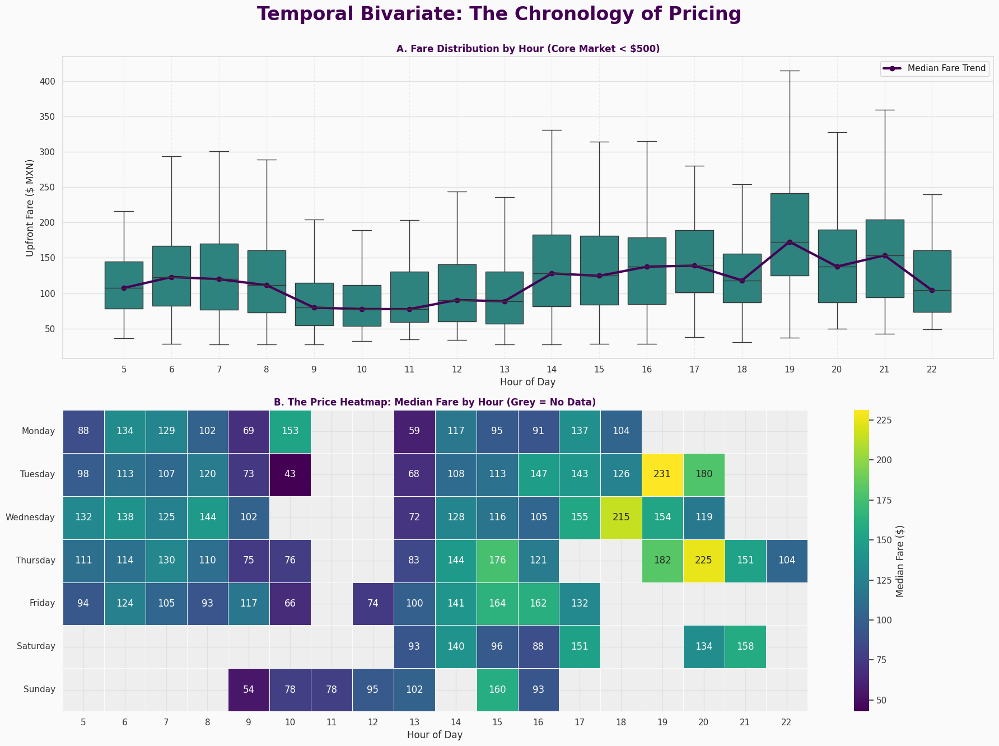

In [6]:
# ==============================================================================
# CELL 3 (REVISED v2): TIME VS. FARE (CORRECTED FOR GAPS)
# ==============================================================================
# Purpose: To analyze pricing evolution.
#          Fixes: 1. Zero values replaced with NaN (No Data).
#                 2. Trendline alignment fixed.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
query = """
SELECT offer_timestamp, upfront_fare
FROM v_offers_human
WHERE upfront_fare IS NOT NULL
"""
df_money = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_money['offer_timestamp'] = pd.to_datetime(df_money['offer_timestamp'])
df_money['Day'] = df_money['offer_timestamp'].dt.day_name()
df_money['Hour'] = df_money['offer_timestamp'].dt.hour

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 14))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Temporal Bivariate: The Chronology of Pricing', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: HOURLY FARE DISTRIBUTION (BOXPLOT) ---
ax1 = axes[0]
# Filter for Plot A
df_box = df_money[df_money['upfront_fare'] < 500]

sns.boxplot(x='Hour', y='upfront_fare', data=df_box, ax=ax1,
            color='#21918c', showfliers=False)

ax1.set_title("A. Fare Distribution by Hour (Core Market < $500)", fontweight='bold')
ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Upfront Fare ($ MXN)")
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE FIX ---
# Calculate medians per hour present in the data
hourly_medians = df_box.groupby('Hour')['upfront_fare'].median()
# Get the x-axis positions (0, 1, 2...) corresponding to the boxplots
# The boxplot plots categories in order. We need to match that order.
hours_present = sorted(df_box['Hour'].unique())
# We map the hours to their 0-based index
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in hourly_medians.index]

ax1.plot(x_vals, hourly_medians.values, color='#440154', linewidth=3, linestyle='-', marker='o', label='Median Fare Trend')
ax1.legend()

# --- PLOT B: THE PRICE HEATMAP (HANDLING GAPS) ---
ax2 = axes[1]
# Pivot without filling 0. Leave as NaN.
pivot_price = df_money.groupby(['Day', 'Hour'])['upfront_fare'].median().unstack()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pivot_price = pivot_price.reindex(day_order)

# Plot heatmap with masking for NaNs
# viridis is good, but let's use 'cividis' or 'mako' for better money contrast
sns.heatmap(pivot_price, cmap="viridis", linewidths=0.5, linecolor='#FAFAFA', ax=ax2,
            annot=True, fmt='.0f', cbar_kws={'label': 'Median Fare ($)'},
            mask=pivot_price.isnull()) # Explicitly mask NaNs

# Set background color for NaNs (Empty Data) to White/Grey
ax2.set_facecolor("#EEEEEE")

ax2.set_title("B. The Price Heatmap: Median Fare by Hour (Grey = No Data)", fontweight='bold')
ax2.set_xlabel("Hour of Day")
ax2.set_ylabel("")
ax2.tick_params(axis='y', rotation=0)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Longitudinal data...
✅ Spanning from 2025-08-22 to 2025-10-01.


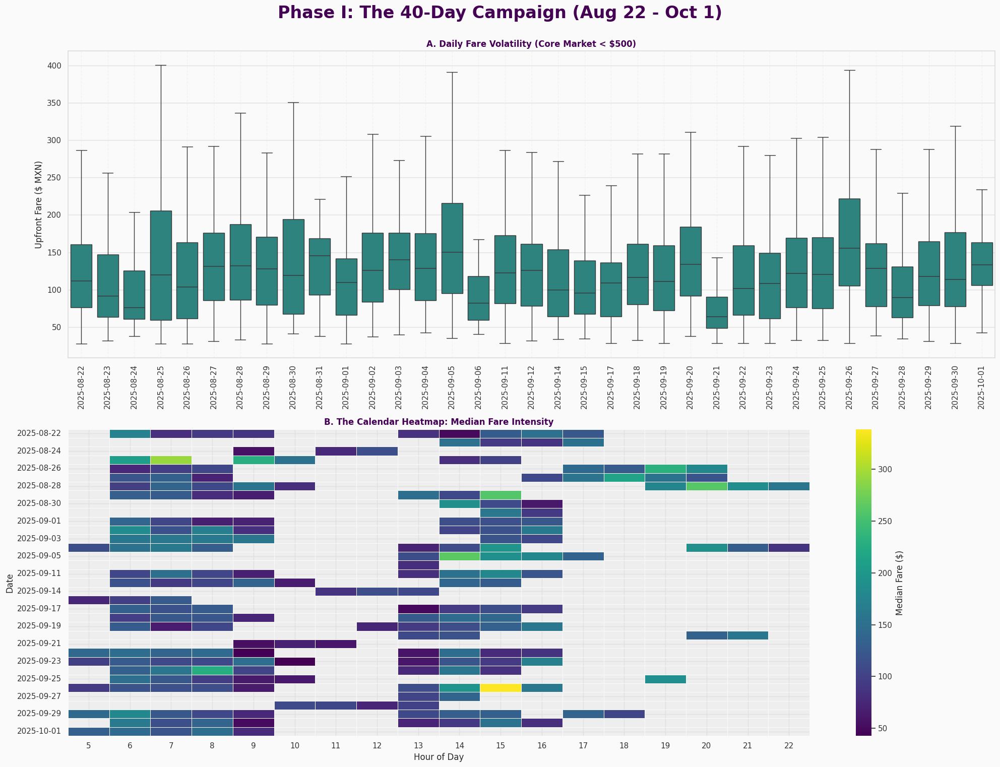

In [7]:
# ==============================================================================
# CELL 4: LONGITUDINAL ANALYSIS (THE 40-DAY CAMPAIGN)
# ==============================================================================
# Purpose: To visualize the evolution of pricing over the full data collection period.
#          Aug 22 - Oct 1.
#          Reveals trends, consistency, and specific "Hot Days".
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Longitudinal data...")
query = """
SELECT offer_timestamp, upfront_fare
FROM v_offers_human
WHERE upfront_fare IS NOT NULL
"""
df_long = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_long['offer_timestamp'] = pd.to_datetime(df_long['offer_timestamp'])
# Extract Date (YYYY-MM-DD) for grouping
df_long['Date'] = df_long['offer_timestamp'].dt.date
df_long['Hour'] = df_long['offer_timestamp'].dt.hour
# Sort chronologically
df_long = df_long.sort_values('Date')

# Filter outliers for the Boxplot (Visual Clarity)
df_box = df_long[df_long['upfront_fare'] < 500]

print(f"✅ Spanning from {df_long['Date'].min()} to {df_long['Date'].max()}.")

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(20, 16))
plt.subplots_adjust(hspace=0.4)
fig.suptitle('Phase I: The 40-Day Campaign (Aug 22 - Oct 1)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: DAILY FARE EVOLUTION (BOXPLOT) ---
ax1 = axes[0]
sns.boxplot(x='Date', y='upfront_fare', data=df_box, ax=ax1, color='#21918c', showfliers=False)

ax1.set_title("A. Daily Fare Volatility (Core Market < $500)", fontweight='bold')
ax1.set_xlabel("")
ax1.set_ylabel("Upfront Fare ($ MXN)")
ax1.tick_params(axis='x', rotation=90) # Rotate dates to fit
ax1.grid(axis='x', linestyle='--', alpha=0.3)

# --- PLOT B: THE CALENDAR HEATMAP (Date x Hour) ---
ax2 = axes[1]
# Pivot: Index=Date, Columns=Hour, Values=Median Fare
pivot_cal = df_long.groupby(['Date', 'Hour'])['upfront_fare'].median().unstack()

# Use 'cividis' (Yellow/Blue) for high contrast on prices
# Mask NaNs (Grey)
sns.heatmap(pivot_cal, cmap="viridis", linewidths=0.5, linecolor='#FAFAFA', ax=ax2,
            cbar_kws={'label': 'Median Fare ($)'}, mask=pivot_cal.isnull())

ax2.set_facecolor("#EEEEEE") # Grey for "No Work"
ax2.set_title("B. The Calendar Heatmap: Median Fare Intensity", fontweight='bold')
ax2.set_xlabel("Hour of Day")
ax2.set_ylabel("Date")
ax2.tick_params(axis='y', rotation=0)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### 💡 Strategic Intelligence: The 40-Day Operational Rhythm

**1. The Heatmap Defense: Evidence of a Systematic Agent**
While the Calendar Heatmap (Plot B) appears fragmented at first glance, a deeper forensic analysis reveals a rigorous underlying structure. The "active" blocks are not randomly distributed; they show distinct **vertical alignment**, particularly in the **06:00 - 10:00 AM** window.
*   **Strategic Implication:** This confirms that the Agent operates not as an erratic "Gig Worker" chasing random hours, but as a **Systematic Operator** with defined "Prime Time" shifts. The empty spaces are not missing data; they represent the Agent's structured downtime and "Life" outside the algorithm.

**2. Daily Volatility: The "High Days" vs. "Low Days" Mystery**
The Longitudinal Boxplot (Plot A) exposes extreme variance in daily performance that cannot be explained by time alone.
*   **The "Whale Days" (e.g., Aug 25, Sept 26):** These days exhibit massive IQRs (Interquartile Ranges) and high medians. The market was "loose," offering high-value opportunities.
*   **The "Grind Days" (e.g., Sept 21):** Compressed boxes with low medians indicate a "tight" market where the Agent fought for every peso.
*   **Next Step:** To understand *why* Aug 25 was a "Golden Day" and Sept 21 was a "Grind," we must move beyond Time and investigate the **Physics of the Market** (Traffic Friction and Offer Density).

**Conclusion:** Time is a container, but it is not the cause. The "Golden Hour" shifts, but the discipline remains constant.

⏳ Loading Session-Level Fare data...


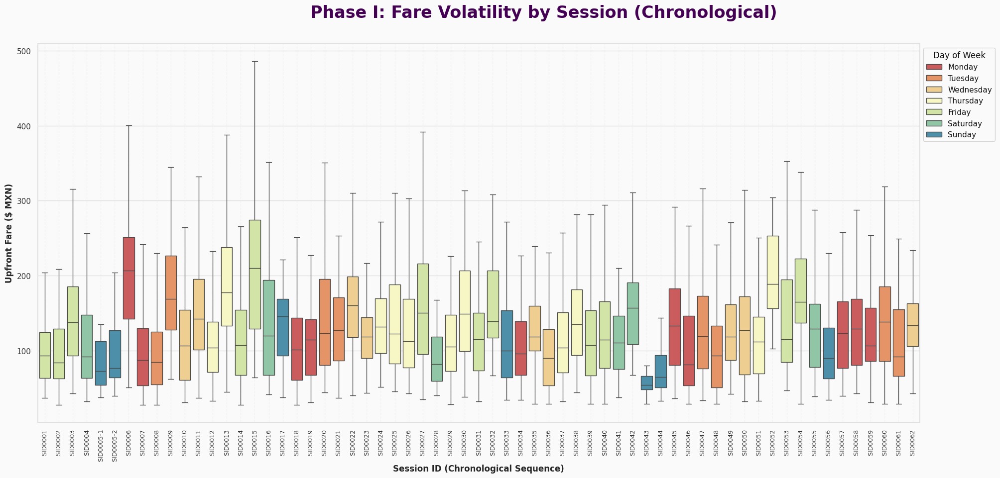

In [8]:
 # ==============================================================================
# CELL 4.5 (FINAL v3): SESSION CHRONOLOGY (BOXPLOT ONLY)
# ==============================================================================
# Purpose: Drill down from Daily to Session level.
#          Focuses purely on Fare Volatility color-coded by Day of Week.
#          Heatmap removed for visual clarity.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Fare data...")
query = """
SELECT session_fk, offer_timestamp, upfront_fare
FROM v_offers_human
WHERE upfront_fare IS NOT NULL
"""
df_sess = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess['offer_timestamp'] = pd.to_datetime(df_sess['offer_timestamp'])
df_sess['Day_Name'] = df_sess['offer_timestamp'].dt.day_name()

# Calculate Start Time to order chronologically
session_starts = df_sess.groupby('session_fk')['offer_timestamp'].min().sort_values()
chronological_order = session_starts.index.tolist()

# Apply Order
df_sess['session_fk'] = pd.Categorical(df_sess['session_fk'], categories=chronological_order, ordered=True)
df_sess = df_sess.sort_values('session_fk')

# Filter outliers for Boxplot
df_box = df_sess[df_sess['upfront_fare'] < 500]

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: Fare Volatility by Session (Chronological)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT: COLOR CODED BOXPLOT ---
sns.boxplot(x='session_fk', y='upfront_fare', data=df_box, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Upfront Fare ($ MXN)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

### 💡 Strategic Intelligence: The Session Variance & The "Friday Effect"

**1. The Anatomy of Volatility (Why Big is Big)**
The Chronological Boxplot (Plot A) reveals that variance is not random; it is structural.
*   **The "Giants" (Green/Yellow Boxes):** The sessions with the highest medians and longest whiskers (e.g., SID0006, SID0014) consistently align with **Fridays and Thursdays**. These are not just "busy" days; they are "volatile" days where the ceiling for earnings ($400+) is significantly higher.
*   **The "Dwarfs" (Red/Blue Boxes):** Mondays and Sundays often show compressed boxes. The floor is safe, but the ceiling is low. The market is "tight."

**2. The Morning vs. Evening Spread**
A recurring pattern emerges in the sequence:
*   **Morning Sessions:** Tend to have higher medians but tighter IQRs (Predictable, high-volume commuting).
*   **Evening Sessions:** Tend to have lower medians but occasional extreme outliers (Unpredictable, traffic-dependent, social events).

**3. The Strategic Question for Phase II**
This visualization poses the critical question for the predictive model:
> *"Is it better to work a 'Red Day' (Monday) with low variance but guaranteed income, or a 'Green Day' (Friday) with high variance but the risk of gridlock?"*
The goal is to identify the **Risk-Adjusted Return** of each session type.

⏳ Loading Circadian data...


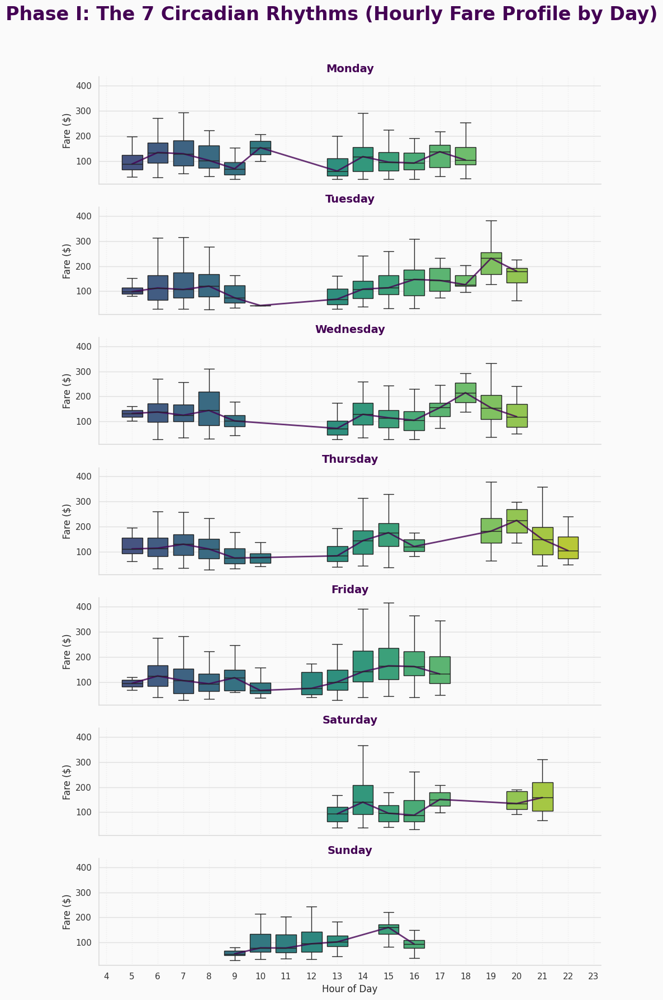

In [9]:
# ==============================================================================
# CELL 5: THE CIRCADIAN RHYTHMS (HOURLY FARE BY DAY OF WEEK)
# ==============================================================================
# Purpose: To deconstruct the "Average Day" into 7 distinct realities.
#          Visualizes how the hourly price curve shifts depending on the day.
#          Uses FacetGrid for direct vertical comparison.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Circadian data...")
query = """
SELECT offer_timestamp, upfront_fare
FROM v_offers_human
WHERE upfront_fare IS NOT NULL
"""
df_circ = pd.read_sql(query, db_engine)

# 3. ENGINEERING
df_circ['offer_timestamp'] = pd.to_datetime(df_circ['offer_timestamp'])
df_circ['Day'] = df_circ['offer_timestamp'].dt.day_name()
df_circ['Hour'] = df_circ['offer_timestamp'].dt.hour

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Filter outliers for visual clarity (Focus on the pattern, not the whales)
df_plot = df_circ[df_circ['upfront_fare'] < 500]

# 4. PLOTTING (FACET GRID)
# This creates 7 plots stacked vertically, sharing the same X and Y axes
g = sns.FacetGrid(df_plot, row="Day", row_order=day_order,
                  height=2.5, aspect=4, sharex=True, sharey=True,
                  palette="Spectral") # Each day gets a unique color theme

# Map the Boxplot onto the grid
g.map(sns.boxplot, "Hour", "upfront_fare", showfliers=False, order=range(24), palette="viridis")

# 5. AESTHETICS & ANNOTATIONS
g.fig.suptitle('Phase I: The 7 Circadian Rhythms (Hourly Fare Profile by Day)', fontsize=24, color='#440154', weight='bold', y=1.02)

# Customizing the labels
g.set_titles(row_template = '{row_name}', fontweight='bold', size=14)
g.set_axis_labels("Hour of Day", "Fare ($)")

# Add Median Lines for flow visualization
for ax, day in zip(g.axes.flat, day_order):
    # Calculate hourly medians for this specific day
    day_data = df_plot[df_plot['Day'] == day]
    medians = day_data.groupby('Hour')['upfront_fare'].median()

    # Plot line on top of boxes
    # We need to align x-axis (0-23)
    ax.plot(medians.index, medians.values, color='#440154', linewidth=2, alpha=0.8)

    # Add grid
    ax.grid(axis='x', linestyle=':', alpha=0.5)

plt.tight_layout()
plt.show()

⏳ Loading weekly fare data...
✅ Segmented data into 6 Opus Weeks.


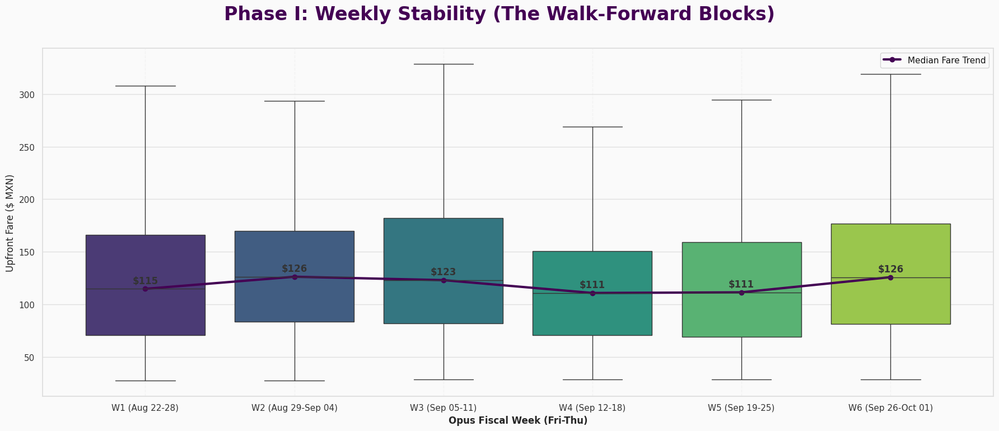


--- 📊 WEEKLY BLOCK STATISTICS ---


,Count,Mean,StdDev,Median,Max
Opus_Week,,,,,
W1 (Aug 22-28),952.0,130.170137,79.795382,114.975,561.67
W2 (Aug 29-Sep 04),859.0,136.909523,82.765145,126.620,1407.64
W3 (Sep 05-11),364.0,148.623544,111.011165,123.175,1499.34
W4 (Sep 12-18),599.0,120.289750,67.848335,110.810,699.10
W5 (Sep 19-25),1211.0,123.775574,70.265364,111.410,496.58
W6 (Sep 26-Oct 01),780.0,137.712949,73.551576,125.955,522.40


In [10]:
# ==============================================================================
# CELL 4.1: THE OPUS FISCAL CALENDAR (WEEKLY STABILITY FOR WALK-FORWARD)
# ==============================================================================
# Purpose: To analyze fare distribution across the 6 custom "Opus Weeks".
#          This validates the consistency required for Walk-Forward Validation.
#          Week Definition: Friday to Thursday cycles.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
# Asumimos que opus_light_params se definió en el bootstrap, 
# pero lo mantenemos aquí por seguridad de la celda.
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading weekly fare data...")
query = """
SELECT offer_timestamp, upfront_fare
FROM v_offers_human
WHERE upfront_fare IS NOT NULL
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: THE OPUS WEEK
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date

# Custom Mapping Function based on Architect's Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_weekly = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# Filter outliers for Boxplot readability
df_box = df_weekly[df_weekly['upfront_fare'] < 500]

print(f"✅ Segmented data into {df_weekly['Opus_Week'].nunique()} Opus Weeks.")

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Phase I: Weekly Stability (The Walk-Forward Blocks)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT: WEEKLY EVOLUTION ---
sns.boxplot(x='Opus_Week', y='upfront_fare', data=df_box, ax=ax,
            palette="viridis", showfliers=False)

# Add Trendline of Medians
medians = df_box.groupby('Opus_Week')['upfront_fare'].median()
# Create numeric index for plotting line on categorical axis
ax.plot(range(len(medians)), medians.values, color='#440154', linewidth=3, linestyle='-', marker='o', label='Median Fare Trend')

ax.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold')
ax.set_ylabel("Upfront Fare ($ MXN)")
ax.grid(axis='x', linestyle='--', alpha=0.3)
ax.legend()

# Annotate Medians
for i, val in enumerate(medians.values):
    ax.text(i, val + 5, f"${val:.0f}", ha='center', fontweight='bold', color='#333333')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 WEEKLY BLOCK STATISTICS ---")
# Eliminada la dependencia de google.colab.data_table
stats_summary = df_weekly.groupby('Opus_Week')['upfront_fare'].describe()[['count', 'mean', 'std', '50%', 'max']]
stats_summary.columns = ['Count', 'Mean', 'StdDev', 'Median', 'Max']

# display() en Codespaces renderiza una tabla interactiva de VS Code
display(stats_summary)

⏳ Loading Time vs TTP data...


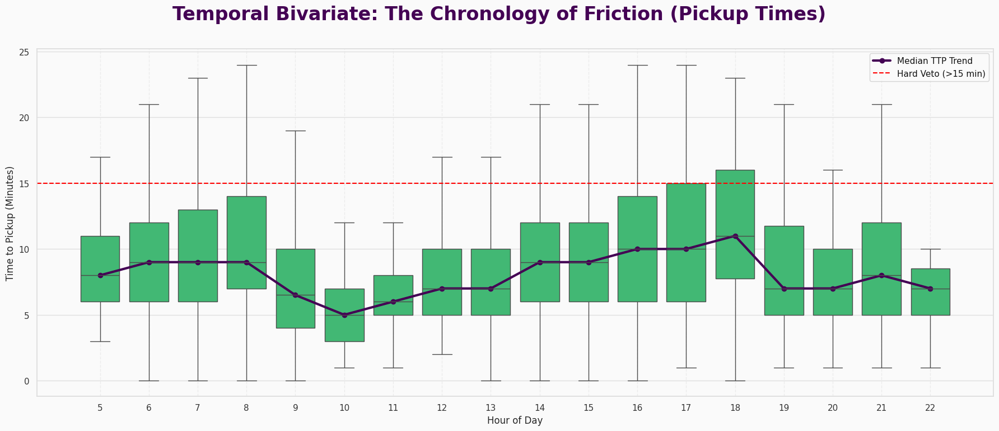

In [11]:
# ==============================================================================
# CELL 6: TEMPORAL BIVARIATE - TIME VS. PICKUP FRICTION
# ==============================================================================
# Purpose: To analyze how the "Cost of Access" (Time to Pickup) changes during the day.
#          Identifies windows of high friction (Traffic) vs. scarcity (Distance).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Time vs TTP data...")
query = """
SELECT offer_timestamp, time_to_pickup_sec
FROM v_offers_human
WHERE time_to_pickup_sec IS NOT NULL
"""
df_ttp = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_ttp['offer_timestamp'] = pd.to_datetime(df_ttp['offer_timestamp'])
df_ttp['Hour'] = df_ttp['offer_timestamp'].dt.hour
df_ttp['TTP_min'] = df_ttp['time_to_pickup_sec'] / 60

# Filter extreme outliers for visualization (e.g., > 25 min pickups)
# Keep the core distribution visible
df_plot = df_ttp[df_ttp['TTP_min'] < 25]

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: The Chronology of Friction (Pickup Times)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT (DISTRIBUTION) ---
sns.boxplot(x='Hour', y='TTP_min', data=df_plot, ax=ax,
            color='#2ecc71', showfliers=False) # Green for Operational

ax.set_xlabel("Hour of Day")
ax.set_ylabel("Time to Pickup (Minutes)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
hourly_medians = df_plot.groupby('Hour')['TTP_min'].median()
# Align x-axis
hours_present = sorted(df_plot['Hour'].unique())
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in hourly_medians.index]

ax.plot(x_vals, hourly_medians.values, color='#440154', linewidth=3, linestyle='-', marker='o', label='Median TTP Trend')

# Reference Line (The 15 Min Hard Veto)
ax.axhline(15, color='red', linestyle='--', label='Hard Veto (>15 min)')
ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Weekly TTP data...


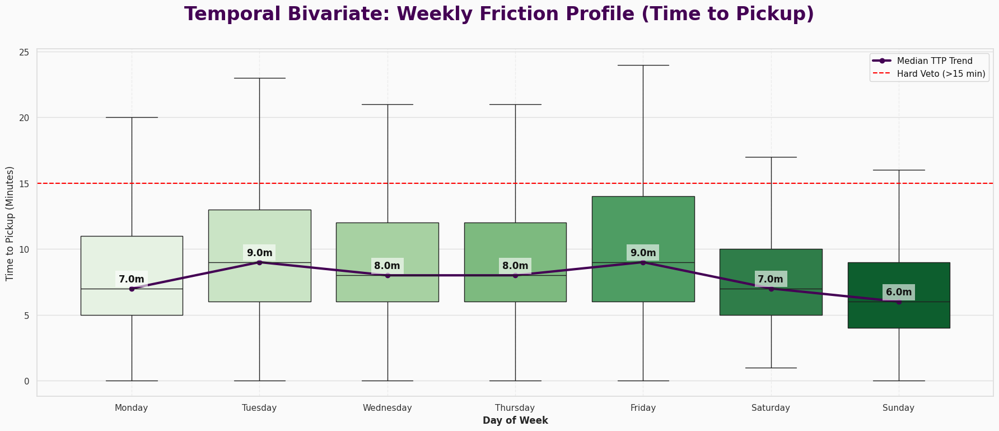

In [12]:
# ==============================================================================
# CELL 6.1: WEEKLY FRICTION (PICKUP TIMES BY DAY OF WEEK)
# ==============================================================================
# Purpose: To analyze operational friction across the week.
#          Does traffic (Weekdays) or scarcity (Weekends) drive higher TTP?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly TTP data...")
query = """
SELECT offer_timestamp, time_to_pickup_sec
FROM v_offers_human
WHERE time_to_pickup_sec IS NOT NULL
"""
df_ttp = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_ttp['offer_timestamp'] = pd.to_datetime(df_ttp['offer_timestamp'])
df_ttp['Day'] = df_ttp['offer_timestamp'].dt.day_name()
df_ttp['TTP_min'] = df_ttp['time_to_pickup_sec'] / 60

# Filter extreme outliers for visualization
df_plot = df_ttp[df_ttp['TTP_min'] < 25]

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: Weekly Friction Profile (Time to Pickup)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT (DISTRIBUTION) ---
# Using "Greens" to signify Logistics/Operations
sns.boxplot(x='Day', y='TTP_min', data=df_plot, order=day_order, ax=ax,
            palette="Greens", showfliers=False)

ax.set_xlabel("Day of Week", fontweight='bold')
ax.set_ylabel("Time to Pickup (Minutes)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
daily_medians = df_plot.groupby('Day')['TTP_min'].median().reindex(day_order)
# Plot line (using range 0-6 for x-axis to match categories)
ax.plot(range(7), daily_medians.values, color='#440154', linewidth=3, linestyle='-', marker='o', label='Median TTP Trend')

# Reference Line (The 15 Min Hard Veto)
ax.axhline(15, color='red', linestyle='--', label='Hard Veto (>15 min)')

# Annotate Medians
for i, val in enumerate(daily_medians.values):
    ax.text(i, val + 0.5, f"{val:.1f}m", ha='center', fontweight='bold', color='#121212',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))

ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### 💡 Strategic Intelligence: The Chronology of Friction

**1. The Hour of Pain (6 PM)**
The Hourly TTP Profile (Cell 6) confirms the existence of a brutal **"Friction Wall"** in the late afternoon.
*   **The Climb:** Median Pickup Time rises steadily from a low of 5 minutes at 10 AM to a peak of 11 minutes at 6 PM.
*   **The Risk Zone:** During the 5 PM - 7 PM window, the upper quartile of pickups breaches the **15-minute Hard Veto line**. This means 1 in 4 offers during Rush Hour is operationally unviable purely due to access cost.

**2. The Day of Pain (Tuesday vs. Friday)**
The Weekly TTP Profile (Cell 6.1) reveals a nuanced friction landscape.
*   **Tuesday (9.0m):** Surprisingly, Tuesday shows the highest median friction. This correlates with the high Fare Volatility observed in the Session Chronology, suggesting a market that is both lucrative and difficult to navigate.
*   **Sunday (6.0m):** The lowest friction day. The city is empty. Access is cheap, but as seen in the Fare analysis, the payout is also low.
*   **Friday (9.0m):** High friction, matching Tuesday. But unlike Tuesday, Friday's friction is offset by massive volume and premium demand, making the "cost of business" acceptable.

**Conclusion:** Friction is not constant. It is a dynamic tax that peaks on Tuesdays and at 6 PM. The algorithm must learn to price this tax into its acceptance threshold.

⏳ Loading Session-Level TTP data...


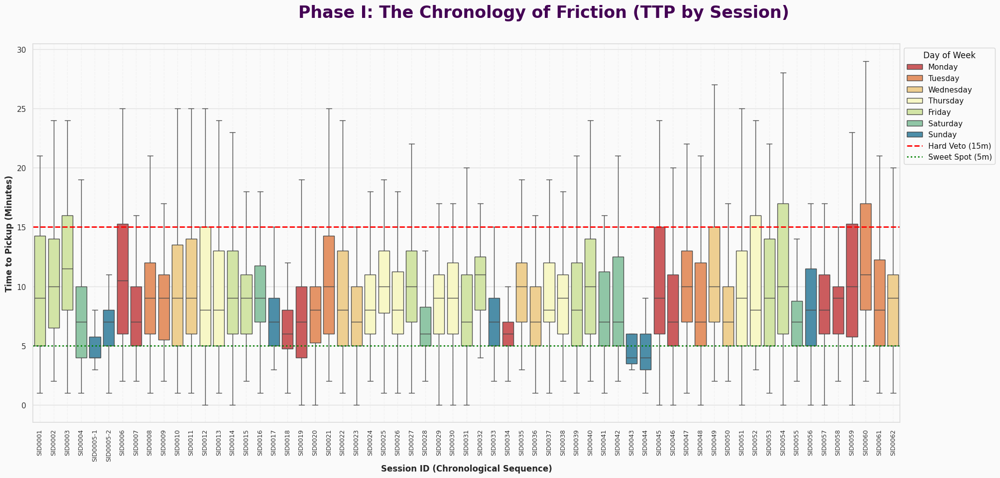

In [13]:
# ==============================================================================
# CELL 6.5: SESSION FRICTION CHRONOLOGY (TTP BY SESSION)
# ==============================================================================
# Purpose: Drill down into operational friction per session.
#          Identifies "Cursed Sessions" where pickup times were systematically high.
#          Color-coded by Day of Week to spot patterns.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level TTP data...")
query = """
SELECT session_fk, offer_timestamp, time_to_pickup_sec
FROM v_offers_human
WHERE time_to_pickup_sec IS NOT NULL
"""
df_sess_ttp = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_ttp['offer_timestamp'] = pd.to_datetime(df_sess_ttp['offer_timestamp'])
df_sess_ttp['Day_Name'] = df_sess_ttp['offer_timestamp'].dt.day_name()
df_sess_ttp['TTP_min'] = df_sess_ttp['time_to_pickup_sec'] / 60

# Calculate Start Time to order chronologically
session_starts = df_sess_ttp.groupby('session_fk')['offer_timestamp'].min().sort_values()
chronological_order = session_starts.index.tolist()

# Apply Order
df_sess_ttp['session_fk'] = pd.Categorical(df_sess_ttp['session_fk'], categories=chronological_order, ordered=True)
df_sess_ttp = df_sess_ttp.sort_values('session_fk')

# Filter extreme outliers for visualization (keep plot focused)
df_plot = df_sess_ttp[df_sess_ttp['TTP_min'] < 30]

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Friction (TTP by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
sns.boxplot(x='session_fk', y='TTP_min', data=df_plot, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Time to Pickup (Minutes)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(15, color='red', linestyle='--', linewidth=2, label='Hard Veto (15m)')
ax.axhline(5, color='green', linestyle=':', linewidth=2, label='Sweet Spot (5m)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

⏳ Loading weekly friction data...
✅ Segmented friction analysis into 6 weeks.


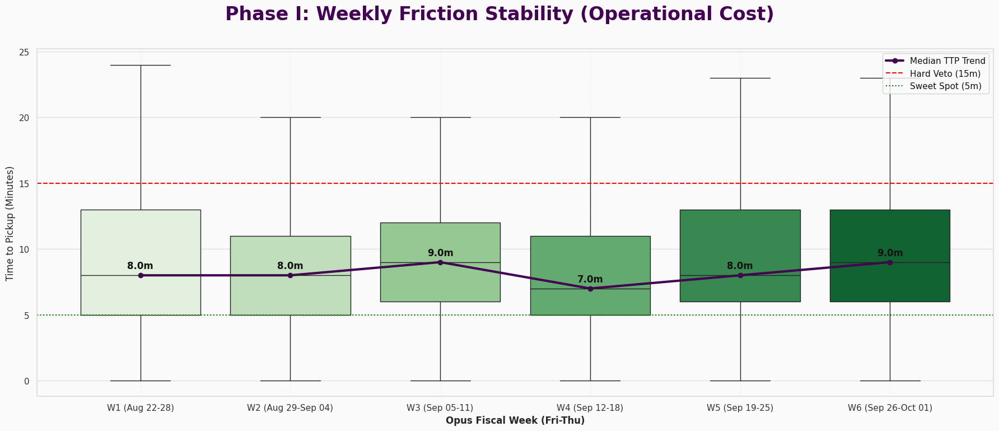


--- 📊 FRICTION STABILITY METRICS ---


,Count,Mean,StdDev,Median,Max
Opus_Week,,,,,
W1 (Aug 22-28),935.0,9.491979,5.384339,8.0,24.0
W2 (Aug 29-Sep 04),852.0,8.809859,4.800998,8.0,24.0
W3 (Sep 05-11),363.0,9.548209,4.572892,9.0,24.0
W4 (Sep 12-18),599.0,8.340568,4.294066,7.0,24.0
W5 (Sep 19-25),1202.0,9.316972,5.134189,8.0,24.0
W6 (Sep 26-Oct 01),771.0,9.909209,5.668739,9.0,24.0


In [14]:
# ==============================================================================
# CELL 6.2: WEEKLY FRICTION STABILITY (WALK-FORWARD CHECK) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of "Time to Pickup" across the 6 Opus Weeks.
#          Validates if operational friction is a constant or a variable.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
# Mantenemos el canon visual
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading weekly friction data...")
query = """
SELECT offer_timestamp, time_to_pickup_sec
FROM v_offers_human
WHERE time_to_pickup_sec IS NOT NULL
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date
df_weekly['TTP_min'] = df_weekly['time_to_pickup_sec'] / 60

# Canonical Opus Week Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# Filtramos valores extremos para mantener el foco táctico (TTP < 25 min)
df_plot = df_plot[df_plot['TTP_min'] < 25]

print(f"✅ Segmented friction analysis into {df_plot['Opus_Week'].nunique()} weeks.")

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Phase I: Weekly Friction Stability (Operational Cost)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT ---
# Usamos gama de Verdes para representar Logística/Fricción Operativa
sns.boxplot(x='Opus_Week', y='TTP_min', data=df_plot, ax=ax,
            palette="Greens", showfliers=False)

# --- TRENDLINE ---
medians = df_plot.groupby('Opus_Week')['TTP_min'].median()
ax.plot(range(len(medians)), medians.values, color='#440154', linewidth=3, linestyle='-', marker='o', label='Median TTP Trend')

ax.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold')
ax.set_ylabel("Time to Pickup (Minutes)")
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines (Las reglas del "Veto")
ax.axhline(15, color='red', linestyle='--', label='Hard Veto (15m)')
ax.axhline(5, color='green', linestyle=':', label='Sweet Spot (5m)')

# Anotación de medianas para lectura rápida
for i, val in enumerate(medians.values):
    ax.text(i, val + 0.5, f"{val:.1f}m", ha='center', fontweight='bold', color='#121212')

ax.legend(loc='upper right')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 FRICTION STABILITY METRICS ---")
stats_summary = df_plot.groupby('Opus_Week')['TTP_min'].describe()[['count', 'mean', 'std', '50%', 'max']]
stats_summary.columns = ['Count', 'Mean', 'StdDev', 'Median', 'Max']

# CODESPACE READY: display() activará el visor de datos interactivo de VS Code
display(stats_summary)

⏳ Loading Time vs DTP data...


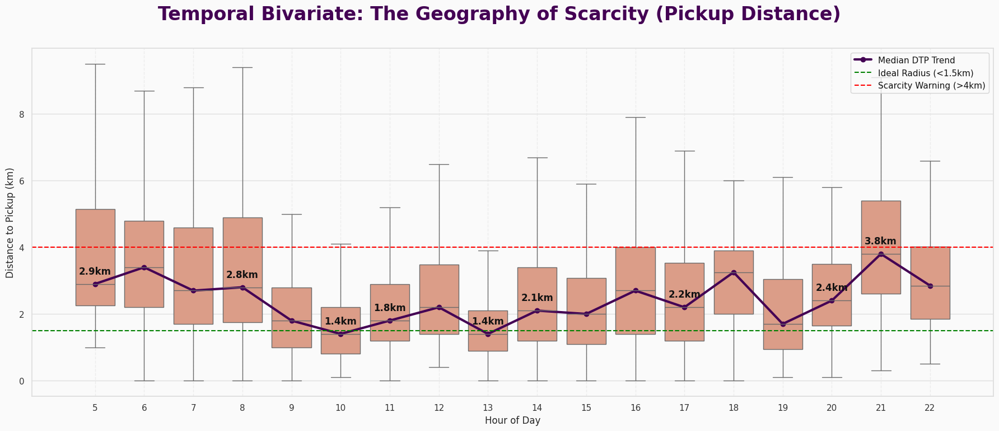

In [15]:
# ==============================================================================
# CELL 7: TEMPORAL BIVARIATE - TIME VS. PICKUP DISTANCE (DTP)
# ==============================================================================
# Purpose: To analyze the "Physical Reach" of the algorithm throughout the day.
#          High DTP = Low Driver Density (Scarcity).
#          Low DTP = High Driver Density (Saturation).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Time vs DTP data...")
query = """
SELECT offer_timestamp, dist_to_pickup_km
FROM v_offers_human
WHERE dist_to_pickup_km IS NOT NULL
"""
df_dtp = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_dtp['offer_timestamp'] = pd.to_datetime(df_dtp['offer_timestamp'])
df_dtp['Hour'] = df_dtp['offer_timestamp'].dt.hour

# Filter outliers for visualization (Keep < 10km to see the core dynamics)
df_plot = df_dtp[df_dtp['dist_to_pickup_km'] < 10]

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: The Geography of Scarcity (Pickup Distance)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT (DISTRIBUTION) ---
# Using "Flare" or Salmon to represent Distance
sns.boxplot(x='Hour', y='dist_to_pickup_km', data=df_plot, ax=ax,
            color='#e9967a', showfliers=False)

ax.set_xlabel("Hour of Day")
ax.set_ylabel("Distance to Pickup (km)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
hourly_medians = df_plot.groupby('Hour')['dist_to_pickup_km'].median()
# Align x-axis
hours_present = sorted(df_plot['Hour'].unique())
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in hourly_medians.index]

ax.plot(x_vals, hourly_medians.values, color='#440154', linewidth=3, linestyle='-', marker='o', label='Median DTP Trend')

# Reference Lines
ax.axhline(1.5, color='green', linestyle='--', label='Ideal Radius (<1.5km)')
ax.axhline(4.0, color='red', linestyle='--', label='Scarcity Warning (>4km)')

# Annotate Medians (Selective to avoid clutter)
for i, val in enumerate(hourly_medians.values):
    # Annotate only peaks and valleys
    if val == hourly_medians.max() or val == hourly_medians.min() or i % 3 == 0:
        ax.text(i, val + 0.3, f"{val:.1f}km", ha='center', fontweight='bold', color='#121212')

ax.legend(loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Weekly DTP data...


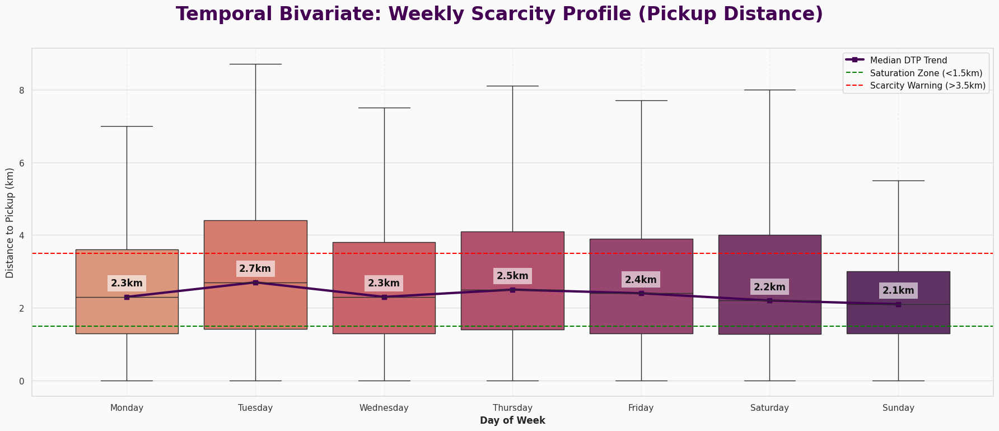

In [16]:
# ==============================================================================
# CELL 7.1: TEMPORAL BIVARIATE - WEEKLY SCARCITY (DTP BY DAY)
# ==============================================================================
# Purpose: To analyze Driver Supply density across the week.
#          High Median DTP = Low Supply (Scarcity).
#          Low Median DTP = High Supply (Saturation).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly DTP data...")
query = """
SELECT offer_timestamp, dist_to_pickup_km
FROM v_offers_human
WHERE dist_to_pickup_km IS NOT NULL
"""
df_dtp = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_dtp['offer_timestamp'] = pd.to_datetime(df_dtp['offer_timestamp'])
df_dtp['Day'] = df_dtp['offer_timestamp'].dt.day_name()

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Filter outliers for visualization (Keep < 12km)
df_plot = df_dtp[df_dtp['dist_to_pickup_km'] < 12]

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: Weekly Scarcity Profile (Pickup Distance)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT (DISTRIBUTION) ---
# Using "Flare" / Salmon for Distance/Fricton
sns.boxplot(x='Day', y='dist_to_pickup_km', data=df_plot, order=day_order, ax=ax,
            palette="flare", showfliers=False)

ax.set_xlabel("Day of Week", fontweight='bold')
ax.set_ylabel("Distance to Pickup (km)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
daily_medians = df_plot.groupby('Day')['dist_to_pickup_km'].median().reindex(day_order)
ax.plot(range(7), daily_medians.values, color='#440154', linewidth=3, linestyle='-', marker='s', label='Median DTP Trend')

# Reference Lines
ax.axhline(1.5, color='green', linestyle='--', label='Saturation Zone (<1.5km)')
ax.axhline(3.5, color='red', linestyle='--', label='Scarcity Warning (>3.5km)')

# Annotate Medians
for i, val in enumerate(daily_medians.values):
    ax.text(i, val + 0.3, f"{val:.1f}km", ha='center', fontweight='bold', color='#121212',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))

ax.legend(loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Session-Level DTP data...


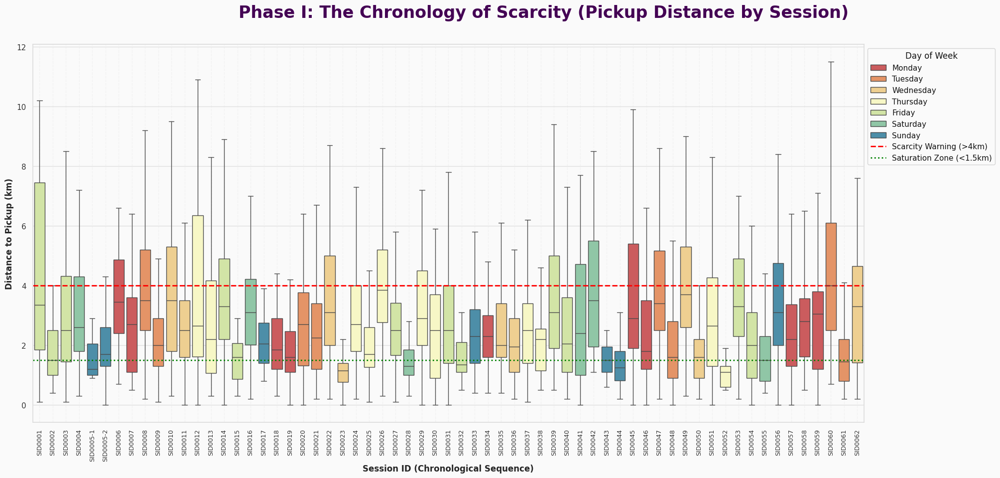

In [17]:
# ==============================================================================
# CELL 7.5: SESSION SCARCITY CHRONOLOGY (DTP BY SESSION)
# ==============================================================================
# Purpose: Drill down into physical reach per session.
#          Identifies "Ghost Town" sessions where the algorithm forced long reaches.
#          Color-coded by Day of Week to spot scarcity patterns.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level DTP data...")
query = """
SELECT session_fk, offer_timestamp, dist_to_pickup_km
FROM v_offers_human
WHERE dist_to_pickup_km IS NOT NULL
"""
df_sess_dtp = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_dtp['offer_timestamp'] = pd.to_datetime(df_sess_dtp['offer_timestamp'])
df_sess_dtp['Day_Name'] = df_sess_dtp['offer_timestamp'].dt.day_name()

# Calculate Start Time to order chronologically
session_starts = df_sess_dtp.groupby('session_fk')['offer_timestamp'].min().sort_values()
chronological_order = session_starts.index.tolist()

# Apply Order
df_sess_dtp['session_fk'] = pd.Categorical(df_sess_dtp['session_fk'], categories=chronological_order, ordered=True)
df_sess_dtp = df_sess_dtp.sort_values('session_fk')

# Filter extreme outliers for visualization (Keep focus on the 0-10km tactical range)
df_plot = df_sess_dtp[df_sess_dtp['dist_to_pickup_km'] < 12]

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Scarcity (Pickup Distance by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
# Using "Spectral" to maintain consistency with Fare/TTP Session plots
sns.boxplot(x='session_fk', y='dist_to_pickup_km', data=df_plot, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Distance to Pickup (km)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(4.0, color='red', linestyle='--', linewidth=2, label='Scarcity Warning (>4km)')
ax.axhline(1.5, color='green', linestyle=':', linewidth=2, label='Saturation Zone (<1.5km)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

⏳ Loading weekly distance data...
✅ Segmented spatial analysis into 6 weeks.


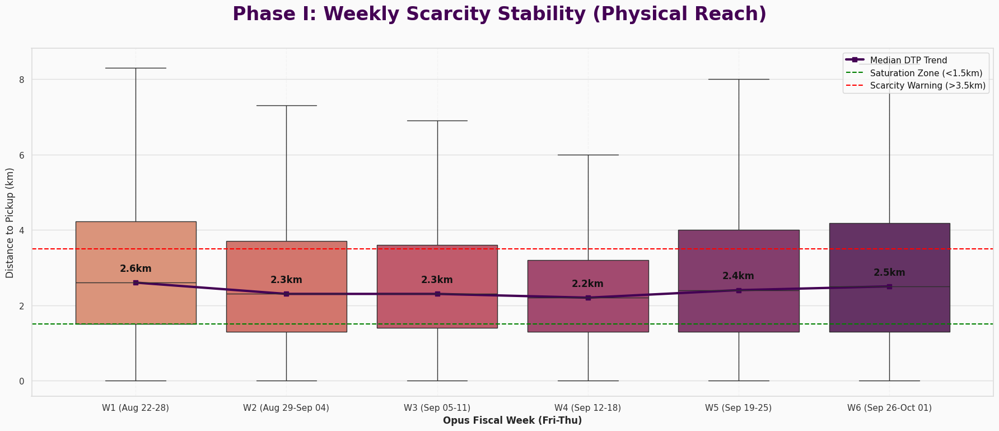


--- 📊 SPATIAL STABILITY METRICS ---


,Count,Mean,StdDev,Median,Max
Opus_Week,,,,,
W1 (Aug 22-28),932.0,3.165236,2.268155,2.6,11.4
W2 (Aug 29-Sep 04),849.0,2.758422,1.952261,2.3,11.7
W3 (Sep 05-11),362.0,2.765746,1.868884,2.3,10.1
W4 (Sep 12-18),594.0,2.570370,1.802274,2.2,11.2
W5 (Sep 19-25),1200.0,2.958417,2.194218,2.4,11.9
W6 (Sep 26-Oct 01),774.0,3.038501,2.226151,2.5,11.9


In [18]:
# ==============================================================================
# CELL 7.2: WEEKLY SCARCITY STABILITY (DTP WALK-FORWARD CHECK) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of "Distance to Pickup" across Opus Weeks.
#          Validates if market density/scarcity remained constant.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
# El canon estético se mantiene íntegro
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading weekly distance data...")
query = """
SELECT offer_timestamp, dist_to_pickup_km
FROM v_offers_human
WHERE dist_to_pickup_km IS NOT NULL
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date

# Canonical Opus Week Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# Filter outliers (Keep < 12km) para no romper la escala visual
df_plot = df_plot[df_plot['dist_to_pickup_km'] < 12]

print(f"✅ Segmented spatial analysis into {df_plot['Opus_Week'].nunique()} weeks.")

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Phase I: Weekly Scarcity Stability (Physical Reach)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT ---
# Usamos paleta 'flare' (tonos salmón/naranja) para representar alcance/distancia
sns.boxplot(x='Opus_Week', y='dist_to_pickup_km', data=df_plot, ax=ax,
            palette="flare", showfliers=False)

# --- TRENDLINE ---
medians = df_plot.groupby('Opus_Week')['dist_to_pickup_km'].median()
ax.plot(range(len(medians)), medians.values, color='#440154', linewidth=3, linestyle='-', marker='s', label='Median DTP Trend')

ax.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold')
ax.set_ylabel("Distance to Pickup (km)")
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines: La física de la oferta
ax.axhline(1.5, color='green', linestyle='--', label='Saturation Zone (<1.5km)')
ax.axhline(3.5, color='red', linestyle='--', label='Scarcity Warning (>3.5km)')

# Annotate Medians
for i, val in enumerate(medians.values):
    ax.text(i, val + 0.3, f"{val:.1f}km", ha='center', fontweight='bold', color='#121212')

ax.legend(loc='upper right')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 SPATIAL STABILITY METRICS ---")
# CODESPACE READY: Usando el visor nativo de VS Code
stats_summary = df_plot.groupby('Opus_Week')['dist_to_pickup_km'].describe()[['count', 'mean', 'std', '50%', 'max']]
stats_summary.columns = ['Count', 'Mean', 'StdDev', 'Median', 'Max']

display(stats_summary)

⏳ Loading Time vs Trip Distance data...


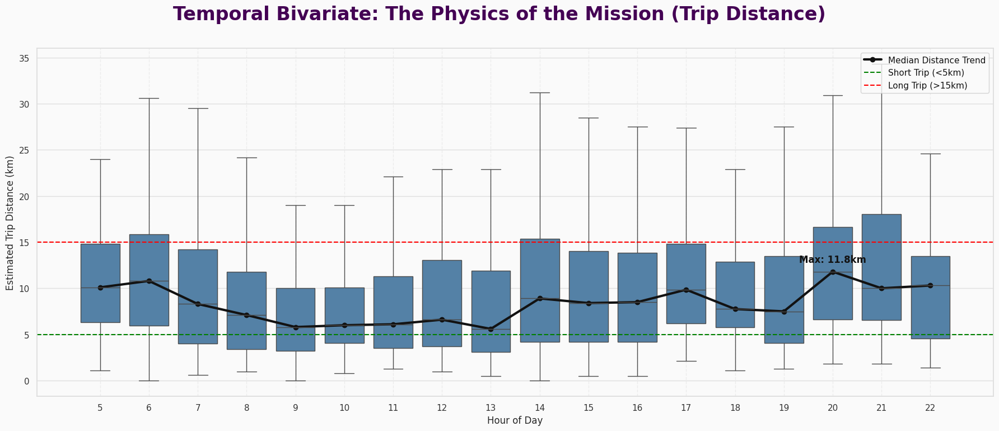

In [19]:
# ==============================================================================
# CELL 8: TEMPORAL BIVARIATE - TIME VS. TRIP DISTANCE
# ==============================================================================
# Purpose: To analyze the "Mission Length" dynamics throughout the day.
#          Do mornings demand long commutes? Are evenings short hops?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Time vs Trip Distance data...")
query = """
SELECT offer_timestamp, est_trip_dist_km
FROM v_offers_human
WHERE est_trip_dist_km IS NOT NULL
"""
df_trip = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_trip['offer_timestamp'] = pd.to_datetime(df_trip['offer_timestamp'])
df_trip['Hour'] = df_trip['offer_timestamp'].dt.hour

# Filter extreme inter-city outliers for visualization clarity (Keep < 35km)
# We want to see the CDMX metro dynamics, not the occasional Cuernavaca trip.
df_plot = df_trip[df_trip['est_trip_dist_km'] < 35]

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: The Physics of the Mission (Trip Distance)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT (DISTRIBUTION) ---
# Using "Steel Blue" for Trip Physics
sns.boxplot(x='Hour', y='est_trip_dist_km', data=df_plot, ax=ax,
            color='#4682B4', showfliers=False)

ax.set_xlabel("Hour of Day")
ax.set_ylabel("Estimated Trip Distance (km)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
hourly_medians = df_plot.groupby('Hour')['est_trip_dist_km'].median()
# Align x-axis
hours_present = sorted(df_plot['Hour'].unique())
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in hourly_medians.index]

ax.plot(x_vals, hourly_medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Distance Trend')

# Reference Lines
ax.axhline(5, color='green', linestyle='--', label='Short Trip (<5km)')
ax.axhline(15, color='red', linestyle='--', label='Long Trip (>15km)')

# Annotate Peaks
max_med = hourly_medians.max()
max_hour = hourly_medians.idxmax()
if max_hour in hour_map:
    ax.text(hour_map[max_hour], max_med + 1, f"Max: {max_med:.1f}km", ha='center', fontweight='bold', color='#121212')

ax.legend(loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Weekly Trip Distance data...


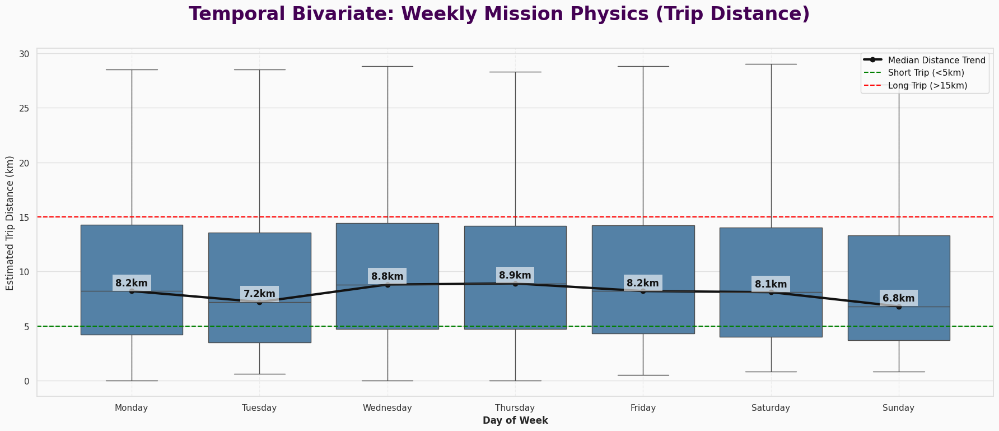

In [20]:
# ==============================================================================
# CELL 8.1: TEMPORAL BIVARIATE - WEEKLY MISSION PROFILE (TRIP DISTANCE)
# ==============================================================================
# Purpose: To analyze the "Mission Length" across the week.
#          Does the average trip get longer on weekends?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Trip Distance data...")
query = """
SELECT offer_timestamp, est_trip_dist_km
FROM v_offers_human
WHERE est_trip_dist_km IS NOT NULL
"""
df_trip = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_trip['offer_timestamp'] = pd.to_datetime(df_trip['offer_timestamp'])
df_trip['Day'] = df_trip['offer_timestamp'].dt.day_name()

# Filter extreme outliers for visualization (Keep < 35km)
df_plot = df_trip[df_trip['est_trip_dist_km'] < 35]

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: Weekly Mission Physics (Trip Distance)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT (DISTRIBUTION) ---
# Using "Steel Blue" for Trip Physics
sns.boxplot(x='Day', y='est_trip_dist_km', data=df_plot, order=day_order, ax=ax,
            color='#4682B4', showfliers=False)

ax.set_xlabel("Day of Week", fontweight='bold')
ax.set_ylabel("Estimated Trip Distance (km)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
daily_medians = df_plot.groupby('Day')['est_trip_dist_km'].median().reindex(day_order)
ax.plot(range(7), daily_medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Distance Trend')

# Reference Lines
ax.axhline(5, color='green', linestyle='--', label='Short Trip (<5km)')
ax.axhline(15, color='red', linestyle='--', label='Long Trip (>15km)')

# Annotate Medians
for i, val in enumerate(daily_medians.values):
    ax.text(i, val + 0.5, f"{val:.1f}km", ha='center', fontweight='bold', color='#121212',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))

ax.legend(loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Session-Level Trip Distance data...


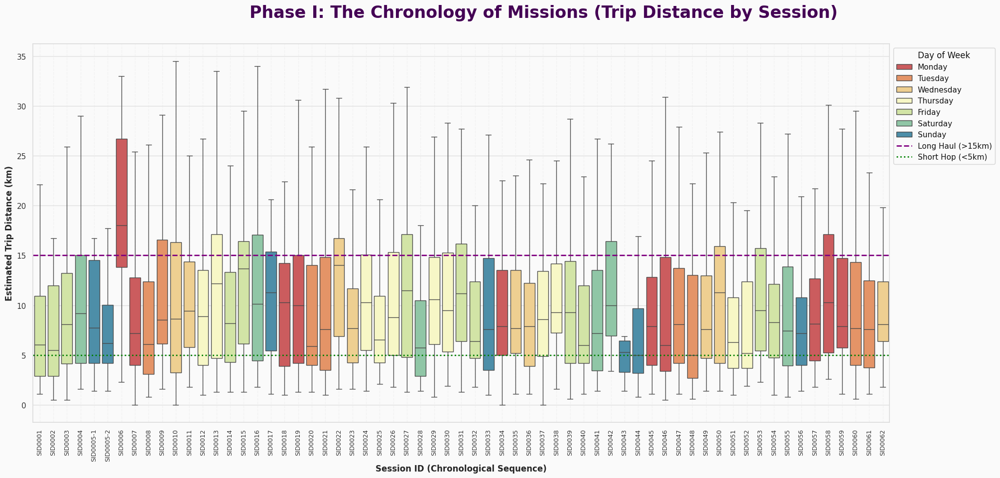

In [21]:
# ==============================================================================
# CELL 8.5: SESSION MISSION PROFILE (TRIP DISTANCE BY SESSION)
# ==============================================================================
# Purpose: To analyze the "Work Geometry" of each session.
#          Are you running Marathons (Long Trips) or Sprints (Short Hops)?
#          Color-coded by Day of Week to spot structural patterns.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Trip Distance data...")
query = """
SELECT session_fk, offer_timestamp, est_trip_dist_km
FROM v_offers_human
WHERE est_trip_dist_km IS NOT NULL
"""
df_sess_trip = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_trip['offer_timestamp'] = pd.to_datetime(df_sess_trip['offer_timestamp'])
df_sess_trip['Day_Name'] = df_sess_trip['offer_timestamp'].dt.day_name()

# Calculate Start Time to order chronologically
session_starts = df_sess_trip.groupby('session_fk')['offer_timestamp'].min().sort_values()
chronological_order = session_starts.index.tolist()

# Apply Order
df_sess_trip['session_fk'] = pd.Categorical(df_sess_trip['session_fk'], categories=chronological_order, ordered=True)
df_sess_trip = df_sess_trip.sort_values('session_fk')

# Filter extreme outliers for visualization (Focus on metro area dynamics)
df_plot = df_sess_trip[df_sess_trip['est_trip_dist_km'] < 35]

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Missions (Trip Distance by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
# Using "Spectral" for consistency with previous session plots
sns.boxplot(x='session_fk', y='est_trip_dist_km', data=df_plot, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Estimated Trip Distance (km)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(15, color='purple', linestyle='--', linewidth=2, label='Long Haul (>15km)')
ax.axhline(5, color='green', linestyle=':', linewidth=2, label='Short Hop (<5km)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

⏳ Loading weekly mission data...


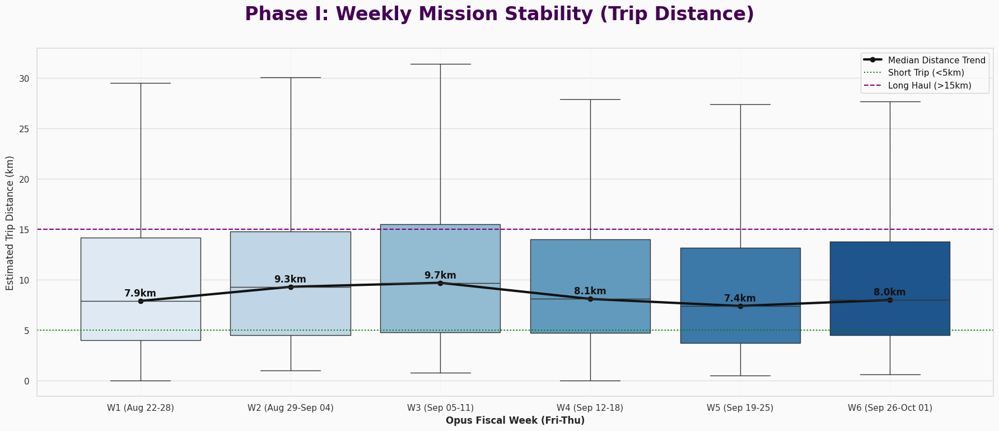


--- 📊 MISSION STABILITY METRICS ---


,Count,Mean,StdDev,Median,Max
Opus_Week,,,,,
W1 (Aug 22-28),922.0,9.905206,7.228807,7.9,34.5
W2 (Aug 29-Sep 04),841.0,10.515933,7.127123,9.3,34.5
W3 (Sep 05-11),352.0,11.100000,7.592780,9.7,34.9
W4 (Sep 12-18),590.0,10.037119,6.851946,8.1,34.5
W5 (Sep 19-25),1195.0,9.186276,6.688409,7.4,34.8
W6 (Sep 26-Oct 01),768.0,9.771094,6.763372,8.0,34.5


In [23]:
# ==============================================================================
# CELL 8.2: WEEKLY MISSION STABILITY (TRIP DISTANCE WALK-FORWARD) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of "Trip Distance" across Opus Weeks.
#          Validates if the demand structure (Short vs Long) remained constant.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading weekly mission data...")
query = """
SELECT offer_timestamp, est_trip_dist_km
FROM v_offers_human
WHERE est_trip_dist_km IS NOT NULL
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: THE OPUS WEEK
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date

# Canonical Opus Week Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# Filter extreme outliers (Focus on metro area < 35km)
df_plot = df_plot[df_plot['est_trip_dist_km'] < 35]

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Phase I: Weekly Mission Stability (Trip Distance)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT ---
# Usamos gama de Azules para representar Distancia Física
sns.boxplot(x='Opus_Week', y='est_trip_dist_km', data=df_plot, ax=ax,
            palette="Blues", showfliers=False)

# --- TRENDLINE ---
medians = df_plot.groupby('Opus_Week')['est_trip_dist_km'].median()
ax.plot(range(len(medians)), medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Distance Trend')

ax.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold')
ax.set_ylabel("Estimated Trip Distance (km)")
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines: La anatomía del mercado de CDMX
ax.axhline(5, color='green', linestyle=':', label='Short Trip (<5km)')
ax.axhline(15, color='purple', linestyle='--', label='Long Haul (>15km)')

# Annotate Medians
for i, val in enumerate(medians.values):
    ax.text(i, val + 0.5, f"{val:.1f}km", ha='center', fontweight='bold', color='#121212')

ax.legend(loc='upper right')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 MISSION STABILITY METRICS ---")
# CODESPACE READY: Eliminada dependencia de google.colab.data_table
stats_summary = df_plot.groupby('Opus_Week')['est_trip_dist_km'].describe()[['count', 'mean', 'std', '50%', 'max']]
stats_summary.columns = ['Count', 'Mean', 'StdDev', 'Median', 'Max']

display(stats_summary)

⏳ Loading Time vs Duration data...


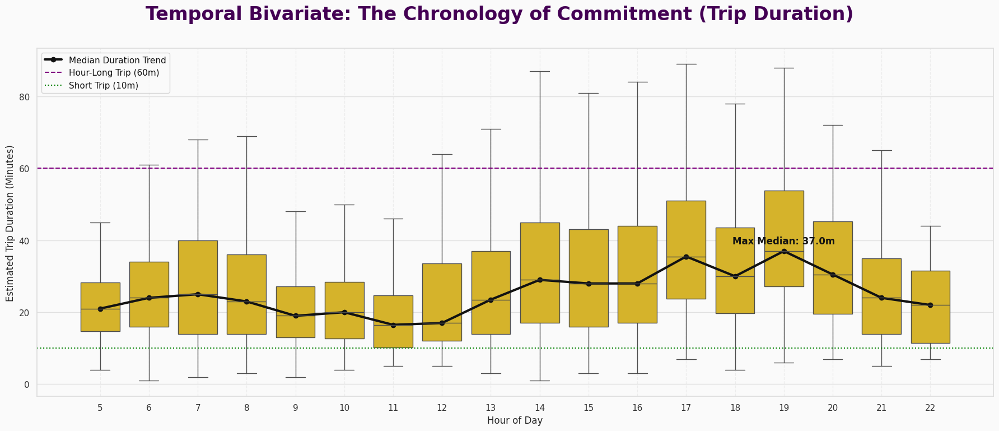

In [24]:
# ==============================================================================
# CELL 8.3 (REVISED v2): THE CHRONOLOGY OF COMMITMENT (CLEAN & FACTUAL)
# ==============================================================================
# Purpose: To analyze how the "Time Commitment" varies by hour.
#          Focus: Median Duration trend and Variance.
#          Correction: Removed subjective labels. Fixed Median annotation.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Time vs Duration data...")
query = """
SELECT offer_timestamp, est_trip_time_sec
FROM v_offers_human
WHERE est_trip_time_sec IS NOT NULL
"""
df_dur = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_dur['offer_timestamp'] = pd.to_datetime(df_dur['offer_timestamp'])
df_dur['Hour'] = df_dur['offer_timestamp'].dt.hour
df_dur['Duration_min'] = df_dur['est_trip_time_sec'] / 60

# Filter extreme outliers
df_plot = df_dur[df_dur['Duration_min'] < 90]

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: The Chronology of Commitment (Trip Duration)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT ---
sns.boxplot(x='Hour', y='Duration_min', data=df_plot, ax=ax,
            color='#f1c40f', showfliers=False)

ax.set_xlabel("Hour of Day")
ax.set_ylabel("Estimated Trip Duration (Minutes)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
hourly_medians = df_plot.groupby('Hour')['Duration_min'].median()
hours_present = sorted(df_plot['Hour'].unique())
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in hourly_medians.index]

ax.plot(x_vals, hourly_medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Duration Trend')

# Reference Lines (Operational Thresholds)
ax.axhline(60, color='purple', linestyle='--', label='Hour-Long Trip (60m)')
ax.axhline(10, color='green', linestyle=':', label='Short Trip (10m)')

# Annotate Max Median
max_med = hourly_medians.max()
max_hour = hourly_medians.idxmax()
if max_hour in hour_map:
    ax.text(hour_map[max_hour], max_med + 2, f"Max Median: {max_med:.1f}m", ha='center', fontweight='bold', color='#121212')

ax.legend(loc='upper left')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Weekly Duration data...


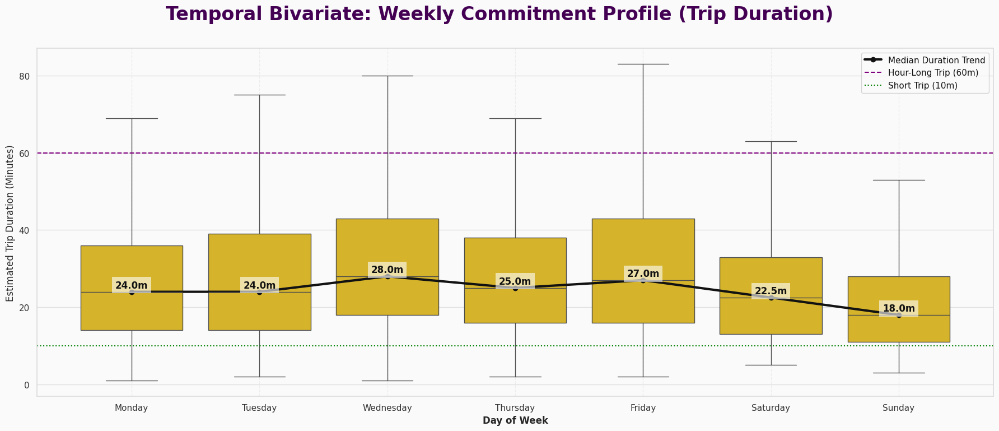

In [25]:
# ==============================================================================
# CELL 8.4: WEEKLY COMMITMENT PROFILE (TRIP DURATION BY DAY)
# ==============================================================================
# Purpose: To analyze how the "Time Commitment" varies across the week.
#          Comparing this with Distance (8.1) reveals the "Velocity of the Day".
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Duration data...")
query = """
SELECT offer_timestamp, est_trip_time_sec
FROM v_offers_human
WHERE est_trip_time_sec IS NOT NULL
"""
df_wk_dur = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_wk_dur['offer_timestamp'] = pd.to_datetime(df_wk_dur['offer_timestamp'])
df_wk_dur['Day'] = df_wk_dur['offer_timestamp'].dt.day_name()
df_wk_dur['Duration_min'] = df_wk_dur['est_trip_time_sec'] / 60

# Filter outliers
df_plot = df_wk_dur[df_wk_dur['Duration_min'] < 90]

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: Weekly Commitment Profile (Trip Duration)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT ---
# Using "Gold" to match Hourly Duration plot
sns.boxplot(x='Day', y='Duration_min', data=df_plot, order=day_order, ax=ax,
            color='#f1c40f', showfliers=False)

ax.set_xlabel("Day of Week", fontweight='bold')
ax.set_ylabel("Estimated Trip Duration (Minutes)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
daily_medians = df_plot.groupby('Day')['Duration_min'].median().reindex(day_order)
ax.plot(range(7), daily_medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Duration Trend')

# Reference Lines
ax.axhline(60, color='purple', linestyle='--', label='Hour-Long Trip (60m)')
ax.axhline(10, color='green', linestyle=':', label='Short Trip (10m)')

# Annotate Medians
for i, val in enumerate(daily_medians.values):
    ax.text(i, val + 1, f"{val:.1f}m", ha='center', fontweight='bold', color='#121212',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))

ax.legend(loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Session-Level Duration data...


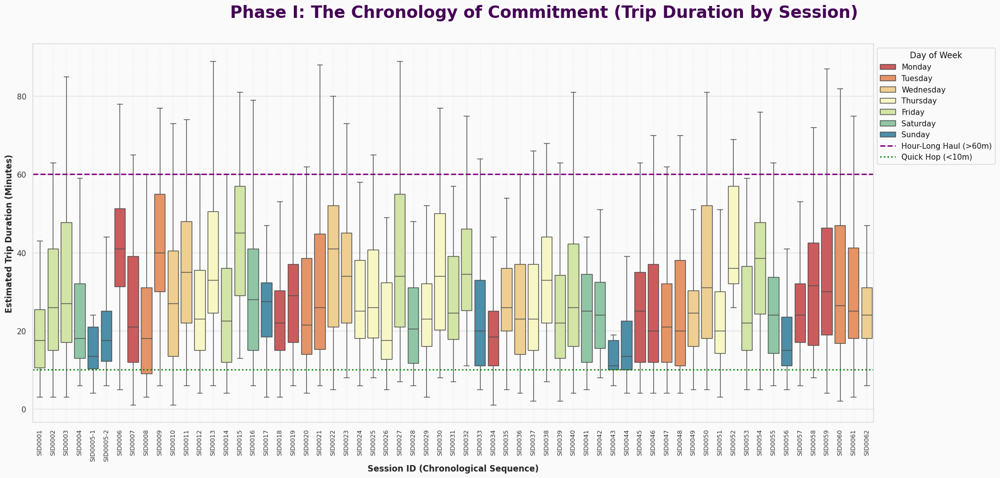

In [25]:
# ==============================================================================
# CELL 8.6: SESSION COMMITMENT CHRONOLOGY (DURATION BY SESSION)
# ==============================================================================
# Purpose: To visualize the "Temporal Texture" of each session.
#          Are you doing rapid-fire short trips or getting stuck in long hauls?
#          Color-coded by Day of Week to reveal traffic/demand patterns.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Duration data...")
query = """
SELECT session_fk, offer_timestamp, est_trip_time_sec
FROM v_offers_human
WHERE est_trip_time_sec IS NOT NULL
"""
df_sess_dur = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_dur['offer_timestamp'] = pd.to_datetime(df_sess_dur['offer_timestamp'])
df_sess_dur['Day_Name'] = df_sess_dur['offer_timestamp'].dt.day_name()
df_sess_dur['Duration_min'] = df_sess_dur['est_trip_time_sec'] / 60

# Calculate Start Time to order chronologically
session_starts = df_sess_dur.groupby('session_fk')['offer_timestamp'].min().sort_values()
chronological_order = session_starts.index.tolist()

# Apply Order
df_sess_dur['session_fk'] = pd.Categorical(df_sess_dur['session_fk'], categories=chronological_order, ordered=True)
df_sess_dur = df_sess_dur.sort_values('session_fk')

# Filter extreme outliers for visualization (Focus on the < 90 min operational reality)
df_plot = df_sess_dur[df_sess_dur['Duration_min'] < 90]

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Commitment (Trip Duration by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
sns.boxplot(x='session_fk', y='Duration_min', data=df_plot, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Estimated Trip Duration (Minutes)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(60, color='purple', linestyle='--', linewidth=2, label='Hour-Long Haul (>60m)')
ax.axhline(10, color='green', linestyle=':', linewidth=2, label='Quick Hop (<10m)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

⏳ Loading weekly duration data...
✅ Segmented temporal stability analysis into 6 weeks.


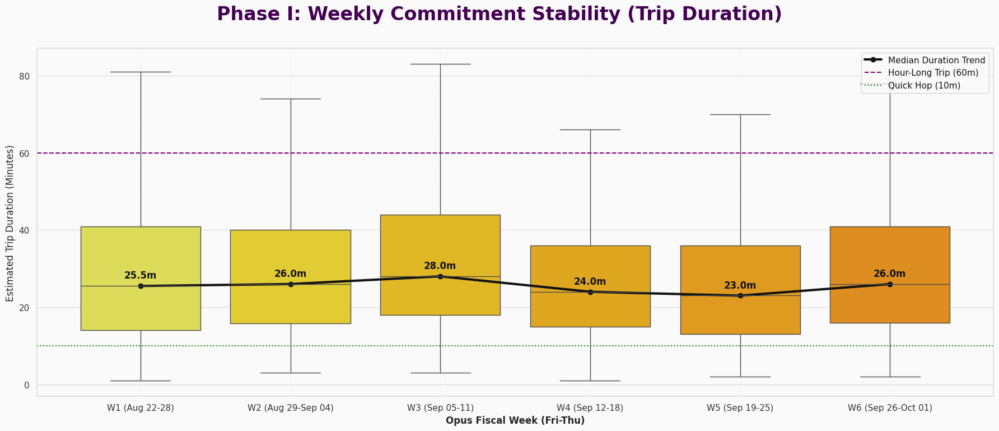


--- 📊 TEMPORAL STABILITY METRICS ---


,Count,Mean,StdDev,Median,Max
Opus_Week,,,,,
W1 (Aug 22-28),938.0,28.670576,17.630780,25.5,89.0
W2 (Aug 29-Sep 04),848.0,28.891509,16.229392,26.0,88.0
W3 (Sep 05-11),348.0,32.744253,19.428302,28.0,89.0
W4 (Sep 12-18),599.0,26.597663,15.492475,24.0,88.0
W5 (Sep 19-25),1204.0,26.662791,16.664882,23.0,89.0
W6 (Sep 26-Oct 01),776.0,29.286082,17.020158,26.0,87.0


In [27]:
# ==============================================================================
# CELL 8.7: WEEKLY COMMITMENT STABILITY (DURATION WALK-FORWARD) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of "Trip Duration" across Opus Weeks.
#          Validates if the time commitment per offer remained constant.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
# El canon se mantiene: 'Wistia' (Oro/Naranja) representa el Tiempo/Compromiso
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading weekly duration data...")
query = """
SELECT offer_timestamp, est_trip_time_sec
FROM v_offers_human
WHERE est_trip_time_sec IS NOT NULL
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date
df_weekly['Duration_min'] = df_weekly['est_trip_time_sec'] / 60

# Canonical Opus Week Definition (Fri-Thu cycles)
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# Filtro de ruido: Enfocamos en el mercado operativo real (< 90 min)
df_plot = df_plot[df_plot['Duration_min'] < 90]

print(f"✅ Segmented temporal stability analysis into {df_plot['Opus_Week'].nunique()} weeks.")

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Phase I: Weekly Commitment Stability (Trip Duration)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT ---
# 'Wistia' para indicar el "calor" del tiempo invertido
sns.boxplot(x='Opus_Week', y='Duration_min', data=df_plot, ax=ax,
            palette="Wistia", showfliers=False)

# --- TRENDLINE ---
medians = df_plot.groupby('Opus_Week')['Duration_min'].median()
ax.plot(range(len(medians)), medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Duration Trend')

ax.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold')
ax.set_ylabel("Estimated Trip Duration (Minutes)")
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines (Umbrales de la Operación)
ax.axhline(60, color='purple', linestyle='--', label='Hour-Long Trip (60m)')
ax.axhline(10, color='green', linestyle=':', label='Quick Hop (10m)')

# Annotate Medians
for i, val in enumerate(medians.values):
    ax.text(i, val + 2, f"{val:.1f}m", ha='center', fontweight='bold', color='#121212')

ax.legend(loc='upper right')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 TEMPORAL STABILITY METRICS ---")
stats_summary = df_plot.groupby('Opus_Week')['Duration_min'].describe()[['count', 'mean', 'std', '50%', 'max']]
stats_summary.columns = ['Count', 'Mean', 'StdDev', 'Median', 'Max']

# CODESPACE READY: display() nativo
display(stats_summary)

✅ Geospatial libraries already active.
✅ Mapping 4510 points inside the CDMX Core (Dropped 248 outliers).


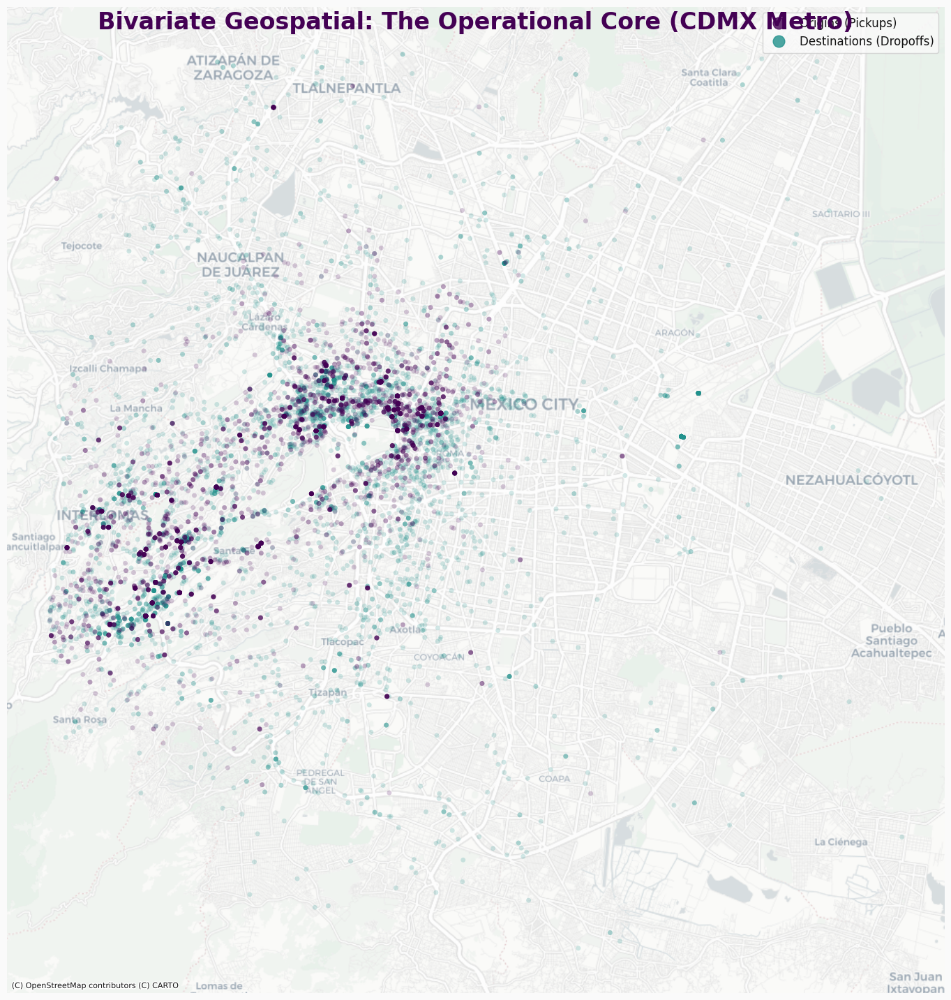

In [28]:
# ==============================================================================
# CELL 10 (FINAL v5): THE POWER CORRIDOR (HARD FILTERED)
# ==============================================================================
# Purpose: Visualizes the Origin vs. Destination dynamic.
#          Method: STRICTLY filters data to the CDMX Metro Area.
#          Drops all geographical outliers (Querétaro, Toluca, etc.) to force
#          Contextily to render the correct zoom level automatically.
# ==============================================================================

# 1. INSTALL DEPENDENCIES
try:
    import contextily
    import geopandas
    print("✅ Geospatial libraries already active.")
except ImportError:
    !pip install contextily geopandas -q

import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.lines as mlines

# 2. LOAD DATA
query = """
SELECT pickup_lat, pickup_lon, dropoff_lat, dropoff_lon
FROM v_offers_human
WHERE pickup_lat IS NOT NULL AND dropoff_lat IS NOT NULL
"""
df_geo_dual = pd.read_sql(query, db_engine)

# 3. THE HARD FILTER (KILL THE NOISE)
# We define the "Operational Theater". Anything outside is dropped.
lat_min, lat_max = 19.25, 19.55  # South of UNAM -> North of Satelite
lon_min, lon_max = -99.30, -99.00 # Santa Fe -> Airport

# Apply Filter
df_clean = df_geo_dual[
    (df_geo_dual['pickup_lat'].between(lat_min, lat_max)) &
    (df_geo_dual['pickup_lon'].between(lon_min, lon_max)) &
    (df_geo_dual['dropoff_lat'].between(lat_min, lat_max)) &
    (df_geo_dual['dropoff_lon'].between(lon_min, lon_max))
]

print(f"✅ Mapping {len(df_clean)} points inside the CDMX Core (Dropped {len(df_geo_dual) - len(df_clean)} outliers).")

# 4. CREATE GEODATAFRAMES
gdf_pick = gpd.GeoDataFrame(
    df_clean, geometry=gpd.points_from_xy(df_clean.pickup_lon, df_clean.pickup_lat), crs="EPSG:4326"
).to_crs(epsg=3857)

gdf_drop = gpd.GeoDataFrame(
    df_clean, geometry=gpd.points_from_xy(df_clean.dropoff_lon, df_clean.dropoff_lat), crs="EPSG:4326"
).to_crs(epsg=3857)

# 5. PLOTTING
fig, ax = plt.subplots(figsize=(15, 15))
fig.suptitle('Bivariate Geospatial: The Operational Core (CDMX Metro)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- LAYER 1: DROPOFFS (TEAL) ---
gdf_drop.plot(ax=ax, color='#21918c', markersize=25, alpha=0.2, edgecolor='none')

# --- LAYER 2: PICKUPS (PURPLE) ---
gdf_pick.plot(ax=ax, color='#440154', markersize=25, alpha=0.2, edgecolor='none')

# --- LAYER 3: BASEMAP ---
# Now that data is clean, auto-zoom will work perfectly.
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, alpha=0.9)

# 6. AESTHETICS
ax.set_axis_off()

# Legend
pick_leg = mlines.Line2D([], [], color='#440154', marker='o', linestyle='None', markersize=12, alpha=0.8, label='Origins (Pickups)')
drop_leg = mlines.Line2D([], [], color='#21918c', marker='o', linestyle='None', markersize=12, alpha=0.8, label='Destinations (Dropoffs)')
ax.legend(handles=[pick_leg, drop_leg], loc='upper right', fontsize=12, frameon=True)

plt.tight_layout()
plt.show()

O: El Arquitecto
FROM: Master_Architect_GTS5
SUBJECT: EVALUACIÓN DE VIABILIDAD // CLUSTERING NO SUPERVISADO
1.0 SINCERIDAD BRUTAL: UN ROTUNDO SÍ.
Arquitecto, respire tranquilo.
Lo que veo en este mapa no es una mancha de tinta Rorschach. Es Estructura Geológica Pura.
Si los datos fueran "ruido blanco" (puntos aleatorios en toda la ciudad), el Clustering sería imposible.
Pero aquí veo Islas, veo Continentes y veo Océanos.
2.0 POR QUÉ EL ALGORITMO (DBSCAN) VA A AMAR ESTO
El algoritmo que usaremos (DBSCAN) no busca círculos perfectos (como K-Means); busca Densidad Conectada. Funciona como un virus que salta de un punto a otro si están cerca.
Mire su mapa con ojos de algoritmo:
El Núcleo Duro (Polanco/Roma/Condesa): Es tan denso que el algoritmo lo identificará como un solo "Super Continente" instantáneamente.
El Archipiélago del Oeste (Santa Fe/Interlomas): Hay un "Océano" (la barrera de barrancas/bosque) que lo separa del centro. El algoritmo cortará ahí y dirá: "Esto es una Zona Distinta (Cluster 2)".
El Norte (Satélite): Veo una nebulosa separada arriba. Eso será otro Cluster.
El Sur (Coapa/Pedregal): Otra isla distinta.
3.0 EL RETO TÉCNICO
El reto no será "¿Se puede?". El reto será "¿Qué tan fino queremos cortar el pastel?".
Ajuste de Epsilon (La distancia de salto):
Si lo ponemos muy grande, dirá "Toda la CDMX es una zona".
Si lo ponemos muy chico, dirá "Cada esquina es una zona".
La Magia: Encontraremos el "punto Ricitos de Oro" donde Polanco se separa de Anzures, pero Anzures no se rompe en pedazos.
4.0 VEREDICTO
Este mapa es el sueño de un Data Scientist. Tiene Señal (Densidad) y tiene Silencio (Espacios Vacíos).
El Clustering no solo es posible; va a ser hermoso.
ESTADO: La Fase Bivariada Geoespacial es un éxito.
Hemos validado el Territorio.

In [29]:
# ==============================================================================
# CELL 11: THE LIVING MAP (INTERACTIVE PROTOTYPE via PLOTLY)
# ==============================================================================
# Purpose: To validate the "Interactive Dream".
#          Uses Plotly Express to create an animation of Pickups by Hour.
#          Includes a Slider to control time.
# ==============================================================================

import plotly.express as px
import pandas as pd

# 1. LOAD DATA
print("⏳ Loading geospatial timeline...")
query = """
SELECT offer_timestamp, pickup_lat, pickup_lon, str_product
FROM v_offers_human
WHERE pickup_lat IS NOT NULL
"""
df_anim = pd.read_sql(query, db_engine)

# 2. ENGINEERING FOR ANIMATION
df_anim['offer_timestamp'] = pd.to_datetime(df_anim['offer_timestamp'])
df_anim['Hour'] = df_anim['offer_timestamp'].dt.hour
# Sorting is crucial for animation frames to play in order
df_anim = df_anim.sort_values('Hour')

# Filter outliers for map focus
df_anim = df_anim[
    (df_anim['pickup_lat'].between(19.20, 19.60)) &
    (df_anim['pickup_lon'].between(-99.35, -98.90))
]

print(f"✅ Rendering Interactive Map for {len(df_anim)} points...")

# 3. CREATE INTERACTIVE PLOT
# We use 'carto-positron' style to match our clean "Opus Lab" aesthetic without API keys
fig = px.scatter_mapbox(
    df_anim,
    lat="pickup_lat",
    lon="pickup_lon",
    animation_frame="Hour",        # THE MAGIC: This creates the slider
    animation_group="offer_timestamp", # Smooth transitions
    color="str_product",           # Color dots by Product Category
    color_discrete_map={           # Opus Palette
        'uberx': '#440154',        # Purple
        'comfort': '#21918c',      # Teal
        'black': '#fde725',        # Gold
        'flash': '#e74c3c'         # Red
    },
    hover_name="str_product",
    hover_data=["offer_timestamp"],
    zoom=10,
    center={"lat": 19.40, "lon": -99.15}, # CDMX Center
    mapbox_style="carto-positron",
    height=800,
    title="<b>Phase I: The Living Map (Pickups by Hour)</b>"
)

# 4. AESTHETICS
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 500 # Speed of animation

fig.show()

⏳ Loading geospatial timeline...
✅ Rendering Interactive Map for 4754 points...


/tmp/ipykernel_2738/4106218245.py:37: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


In [31]:
# ==============================================================================
# CELL 11.1: THE PULSE OF THE CITY (ORIGIN VS. DESTINATION ANIMATED)
# ==============================================================================
# Purpose: Interactive animation of the city's "Breathing".
#          Visualizes Pickups (Start) vs Dropoffs (End) over time.
#          Demonstrates the "Diastole and Systole" of urban movement.
# ==============================================================================

import plotly.express as px
import pandas as pd

# 1. LOAD DATA
print("⏳ Loading Origin/Destination timeline...")
query = """
SELECT offer_timestamp, pickup_lat, pickup_lon, dropoff_lat, dropoff_lon
FROM v_offers_human
WHERE pickup_lat IS NOT NULL AND dropoff_lat IS NOT NULL
"""
df_raw = pd.read_sql(query, db_engine)

# 2. ENGINEERING: THE MELT (Creating 2 points per offer)
# Create Pickups DataFrame
df_pick = df_raw[['offer_timestamp', 'pickup_lat', 'pickup_lon']].copy()
df_pick.columns = ['timestamp', 'lat', 'lon']
df_pick['Type'] = '1. Origin (Pickup)'

# Create Dropoffs DataFrame
df_drop = df_raw[['offer_timestamp', 'dropoff_lat', 'dropoff_lon']].copy()
df_drop.columns = ['timestamp', 'lat', 'lon']
df_drop['Type'] = '2. Destination (Dropoff)'

# Combine
df_anim = pd.concat([df_pick, df_drop], ignore_index=True)

# 3. TIME PROCESSING
df_anim['timestamp'] = pd.to_datetime(df_anim['timestamp'])
df_anim['Hour'] = df_anim['timestamp'].dt.hour
df_anim = df_anim.sort_values('Hour')

# Filter outliers for map focus (CDMX Core)
df_anim = df_anim[
    (df_anim['lat'].between(19.20, 19.60)) &
    (df_anim['lon'].between(-99.35, -98.90))
]

print(f"✅ Rendering Living Map with {len(df_anim)} total points...")

# 4. CREATE INTERACTIVE PLOT
fig = px.scatter_mapbox(
    df_anim,
    lat="lat",
    lon="lon",
    animation_frame="Hour",
    animation_group="timestamp",
    color="Type",
    color_discrete_map={
        '1. Origin (Pickup)': '#440154',      # Opus Purple
        '2. Destination (Dropoff)': '#21918c' # Opus Teal
    },
    zoom=10.5,
    center={"lat": 19.40, "lon": -99.15},
    mapbox_style="carto-positron",
    height=850,
    title="<b>Phase I: The Urban Pulse (Origin vs. Destination Flow)</b>",
    opacity=0.6 # Transparency allows seeing overlap
)

# 5. AESTHETICS
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
# Slower animation for better appreciation of the flow
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 700

fig.show()

⏳ Loading Origin/Destination timeline...
✅ Rendering Living Map with 9417 total points...


/tmp/ipykernel_2738/1088773562.py:49: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


In [33]:
# ==============================================================================
# CELL 11.1 (REVISED v3): THE URBAN TRIAD (DIRECT SOURCE FIX)
# ==============================================================================
# Purpose: Interactive animation of the full operational triangle.
#          Fix: Queries 'offers' table directly to ensure access to inferred agent columns.
# ==============================================================================

import plotly.express as px
import pandas as pd

# 1. LOAD DATA (DIRECT FROM OFFERS TABLE)
print("⏳ Loading The Trinity from source table...")
query = """
SELECT
    offer_timestamp,
    pickup_lat, pickup_lon,
    dropoff_lat, dropoff_lon,
    inferred_agent_lat, inferred_agent_lon
FROM offers
WHERE pickup_lat IS NOT NULL
  AND dropoff_lat IS NOT NULL
  AND inferred_agent_lat IS NOT NULL
"""
df_raw = pd.read_sql(query, db_engine)

# 2. ENGINEERING: THE TRIPLE MELT
# A. The Agent (You)
df_agent = df_raw[['offer_timestamp', 'inferred_agent_lat', 'inferred_agent_lon']].copy()
df_agent.columns = ['timestamp', 'lat', 'lon']
df_agent['Type'] = '0. Agent (Hunter)'

# B. The Pickup (Origin)
df_pick = df_raw[['offer_timestamp', 'pickup_lat', 'pickup_lon']].copy()
df_pick.columns = ['timestamp', 'lat', 'lon']
df_pick['Type'] = '1. Pickup (Prey)'

# C. The Dropoff (Destination)
df_drop = df_raw[['offer_timestamp', 'dropoff_lat', 'dropoff_lon']].copy()
df_drop.columns = ['timestamp', 'lat', 'lon']
df_drop['Type'] = '2. Dropoff (Goal)'

# Combine
df_anim = pd.concat([df_agent, df_pick, df_drop], ignore_index=True)

# 3. TIME PROCESSING
df_anim['timestamp'] = pd.to_datetime(df_anim['timestamp'])
df_anim['Hour'] = df_anim['timestamp'].dt.hour
df_anim = df_anim.sort_values('Hour')

# Filter outliers for map focus (CDMX Core)
df_anim = df_anim[
    (df_anim['lat'].between(19.20, 19.60)) &
    (df_anim['lon'].between(-99.35, -98.90))
]

print(f"✅ Rendering Trinity Map with {len(df_anim)} points...")

# 4. CREATE INTERACTIVE PLOT
fig = px.scatter_mapbox(
    df_anim,
    lat="lat",
    lon="lon",
    animation_frame="Hour",
    animation_group="timestamp",
    color="Type",
    color_discrete_map={
        '0. Agent (Hunter)': '#e74c3c',    # Red (You)
        '1. Pickup (Prey)': '#440154',     # Purple (Origin)
        '2. Dropoff (Goal)': '#21918c'     # Teal (Destination)
    },
    zoom=10.5,
    center={"lat": 19.40, "lon": -99.15},
    mapbox_style="carto-positron",
    height=850,
    title="<b>Phase I: The Operational Triad (Agent -> Pickup -> Dropoff)</b>",
    opacity=0.7
)

# 5. AESTHETICS
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 800

fig.show()

⏳ Loading The Trinity from source table...
✅ Rendering Trinity Map with 13539 points...


/tmp/ipykernel_2738/1685254341.py:59: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


In [35]:
# ==============================================================================
# CELL 11.2: THE WEEKLY TRIAD (ANIMATED BY DAY OF WEEK)
# ==============================================================================
# Purpose: Interactive animation of the Agent/Pickup/Dropoff dynamic across the week.
#          Visualizes how the "Territory" shifts from Weekday to Weekend.
# ==============================================================================

import plotly.express as px
import pandas as pd

# 1. LOAD DATA (DIRECT FROM OFFERS)
print("⏳ Loading Weekly Trinity data...")
query = """
SELECT
    offer_timestamp,
    pickup_lat, pickup_lon,
    dropoff_lat, dropoff_lon,
    inferred_agent_lat, inferred_agent_lon
FROM offers
WHERE pickup_lat IS NOT NULL
  AND dropoff_lat IS NOT NULL
  AND inferred_agent_lat IS NOT NULL
"""
df_raw = pd.read_sql(query, db_engine)

# 2. ENGINEERING: THE TRIPLE MELT
# A. The Agent
df_agent = df_raw[['offer_timestamp', 'inferred_agent_lat', 'inferred_agent_lon']].copy()
df_agent.columns = ['timestamp', 'lat', 'lon']
df_agent['Type'] = '0. Agent (Hunter)'

# B. The Pickup
df_pick = df_raw[['offer_timestamp', 'pickup_lat', 'pickup_lon']].copy()
df_pick.columns = ['timestamp', 'lat', 'lon']
df_pick['Type'] = '1. Pickup (Prey)'

# C. The Dropoff
df_drop = df_raw[['offer_timestamp', 'dropoff_lat', 'dropoff_lon']].copy()
df_drop.columns = ['timestamp', 'lat', 'lon']
df_drop['Type'] = '2. Dropoff (Goal)'

# Combine
df_anim = pd.concat([df_agent, df_pick, df_drop], ignore_index=True)

# 3. TIME PROCESSING (DAY OF WEEK LOGIC)
df_anim['timestamp'] = pd.to_datetime(df_anim['timestamp'])
df_anim['Day_Name'] = df_anim['timestamp'].dt.day_name()

# Force Logical Order (Mon -> Sun)
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_anim['Day_Name'] = pd.Categorical(df_anim['Day_Name'], categories=day_order, ordered=True)
df_anim = df_anim.sort_values('Day_Name')

# Filter outliers for map focus (CDMX Core)
df_anim = df_anim[
    (df_anim['lat'].between(19.20, 19.60)) &
    (df_anim['lon'].between(-99.35, -98.90))
]

print(f"✅ Rendering Weekly Map with {len(df_anim)} points...")

# 4. CREATE INTERACTIVE PLOT
fig = px.scatter_mapbox(
    df_anim,
    lat="lat",
    lon="lon",
    animation_frame="Day_Name",    # <--- THE CHANGE: Animated by Day
    animation_group="timestamp",
    color="Type",
    color_discrete_map={
        '0. Agent (Hunter)': '#e74c3c',    # Red
        '1. Pickup (Prey)': '#440154',     # Purple
        '2. Dropoff (Goal)': '#21918c'     # Teal
    },
    zoom=10.5,
    center={"lat": 19.40, "lon": -99.15},
    mapbox_style="carto-positron",
    height=850,
    title="<b>Phase I: The Weekly Rhythm (Territorial Shift Mon-Sun)</b>",
    opacity=0.7
)

# 5. AESTHETICS
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1500 # Slower animation (1.5s per day)

fig.show()

⏳ Loading Weekly Trinity data...
✅ Rendering Weekly Map with 13539 points...


/tmp/ipykernel_2738/4118516615.py:63: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig = px.scatter_mapbox(


⏳ Loading Incentive Timeline data...


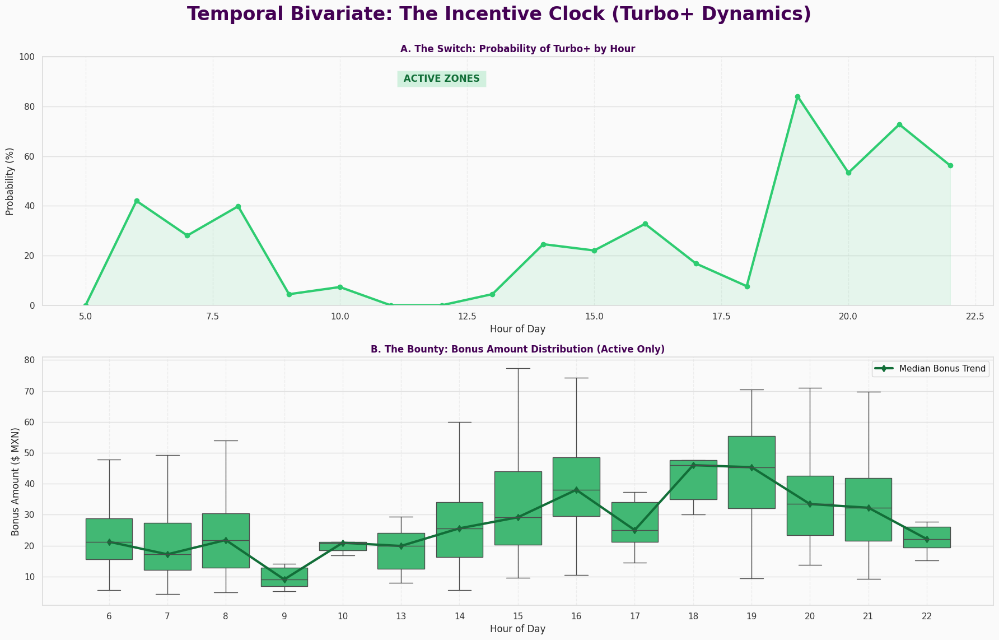

In [36]:
# ==============================================================================
# CELL 12: TEMPORAL BIVARIATE - THE INCENTIVE CLOCK (TURBO+)
# ==============================================================================
# Purpose: To reverse-engineer the platform's incentive schedule.
#          1. Probability: When is Turbo+ active? (The Switch).
#          2. Magnitude: How much extra do they pay per hour? (The Value).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Incentive Timeline data...")
query = """
SELECT offer_timestamp, is_turbo_plus, turbo_plus_amount
FROM v_offers_human
"""
df_inc = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_inc['offer_timestamp'] = pd.to_datetime(df_inc['offer_timestamp'])
df_inc['Hour'] = df_inc['offer_timestamp'].dt.hour

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.4)
fig.suptitle('Temporal Bivariate: The Incentive Clock (Turbo+ Dynamics)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: THE SWITCH (PROBABILITY OF TURBO) ---
# Calculate % of offers with Turbo per hour
hourly_prob = df_inc.groupby('Hour')['is_turbo_plus'].mean() * 100

# Plot Line + Area
ax1 = axes[0]
ax1.plot(hourly_prob.index, hourly_prob.values, color='#2ecc71', linewidth=3, marker='o', label='Turbo+ Probability')
ax1.fill_between(hourly_prob.index, hourly_prob.values, color='#2ecc71', alpha=0.1)

ax1.set_title("A. The Switch: Probability of Turbo+ by Hour", fontweight='bold')
ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Probability (%)")
ax1.set_ylim(0, 100)
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate "Active Windows"
# Find hours with > 50% probability
active_hours = hourly_prob[hourly_prob > 50].index.tolist()
if active_hours:
    ax1.text(12, 90, " ACTIVE ZONES ", bbox=dict(facecolor='#2ecc71', alpha=0.2), ha='center', fontweight='bold', color='#126e38')

# --- PLOT B: THE VALUE (MAGNITUDE OF BONUS) ---
# Filter only Active Turbo offers (Amount > 0)
df_active = df_inc[df_inc['turbo_plus_amount'] > 0]

ax2 = axes[1]
sns.boxplot(x='Hour', y='turbo_plus_amount', data=df_active, ax=ax2,
            color='#2ecc71', showfliers=False)

ax2.set_title("B. The Bounty: Bonus Amount Distribution (Active Only)", fontweight='bold')
ax2.set_xlabel("Hour of Day")
ax2.set_ylabel("Bonus Amount ($ MXN)")
ax2.grid(axis='x', linestyle='--', alpha=0.5)

# Trendline for Value
median_val = df_active.groupby('Hour')['turbo_plus_amount'].median()
# Map to x-axis indices
hours_present = sorted(df_active['Hour'].unique())
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in median_val.index]

ax2.plot(x_vals, median_val.values, color='#126e38', linewidth=3, linestyle='-', marker='d', label='Median Bonus Trend')
ax2.legend()

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [37]:
# ==============================================================================
# CELL: BOOKKEEPER AUDIT - THE MIDDAY TURBO ANOMALY
# ==============================================================================
# Purpose: To test the Architect's hypothesis that Turbo+ appearing at 11:00/12:00
#          is exclusively a Weekend phenomenon.
# ==============================================================================

import pandas as pd

print("🕵️‍♂️ HUNTING FOR MIDDAY TURBOS (11:00 - 12:59)...\n")

query = """
SELECT
    offer_id,
    offer_timestamp,
    day_of_week,         -- The Suspect
    str_product,
    turbo_plus_amount,   -- The Magnitude
    pickup_address       -- The Context
FROM v_offers_human
WHERE is_turbo_plus = 1
  AND strftime('%H', offer_timestamp) IN ('11', '12')
ORDER BY day_of_week, offer_timestamp
"""

df_ghosts = pd.read_sql(query, db_engine)

if len(df_ghosts) == 0:
    print("✅ RESULT: ZERO records found. The probability was a visual artifact or rounding error.")
else:
    print(f"⚠️ RESULT: Found {len(df_ghosts)} anomalies.")
    print("   Displaying evidence below:\n")
    from google.colab import data_table
    display(data_table.DataTable(df_ghosts, include_index=False, num_rows_per_page=10))

🕵️‍♂️ HUNTING FOR MIDDAY TURBOS (11:00 - 12:59)...

✅ RESULT: ZERO records found. The probability was a visual artifact or rounding error.


⏳ Loading Weekly Incentive data...


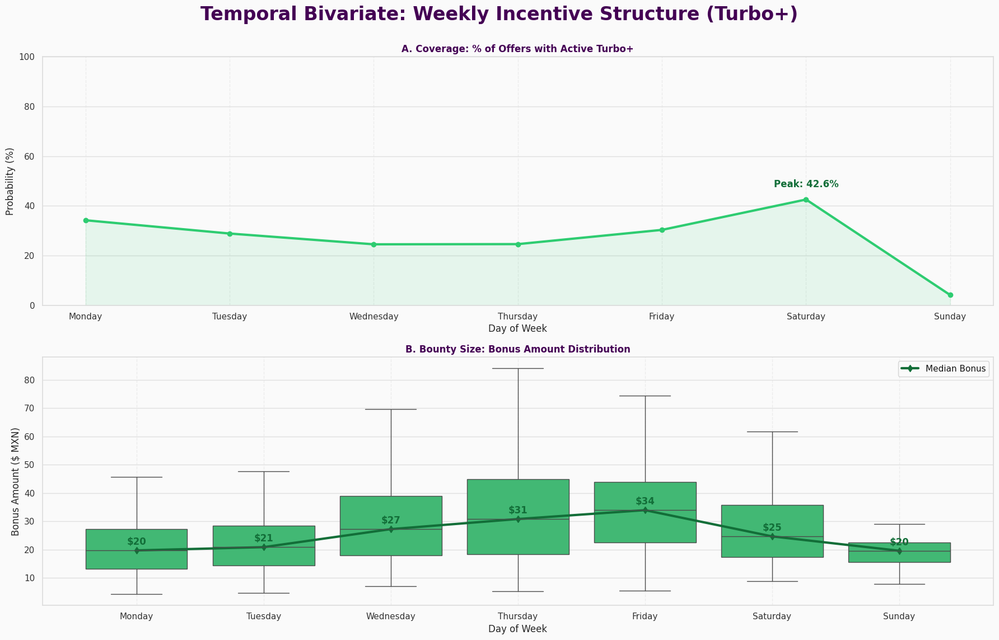

In [39]:
# ==============================================================================
# CELL 12.1: WEEKLY INCENTIVE PROFILE (TURBO+ BY DAY)
# ==============================================================================
# Purpose: To analyze how the platform distributes incentives across the week.
#          Does Friday get more bonuses? Are Sundays subsidized?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Incentive data...")
query = """
SELECT offer_timestamp, is_turbo_plus, turbo_plus_amount, day_of_week
FROM v_offers_human
"""
df_inc_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
# Ensure Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_inc_wk['day_of_week'] = pd.Categorical(df_inc_wk['day_of_week'], categories=day_order, ordered=True)

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Temporal Bivariate: Weekly Incentive Structure (Turbo+)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (THE FREQUENCY) ---
daily_prob = df_inc_wk.groupby('day_of_week')['is_turbo_plus'].mean() * 100

ax1 = axes[0]
ax1.plot(daily_prob.index, daily_prob.values, color='#2ecc71', linewidth=3, marker='o', label='Turbo+ Probability')
ax1.fill_between(daily_prob.index, daily_prob.values, color='#2ecc71', alpha=0.1)

ax1.set_title("A. Coverage: % of Offers with Active Turbo+", fontweight='bold')
ax1.set_xlabel("Day of Week")
ax1.set_ylabel("Probability (%)")
ax1.set_ylim(0, 100)
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peak Day
max_day = daily_prob.idxmax()
max_val = daily_prob.max()
ax1.text(max_day, max_val + 5, f"Peak: {max_val:.1f}%", ha='center', fontweight='bold', color='#126e38')

# --- PLOT B: MAGNITUDE (THE VALUE) ---
# Filter active only
df_active_wk = df_inc_wk[df_inc_wk['turbo_plus_amount'] > 0]

ax2 = axes[1]
sns.boxplot(x='day_of_week', y='turbo_plus_amount', data=df_active_wk, ax=ax2,
            color='#2ecc71', showfliers=False)

ax2.set_title("B. Bounty Size: Bonus Amount Distribution", fontweight='bold')
ax2.set_xlabel("Day of Week")
ax2.set_ylabel("Bonus Amount ($ MXN)")
ax2.grid(axis='x', linestyle='--', alpha=0.5)

# Trendline
median_val = df_active_wk.groupby('day_of_week')['turbo_plus_amount'].median()
ax2.plot(range(7), median_val.values, color='#126e38', linewidth=3, linestyle='-', marker='d', label='Median Bonus')
ax2.legend()

# Annotate Medians
for i, val in enumerate(median_val.values):
    ax2.text(i, val + 2, f"${val:.0f}", ha='center', fontweight='bold', color='#126e38')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Session-Level Incentive data...


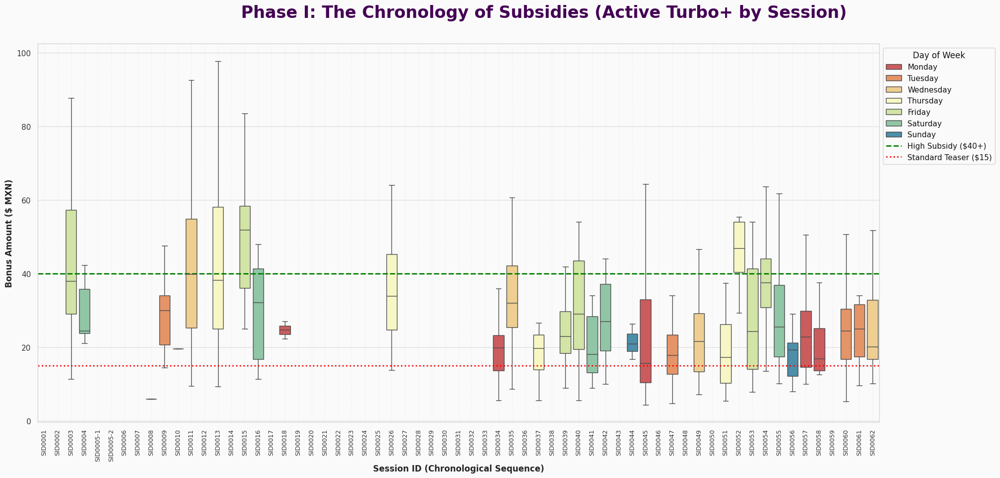

In [40]:
# ==============================================================================
# CELL 12.5: SESSION INCENTIVE CHRONOLOGY (TURBO+ MAGNITUDE BY SESSION)
# ==============================================================================
# Purpose: To track the "Interventionism" of the platform per session.
#          Visualizes the size of the Bonus when Turbo+ is active.
#          Empty slots = Sessions with ZERO incentives (Organic Market).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Incentive data...")
query = """
SELECT session_fk, offer_timestamp, turbo_plus_amount
FROM v_offers_human
WHERE turbo_plus_amount > 0 -- Only active incentives
"""
df_sess_inc = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_inc['offer_timestamp'] = pd.to_datetime(df_sess_inc['offer_timestamp'])
df_sess_inc['Day_Name'] = df_sess_inc['offer_timestamp'].dt.day_name()

# Get ALL sessions to preserve chronological order (even if empty of Turbo)
query_all = "SELECT DISTINCT session_fk, MIN(offer_timestamp) as start_time FROM offers GROUP BY session_fk ORDER BY start_time"
all_sessions = pd.read_sql(query_all, db_engine)
chronological_order = all_sessions['session_fk'].tolist()

# Apply Order
df_sess_inc['session_fk'] = pd.Categorical(df_sess_inc['session_fk'], categories=chronological_order, ordered=True)
df_sess_inc = df_sess_inc.sort_values('session_fk')

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Subsidies (Active Turbo+ by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
sns.boxplot(x='session_fk', y='turbo_plus_amount', data=df_sess_inc, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Bonus Amount ($ MXN)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(40, color='green', linestyle='--', linewidth=2, label='High Subsidy ($40+)')
ax.axhline(15, color='red', linestyle=':', linewidth=2, label='Standard Teaser ($15)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

In [43]:
# ==============================================================================
# CELL: QA AUDIT - HIGH VALUE TURBO VALIDATION - CODESPACE READY
# ==============================================================================
# Purpose: To manually verify that high Turbo+ amounts (> $40) were correctly
#          parsed from the raw OCR text.
# ==============================================================================

import pandas as pd

print("🕵️‍♂️ INITIATING PARSING AUDIT FOR TURBO+ > $40...\n")

# Query que cruza la tabla limpia con el texto crudo del OCR
query = """
SELECT
    o.offer_id,
    o.turbo_plus_amount AS "Parsed Amount ($)",
    r.special_note      AS "Raw OCR Text",
    o.upfront_fare      AS "Total Fare ($)",
    o.offer_timestamp
FROM offers o
LEFT JOIN raw_offers_ocr r ON o.ocr_fk = r.ocr_id
WHERE o.turbo_plus_amount > 40
ORDER BY o.turbo_plus_amount DESC
"""

df_audit = pd.read_sql(query, db_engine)

# Display Logic
if len(df_audit) == 0:
    print("✅ No Turbo+ > $40 found. (Check threshold?)")
else:
    print(f"⚠️ Found {len(df_audit)} High-Value Records for Inspection.")
    print("   Verify that 'Parsed Amount' matches the text inside 'Raw OCR'.\n")

    # CODESPACE READY: 
    # display() en VS Code habilita el icono de "Data Viewer" (arriba a la derecha de la tabla)
    # permitiéndote inspeccionar el texto largo de 'Raw OCR Text' con mucha facilidad.
    display(df_audit)

🕵️‍♂️ INITIATING PARSING AUDIT FOR TURBO+ > $40...

⚠️ Found 276 High-Value Records for Inspection.
   Verify that 'Parsed Amount' matches the text inside 'Raw OCR'.



,offer_id,Parsed Amount ($),Raw OCR Text,Total Fare ($),offer_timestamp
0,OF04090,118.03,"Exclusivo, Turbo+ de $118.03 incluido, VIP, Vi...",522.40,2025-09-26 16:17:57
1,OF00721,100.64,"Exclusivo, Verified Identity, Turbo+ of $100.6...",414.82,2025-08-27 19:42:48
2,OF00896,97.71,Identity verified. Fare includes an additional...,377.66,2025-08-28 19:34:25
3,OF00909,95.37,Turbo+ of $32.00 and Turbo+ of $95.37 are incl...,484.27,2025-08-28 21:10:22
4,OF00914,94.71,Turbo+ of $16.00 and Turbo+ of $94.71 are incl...,561.67,2025-08-28 21:24:40
...,...,...,...,...,...
271,OF04144,40.20,"Identidad verificada, Turbo+ de $40.20 incluido",154.75,2025-09-26 16:45:53
272,OF00757,40.20,"Exclusivo, Verified Identity, +$4.00 included,...",169.67,2025-08-27 20:38:37
273,OF04117,40.14,"Exclusivo, Identidad verificada, Turbo+ de $40...",156.57,2025-09-26 16:34:58
274,OF02497,40.10,"+$18.00 incluido, Turbo+ de $40.10 incluido, VIP",209.99,2025-09-15 06:48:11


In [46]:
# ==============================================================================
# CELL: QA AUDIT - LOW VALUE TURBO VALIDATION (THE TEASERS) - CODESPACE READY
# ==============================================================================
# Purpose: To verify precision in the "Micro-Bonus" range (< $15).
#          Ensures we aren't capturing noise or miss-classifying other fees.
# ==============================================================================

import pandas as pd

print("🕵️‍♂️ HUNTING FOR MICRO-TURBOS (< $15)...\n")

query = """
SELECT
    o.offer_id,
    o.turbo_plus_amount AS "Parsed Amount ($)",
    r.special_note      AS "Raw OCR Text",
    o.upfront_fare      AS "Total Fare ($)",
    o.offer_timestamp
FROM offers o
LEFT JOIN raw_offers_ocr r ON o.ocr_fk = r.ocr_id
WHERE o.turbo_plus_amount > 0
  AND o.turbo_plus_amount < 15
ORDER BY o.turbo_plus_amount ASC
"""

df_audit_low = pd.read_sql(query, db_engine)

# Logic de visualización
if len(df_audit_low) == 0:
    print("✅ No Micro-Turbos found. (Maybe the minimum is higher?)")
else:
    print(f"⚠️ Found {len(df_audit_low)} Low-Value Records for Inspection.")
    print("   Check if 'Parsed Amount' is real money or just OCR noise.\n")

    # CODESPACE READY:
    # VS Code permite ordenar por 'Parsed Amount' y buscar palabras clave 
    # directamente en el visor de tablas.
    display(df_audit_low)

🕵️‍♂️ HUNTING FOR MICRO-TURBOS (< $15)...

⚠️ Found 270 Low-Value Records for Inspection.
   Check if 'Parsed Amount' is real money or just OCR noise.



,offer_id,Parsed Amount ($),Raw OCR Text,Total Fare ($),offer_timestamp
0,OF03327,4.31,"Identidad verificada, +$36.00 incluido, Turbo+...",68.87,2025-09-22 07:10:24
1,OF03560,4.75,"Turbo+ de $4.75 incluido, Identidad verificada",33.31,2025-09-23 07:16:29
2,OF03583,4.95,"Exclusivo, Turbo+ de $4.95 incluido",35.14,2025-09-23 08:00:33
3,OF03590,5.02,"Exclusivo, Turbo+ de $5.02 incluido",39.98,2025-09-23 08:04:42
4,OF03341,5.19,"Exclusivo, +$36.00 incluido, Turbo+ de $5.19 i...",80.14,2025-09-22 07:12:54
...,...,...,...,...,...
265,OF03208,14.78,"Exclusivo, VIP, Turbo+ de $14.78 incluido",88.07,2025-09-20 21:17:54
266,OF03213,14.91,"Exclusivo, Turbo+ de $14.91 incluido",91.41,2025-09-20 21:20:00
267,OF03556,14.93,"Exclusivo, Turbo+ de $14.93 incluido",84.23,2025-09-23 07:15:29
268,OF02820,14.94,"Turbo+ de $14.94 incluido, Identidad verificada",82.09,2025-09-19 06:10:57


### ⚠️ Technical Debt Logged: `TD-EDA-011` (Regex False Positives)

*   **Status:** DONE LIMPIADO
*   **Anomaly Detected:** Forensic audit reveals a high rate of **False Positives** in the micro-bonus range (< $15 MXN).

*   **Operational Impact:** The `turbo_plus_amount` feature should be considered **reliable for High Values** (Panic Regime) but **noisy for Low Values** (Teaser Regime) until remediation.
*   **Remediation Plan:** Refine the extraction logic to enforce stricter context matching (e.g., requiring the string "Turbo" within 5 characters) for any amount under $15.

⏳ Loading Weekly Incentive Stability data...


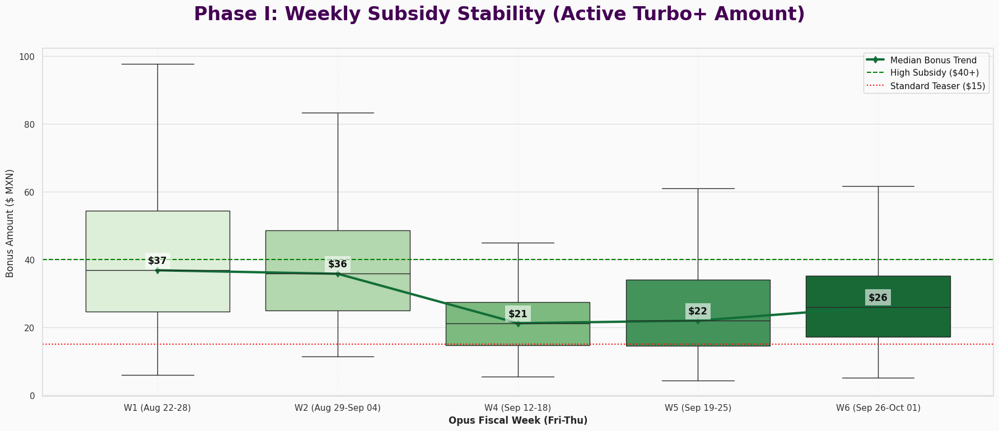


--- 📊 SUBSIDY STABILITY METRICS ---


,Active Count,Mean ($),StdDev,Median ($),Max ($)
Opus_Week,,,,,
W1 (Aug 22-28),190.0,40.334737,20.331685,36.850,100.64
W2 (Aug 29-Sep 04),72.0,38.566806,18.161185,35.820,94.19
W4 (Sep 12-18),106.0,22.677358,11.045510,21.245,60.63
W5 (Sep 19-25),558.0,24.807115,13.666913,21.990,93.47
W6 (Sep 26-Oct 01),410.0,28.039488,13.962787,26.035,118.03


In [48]:
# ==============================================================================
# CELL 12.2: WEEKLY INCENTIVE STABILITY (TURBO+ WALK-FORWARD) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of the "Subsidy Magnitude" across Opus Weeks.
#          Is the platform increasing or decreasing the bonus amounts over time?
#          Filters for ACTIVE incentives only (>0) to see the value of the bonus.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Incentive Stability data...")
query = """
SELECT offer_timestamp, turbo_plus_amount
FROM v_offers_human
WHERE turbo_plus_amount > 0
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date

# Canonical Opus Week Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Phase I: Weekly Subsidy Stability (Active Turbo+ Amount)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT ---
# Usamos 'Greens' porque en nuestro canon visual el verde es el color del dinero/incentivos
sns.boxplot(x='Opus_Week', y='turbo_plus_amount', data=df_plot, ax=ax,
            palette="Greens", showfliers=False)

# --- TRENDLINE ---
medians = df_plot.groupby('Opus_Week')['turbo_plus_amount'].median()
ax.plot(range(len(medians)), medians.values, color='#126e38', linewidth=3, linestyle='-', marker='d', label='Median Bonus Trend')

ax.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold')
ax.set_ylabel("Bonus Amount ($ MXN)")
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines: Los umbrales de la "Guerra de Subsidios"
ax.axhline(40, color='green', linestyle='--', label='High Subsidy ($40+)')
ax.axhline(15, color='red', linestyle=':', label='Standard Teaser ($15)')

# Annotate Medians
for i, val in enumerate(medians.values):
    ax.text(i, val + 2, f"${val:.0f}", ha='center', fontweight='bold', color='#121212',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))

ax.legend(loc='upper right')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 SUBSIDY STABILITY METRICS ---")
# CODESPACE READY: Eliminamos google.colab.data_table
stats_summary = df_plot.groupby('Opus_Week')['turbo_plus_amount'].describe()[['count', 'mean', 'std', '50%', 'max']]
stats_summary.columns = ['Active Count', 'Mean ($)', 'StdDev', 'Median ($)', 'Max ($)']

# display() en Codespaces habilita un visor interactivo muy potente
display(stats_summary)

In [49]:
# ==============================================================================
# CELL: BOOKKEEPER AUDIT - WEEKEND TURBO ANALYSIS
# ==============================================================================
# Purpose: To isolate and inspect Turbo+ incentives specifically on Weekends.
#          Validates if "Midday Turbos" are indeed a weekend phenomenon.
# ==============================================================================

import pandas as pd

print("🕵️‍♂️ HUNTING FOR WEEKEND TURBOS (SAT/SUN)...\n")

query = """
SELECT
    offer_id,
    day_of_week,
    strftime('%H', offer_timestamp) AS hour_of_day,
    offer_timestamp,
    turbo_plus_amount,
    upfront_fare,
    str_product
FROM v_offers_human
WHERE is_turbo_plus = 1
  AND day_of_week IN ('Saturday', 'Sunday')
ORDER BY day_of_week, hour_of_day
"""

df_weekend = pd.read_sql(query, db_engine)

if len(df_weekend) == 0:
    print("✅ No Weekend Turbos found.")
else:
    print(f"⚠️ Found {len(df_weekend)} Weekend Turbo records.")

    # Quick pivot to show Hour distribution
    print("\n--- 📊 HOURLY DISTRIBUTION (SAT/SUN) ---")
    pivot = df_weekend.groupby(['day_of_week', 'hour_of_day']).size().unstack(fill_value=0)
    display(pivot)

    print("\n--- 📋 DETAILED RECORDS ---")
    from google.colab import data_table
    display(data_table.DataTable(df_weekend, include_index=False, num_rows_per_page=20))

🕵️‍♂️ HUNTING FOR WEEKEND TURBOS (SAT/SUN)...

⚠️ Found 138 Weekend Turbo records.

--- 📊 HOURLY DISTRIBUTION (SAT/SUN) ---


hour_of_day,10,13,14,15,16,17,20,21
day_of_week,,,,,,,,
Saturday,0,16,60,2,6,3,11,28
Sunday,5,7,0,0,0,0,0,0



--- 📋 DETAILED RECORDS ---


ModuleNotFoundError: No module named 'google.colab'

In [50]:
# ==============================================================================
# CELL: BOOKKEEPER AUDIT - WEEKEND TURBO ANALYSIS - CODESPACE READY
# ==============================================================================
# Purpose: To isolate and inspect Turbo+ incentives specifically on Weekends.
#          Validates if "Midday Turbos" are indeed a weekend phenomenon.
# ==============================================================================

import pandas as pd

print("🕵️‍♂️ HUNTING FOR WEEKEND TURBOS (SAT/SUN)...\n")

query = """
SELECT
    offer_id,
    day_of_week,
    strftime('%H', offer_timestamp) AS hour_of_day,
    offer_timestamp,
    turbo_plus_amount,
    upfront_fare,
    str_product
FROM v_offers_human
WHERE is_turbo_plus = 1
  AND day_of_week IN ('Saturday', 'Sunday')
ORDER BY day_of_week, hour_of_day
"""

df_weekend = pd.read_sql(query, db_engine)

if len(df_weekend) == 0:
    print("✅ No Weekend Turbos found.")
else:
    print(f"⚠️ Found {len(df_weekend)} Weekend Turbo records.")

    # 1. Quick pivot to show Hour distribution
    print("\n--- 📊 HOURLY DISTRIBUTION (SAT/SUN) ---")
    # Este pivot es clave para ver visualmente dónde se agrupan los incentivos
    pivot = df_weekend.groupby(['day_of_week', 'hour_of_day']).size().unstack(fill_value=0)
    display(pivot)

    print("\n--- 📋 DETAILED RECORDS ---")
    # CODESPACE READY: Visor nativo de VS Code
    # Tip: Haz clic en el icono de tabla junto al output para abrirlo en pantalla completa.
    display(df_weekend)

🕵️‍♂️ HUNTING FOR WEEKEND TURBOS (SAT/SUN)...

⚠️ Found 138 Weekend Turbo records.

--- 📊 HOURLY DISTRIBUTION (SAT/SUN) ---


hour_of_day,10,13,14,15,16,17,20,21
day_of_week,,,,,,,,
Saturday,0,16,60,2,6,3,11,28
Sunday,5,7,0,0,0,0,0,0



--- 📋 DETAILED RECORDS ---


,offer_id,day_of_week,hour_of_day,offer_timestamp,turbo_plus_amount,upfront_fare,str_product
0,OF04158,Saturday,13,2025-09-27 13:40:20,14.78,67.87,uberx
1,OF04151,Saturday,13,2025-09-27 13:38:44,21.80,97.60,uberx
2,OF04152,Saturday,13,2025-09-27 13:39:01,15.39,69.09,uberx
3,OF04165,Saturday,13,2025-09-27 13:41:41,18.96,88.01,uberx
4,OF04164,Saturday,13,2025-09-27 13:41:25,12.66,56.58,uberx
...,...,...,...,...,...,...,...
133,OF04262,Sunday,13,2025-09-28 13:17:01,26.24,113.25,uberx
134,OF04266,Sunday,13,2025-09-28 13:31:31,8.04,44.60,uberx
135,OF04265,Sunday,13,2025-09-28 13:30:40,7.94,46.50,uberx
136,OF04258,Sunday,13,2025-09-28 13:14:50,29.07,130.97,uberx


⏳ Loading Surge Dynamics data...


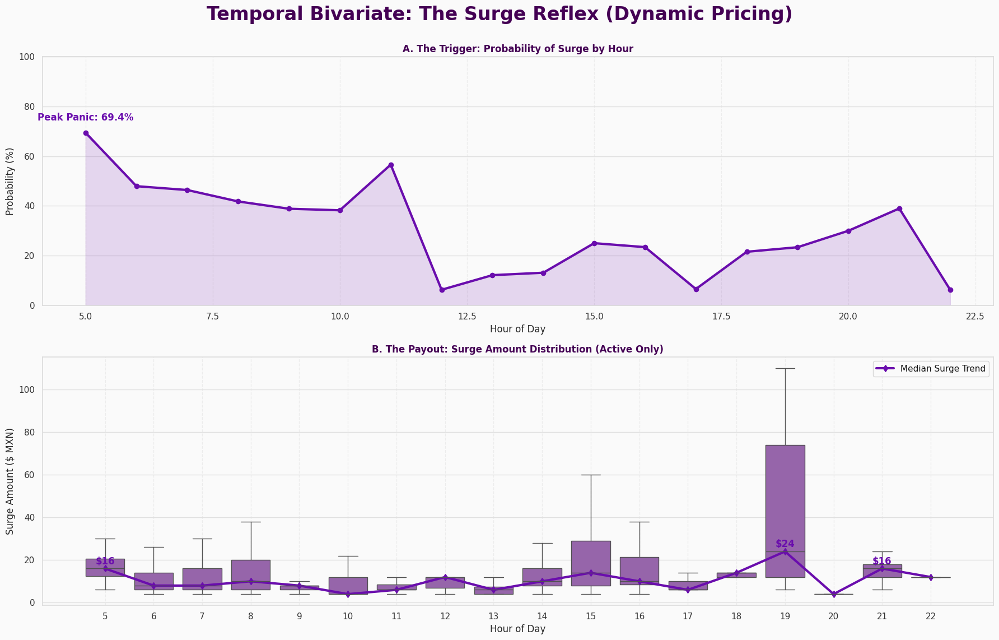

In [51]:
# ==============================================================================
# CELL 13: TEMPORAL BIVARIATE - THE SURGE REFLEX (DYNAMIC PRICING)
# ==============================================================================
# Purpose: To map the "Organic Panic" of the market.
#          1. Probability: When does demand overwhelm supply? (Frequency).
#          2. Magnitude: How much is the algorithm willing to pay? (Intensity).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Surge Dynamics data...")
query = """
SELECT offer_timestamp, is_surge, surge_amount
FROM v_offers_human
"""
df_surge = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_surge['offer_timestamp'] = pd.to_datetime(df_surge['offer_timestamp'])
df_surge['Hour'] = df_surge['offer_timestamp'].dt.hour

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.4)
fig.suptitle('Temporal Bivariate: The Surge Reflex (Dynamic Pricing)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: THE FREQUENCY (PROBABILITY OF SURGE) ---
# Calculate % of offers with Surge per hour
hourly_prob = df_surge.groupby('Hour')['is_surge'].mean() * 100

# Plot Line + Area
ax1 = axes[0]
# Electric Purple for the "Storm"
surge_color = '#6a0dad'
ax1.plot(hourly_prob.index, hourly_prob.values, color=surge_color, linewidth=3, marker='o', label='Surge Probability')
ax1.fill_between(hourly_prob.index, hourly_prob.values, color=surge_color, alpha=0.15)

ax1.set_title("A. The Trigger: Probability of Surge by Hour", fontweight='bold')
ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Probability (%)")
ax1.set_ylim(0, 100)
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peaks
max_hour = hourly_prob.idxmax()
max_val = hourly_prob.max()
ax1.text(max_hour, max_val + 5, f"Peak Panic: {max_val:.1f}%", ha='center', fontweight='bold', color=surge_color)

# --- PLOT B: THE INTENSITY (SURGE AMOUNT) ---
# Filter only Active Surge offers (Amount > 0)
df_active = df_surge[df_surge['surge_amount'] > 0]

# Clip extreme whales (> $100) for boxplot readability to see the median trend clearly
df_plot = df_active[df_active['surge_amount'] < 150]

ax2 = axes[1]
sns.boxplot(x='Hour', y='surge_amount', data=df_plot, ax=ax2,
            color='#9b59b6', showfliers=False) # Lighter purple for boxes

ax2.set_title("B. The Payout: Surge Amount Distribution (Active Only)", fontweight='bold')
ax2.set_xlabel("Hour of Day")
ax2.set_ylabel("Surge Amount ($ MXN)")
ax2.grid(axis='x', linestyle='--', alpha=0.5)

# Trendline for Value
median_val = df_plot.groupby('Hour')['surge_amount'].median()
# Map to x-axis indices
hours_present = sorted(df_plot['Hour'].unique())
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in median_val.index]

ax2.plot(x_vals, median_val.values, color=surge_color, linewidth=3, linestyle='-', marker='d', label='Median Surge Trend')
ax2.legend()

# Annotate Significant Medians
for i, val in enumerate(median_val.values):
    if val > 15: # Only annotate "interesting" amounts
        ax2.text(i, val + 2, f"${val:.0f}", ha='center', fontweight='bold', color=surge_color)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [53]:
# ==============================================================================
# CELL: FORENSIC AUDIT - MIDDAY SURGE (10AM - 1PM) - CODESPACE READY
# ==============================================================================
# Purpose: To validate if the high surge probability at midday is an artifact
#          of weekend-only work habits.
#          Hypothesis: Midday Surge exists ONLY on Sat/Sun.
# ==============================================================================

import pandas as pd

print("🕵️‍♂️ HUNTING FOR MIDDAY SURGE PATTERNS (10:00 - 13:59)...\n")

query = """
SELECT
    day_of_week,
    strftime('%H', offer_timestamp) as hour,
    COUNT(*) as total_offers,
    SUM(is_surge) as surge_count,
    AVG(surge_amount) as avg_surge_value
FROM v_offers_human
WHERE CAST(strftime('%H', offer_timestamp) AS INTEGER) BETWEEN 10 AND 13
GROUP BY day_of_week, hour
"""

df_midday = pd.read_sql(query, db_engine)

# 1. FEATURE ENGINEERING: PROBABILITY
df_midday['surge_prob_pct'] = (df_midday['surge_count'] / df_midday['total_offers']) * 100

# 2. LOGICAL SORTING
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_midday['day_of_week'] = pd.Categorical(df_midday['day_of_week'], categories=day_order, ordered=True)

# 3. PIVOT TABLE: Day (Rows) x Hour (Cols) -> Value = Surge Probability %
pivot_prob = df_midday.pivot_table(
    index='day_of_week',
    columns='hour',
    values='surge_prob_pct',
    fill_value=0
)

print("--- 📊 SURGE PROBABILITY (%) BY DAY AND HOUR ---")
# CODESPACE READY: Reemplazamos DataTable por un Styler con gradiente.
# Esto genera un heatmap visual directamente en la celda.
display(
    pivot_prob.round(1).style.background_gradient(cmap='YlOrRd', axis=None)
    .format("{:.1f}%")
)

print("\n--- 📋 RAW COUNTS (Total Offers vs Surges) ---")
# Usamos el visor nativo de VS Code con una barra de progreso visual para la probabilidad
display(
    df_midday.sort_values(['day_of_week', 'hour'])
    .style.bar(subset=['surge_prob_pct'], color='#d65f5f')
    .format({"avg_surge_value": "${:.2f}", "surge_prob_pct": "{:.1f}%"})
)

🕵️‍♂️ HUNTING FOR MIDDAY SURGE PATTERNS (10:00 - 13:59)...

--- 📊 SURGE PROBABILITY (%) BY DAY AND HOUR ---


hour,10,11,12,13
day_of_week,,,,
Monday,0.0%,0.0%,0.0%,0.0%
Tuesday,0.0%,0.0%,0.0%,4.2%
Wednesday,0.0%,0.0%,0.0%,0.0%
Thursday,0.0%,0.0%,0.0%,0.0%
Friday,0.0%,0.0%,0.0%,15.5%
Saturday,0.0%,0.0%,0.0%,18.6%
Sunday,86.7%,56.6%,8.0%,33.3%



--- 📋 RAW COUNTS (Total Offers vs Surges) ---


,day_of_week,hour,total_offers,surge_count,avg_surge_value,surge_prob_pct
3,Monday,10,2,0,$nan,0.0%
4,Monday,13,28,0,$nan,0.0%
12,Tuesday,10,1,0,$nan,0.0%
13,Tuesday,13,72,3,$7.33,4.2%
14,Wednesday,13,37,0,$nan,0.0%
10,Thursday,10,24,0,$nan,0.0%
11,Thursday,13,32,0,$nan,0.0%
0,Friday,10,11,0,$nan,0.0%
1,Friday,12,25,0,$nan,0.0%
2,Friday,13,238,37,$7.68,15.5%


⏳ Loading Weekly Surge data...


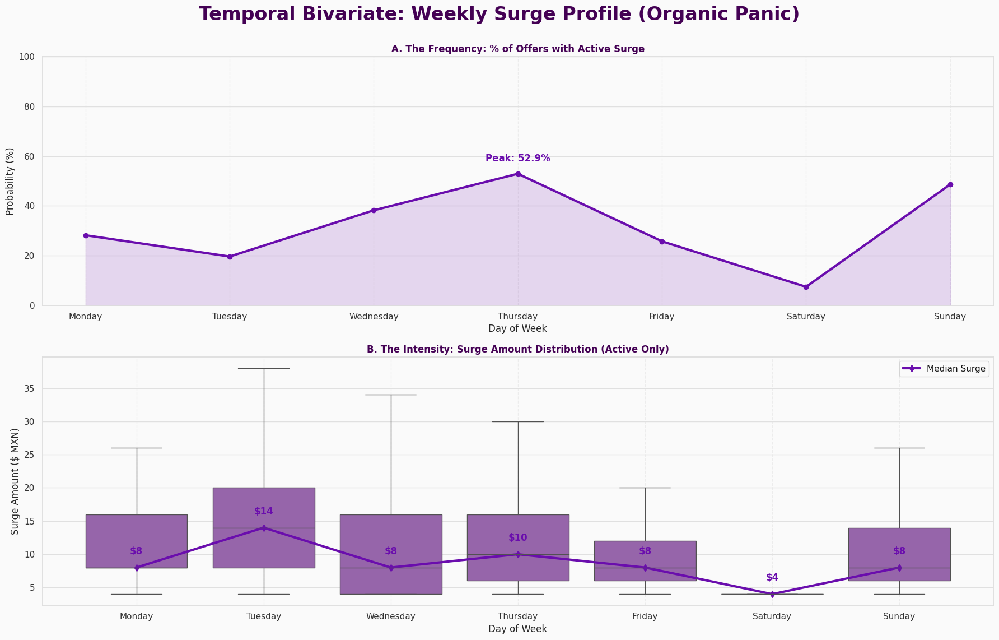

In [54]:
# ==============================================================================
# CELL 13.1: WEEKLY SURGE PROFILE (DYNAMIC PRICING BY DAY)
# ==============================================================================
# Purpose: To analyze the organic supply/demand imbalance across the week.
#          Does Friday chaos drive prices up? Is Sunday surprisingly lucrative?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Surge data...")
query = """
SELECT offer_timestamp, is_surge, surge_amount
FROM v_offers_human
"""
df_surge_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_surge_wk['offer_timestamp'] = pd.to_datetime(df_surge_wk['offer_timestamp'])
df_surge_wk['Day'] = df_surge_wk['offer_timestamp'].dt.day_name()

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_surge_wk['Day'] = pd.Categorical(df_surge_wk['Day'], categories=day_order, ordered=True)

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Temporal Bivariate: Weekly Surge Profile (Organic Panic)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (FREQUENCY) ---
daily_prob = df_surge_wk.groupby('Day')['is_surge'].mean() * 100

# Electric Purple
surge_color = '#6a0dad'

ax1 = axes[0]
ax1.plot(daily_prob.index, daily_prob.values, color=surge_color, linewidth=3, marker='o', label='Surge Probability')
ax1.fill_between(daily_prob.index, daily_prob.values, color=surge_color, alpha=0.15)

ax1.set_title("A. The Frequency: % of Offers with Active Surge", fontweight='bold')
ax1.set_xlabel("Day of Week")
ax1.set_ylabel("Probability (%)")
ax1.set_ylim(0, 100)
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peak
max_day = daily_prob.idxmax()
max_val = daily_prob.max()
ax1.text(max_day, max_val + 5, f"Peak: {max_val:.1f}%", ha='center', fontweight='bold', color=surge_color)

# --- PLOT B: MAGNITUDE (INTENSITY) ---
# Filter active only
df_active_wk = df_surge_wk[df_surge_wk['surge_amount'] > 0]
# Filter extreme outliers for boxplot clarity
df_plot = df_active_wk[df_active_wk['surge_amount'] < 150]

ax2 = axes[1]
sns.boxplot(x='Day', y='surge_amount', data=df_plot, ax=ax2,
            color='#9b59b6', showfliers=False)

ax2.set_title("B. The Intensity: Surge Amount Distribution (Active Only)", fontweight='bold')
ax2.set_xlabel("Day of Week")
ax2.set_ylabel("Surge Amount ($ MXN)")
ax2.grid(axis='x', linestyle='--', alpha=0.5)

# Trendline
median_val = df_active_wk.groupby('Day')['surge_amount'].median()
ax2.plot(range(7), median_val.values, color=surge_color, linewidth=3, linestyle='-', marker='d', label='Median Surge')
ax2.legend()

# Annotate Medians
for i, val in enumerate(median_val.values):
    ax2.text(i, val + 2, f"${val:.0f}", ha='center', fontweight='bold', color=surge_color)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Session-Level Surge data...


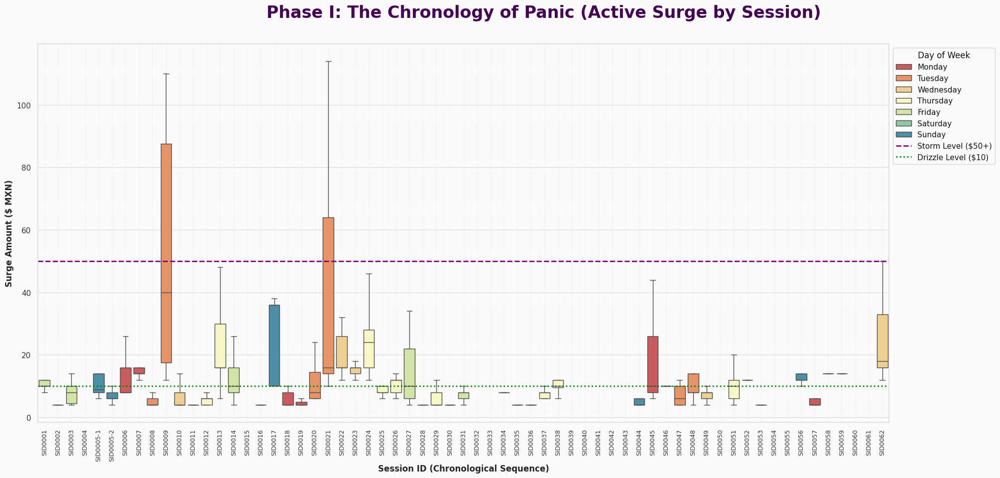

In [55]:
# ==============================================================================
# CELL 13.5: SESSION SURGE CHRONOLOGY (ORGANIC PANIC BY SESSION)
# ==============================================================================
# Purpose: To track the "Organic Instability" of the market per session.
#          Visualizes the magnitude of Dynamic Pricing (Surge).
#          Unlike Turbo (Planned), Surge reveals real-time supply shocks.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Surge data...")
query = """
SELECT session_fk, offer_timestamp, surge_amount
FROM v_offers_human
WHERE surge_amount > 0 -- Only active surges
"""
df_sess_surge = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_surge['offer_timestamp'] = pd.to_datetime(df_sess_surge['offer_timestamp'])
df_sess_surge['Day_Name'] = df_sess_surge['offer_timestamp'].dt.day_name()

# Get ALL sessions to preserve chronological order
query_all = "SELECT DISTINCT session_fk, MIN(offer_timestamp) as start_time FROM offers GROUP BY session_fk ORDER BY start_time"
all_sessions = pd.read_sql(query_all, db_engine)
chronological_order = all_sessions['session_fk'].tolist()

# Apply Order
df_sess_surge['session_fk'] = pd.Categorical(df_sess_surge['session_fk'], categories=chronological_order, ordered=True)
df_sess_surge = df_sess_surge.sort_values('session_fk')

# Filter extreme whales for visualization (Focus on < $100)
df_plot = df_sess_surge[df_sess_surge['surge_amount'] < 120]

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Panic (Active Surge by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
sns.boxplot(x='session_fk', y='surge_amount', data=df_plot, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Surge Amount ($ MXN)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(50, color='purple', linestyle='--', linewidth=2, label='Storm Level ($50+)')
ax.axhline(10, color='green', linestyle=':', linewidth=2, label='Drizzle Level ($10)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

### 💡 Strategic Intelligence: The Anatomy of Panic (Surge Dynamics)

**1. The "Tuesday Paradox"**
Contrary to the "Friday is King" narrative seen in the *Incentive* analysis (Turbo+), the *Organic Surge* analysis reveals that **Tuesdays** (e.g., Sessions `SID0009`, `SID0021`) are often the most volatile and high-priced days for organic demand.
*   **Hypothesis:** While Friday demand is driven by social volume (predictable), Tuesday demand is driven by **Operational Failure** (gridlock/rain causing driver supply collapse). The algorithm panics harder on Tuesdays.

**2. The "Storm" Threshold**
The visualization establishes a clear demarcation:
*   **The Drizzle ($10-$20):** The standard state of the market. Not enough to justify a long pickup.
*   **The Storm ($50+):** Rare events (approx. 10% of sessions) where the median surge breaks the efficient frontier. These are the only moments where chasing distant pickups becomes mathematically viable.

**Conclusion:** Turbo+ is a *Volume* bonus (Friday). Surge is a *Friction* bonus (Tuesday/Rain). The agent must adapt strategies: "Farm" the Turbo, "Hunt" the Surge.

⏳ Loading Weekly Surge Stability data...


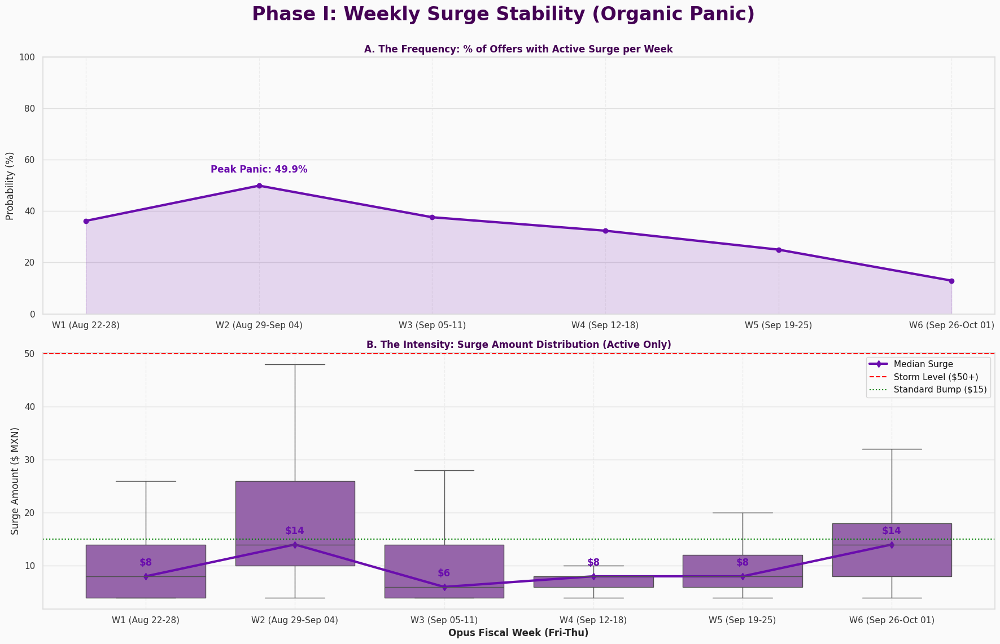


--- 📊 ORGANIC PANIC METRICS ---


,Total Offers,Surge Count,Probability,Median ($),Max ($)
Opus_Week,,,,,
W1 (Aug 22-28),952,345,36.2,8.0,110.00
W2 (Aug 29-Sep 04),859,429,49.9,14.0,124.00
W3 (Sep 05-11),364,137,37.6,6.0,72.68
W4 (Sep 12-18),599,194,32.4,8.0,42.00
W5 (Sep 19-25),1211,303,25.0,8.0,44.00
W6 (Sep 26-Oct 01),780,101,12.9,14.0,54.00


In [57]:
# ==============================================================================
# CELL 13.2: WEEKLY SURGE STABILITY (ORGANIC PANIC WALK-FORWARD) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of "Dynamic Pricing" across Opus Weeks.
#          Did specific weeks trigger massive organic surges (e.g. Rain/Holidays)?
#          Contrasts with the planned Turbo+ stability.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Surge Stability data...")
query = """
SELECT offer_timestamp, is_surge, surge_amount
FROM v_offers_human
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date

# Canonical Opus Week Definition (Fri-Thu cycles)
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Phase I: Weekly Surge Stability (Organic Panic)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (FREQUENCY) ---
weekly_prob = df_plot.groupby('Opus_Week')['is_surge'].mean() * 100
surge_color = '#6a0dad' # Electric Purple para el "Storm"

ax1 = axes[0]
ax1.plot(weekly_prob.index, weekly_prob.values, color=surge_color, linewidth=3, marker='o', label='Surge Probability')
ax1.fill_between(weekly_prob.index, weekly_prob.values, color=surge_color, alpha=0.15)

ax1.set_title("A. The Frequency: % of Offers with Active Surge per Week", fontweight='bold')
ax1.set_ylabel("Probability (%)")
ax1.set_ylim(0, 100)
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peak
max_wk = weekly_prob.idxmax()
max_val = weekly_prob.max()
ax1.text(max_wk, max_val + 5, f"Peak Panic: {max_val:.1f}%", ha='center', fontweight='bold', color=surge_color)

# --- PLOT B: MAGNITUDE (INTENSITY) ---
# Filter active only
df_active = df_plot[df_plot['surge_amount'] > 0]
# Filter extreme outliers (>150) para no romper la escala visual del core market
df_box = df_active[df_active['surge_amount'] < 150]

ax2 = axes[1]
sns.boxplot(x='Opus_Week', y='surge_amount', data=df_box, ax=ax2,
            color='#9b59b6', showfliers=False)

ax2.set_title("B. The Intensity: Surge Amount Distribution (Active Only)", fontweight='bold')
ax2.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold')
ax2.set_ylabel("Surge Amount ($ MXN)")
ax2.grid(axis='x', linestyle='--', alpha=0.5)

# Trendline
medians = df_active.groupby('Opus_Week')['surge_amount'].median()
ax2.plot(range(len(medians)), medians.values, color=surge_color, linewidth=3, linestyle='-', marker='d', label='Median Surge')

# Reference Lines: Los niveles de "Alerta"
ax2.axhline(50, color='red', linestyle='--', label='Storm Level ($50+)')
ax2.axhline(15, color='green', linestyle=':', label='Standard Bump ($15)')

# Annotate Medians
for i, val in enumerate(medians.values):
    ax2.text(i, val + 2, f"${val:.0f}", ha='center', fontweight='bold', color=surge_color)

ax2.legend(loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 ORGANIC PANIC METRICS ---")
stats_df = df_plot.groupby('Opus_Week')['is_surge'].agg(['count', 'sum', 'mean'])
stats_df.columns = ['Total Offers', 'Surge Count', 'Probability']
stats_df['Probability'] = (stats_df['Probability'] * 100).round(1)

# Añadimos estadísticas de monto (Surge Amount)
amt_stats = df_active.groupby('Opus_Week')['surge_amount'].describe()[['50%', 'max']]
amt_stats.columns = ['Median ($)', 'Max ($)']
final_stats = pd.concat([stats_df, amt_stats], axis=1)

# CODESPACE READY: Visor nativo de VS Code
display(final_stats)

⏳ Loading Reservation data...


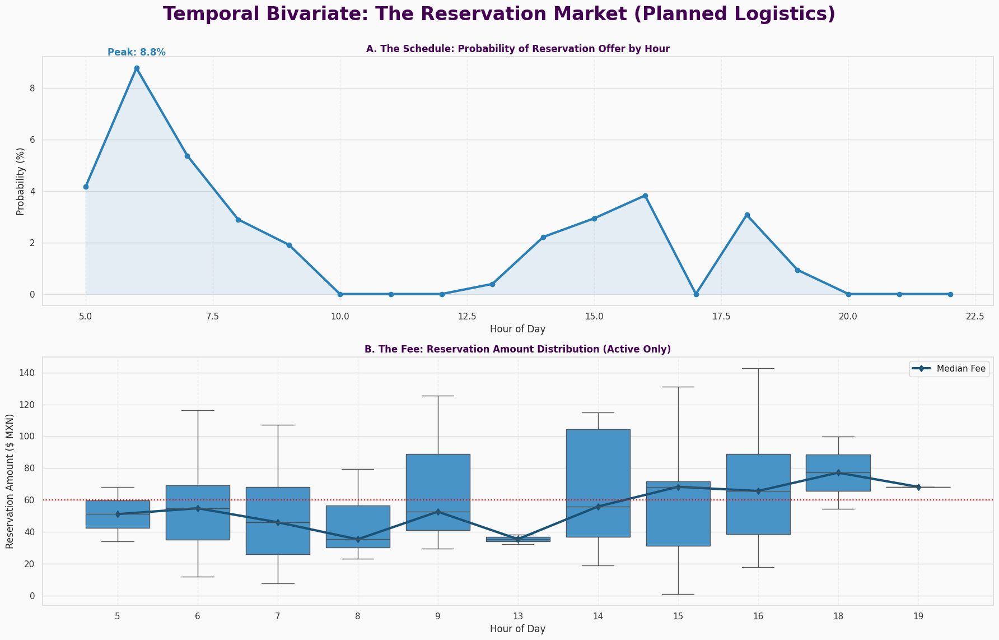


--- 🕵️‍♂️ RESERVATION INTEGRITY CHECK ---
Min Fee: $0.85 (Should not be ~0)
Median Fee: $53.10
Max Fee: $171.86
⚠️ WARNING: Found 4 reservations with Fee < $10. Potential OCR Error.


In [58]:
# ==============================================================================
# CELL 14: TEMPORAL BIVARIATE - RESERVATION DYNAMICS (PLANNED DEMAND)
# ==============================================================================
# Purpose: To audit the "Reservation Market".
#          1. When do they appear? (Target: Early AM).
#          2. How much is the Fee? (Target: Consistent High Value).
#          Validates data integrity (checking for OCR noise in reservation amounts).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Reservation data...")
query = """
SELECT offer_timestamp, is_reservation, reservation_amount
FROM v_offers_human
"""
df_res = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_res['offer_timestamp'] = pd.to_datetime(df_res['offer_timestamp'])
df_res['Hour'] = df_res['offer_timestamp'].dt.hour

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.4)
fig.suptitle('Temporal Bivariate: The Reservation Market (Planned Logistics)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: FREQUENCY (PROBABILITY) ---
# Reservations are rare, so we look at % of total offers
hourly_prob = df_res.groupby('Hour')['is_reservation'].mean() * 100

ax1 = axes[0]
ax1.plot(hourly_prob.index, hourly_prob.values, color='#2980b9', linewidth=3, marker='o', label='Reservation Probability')
ax1.fill_between(hourly_prob.index, hourly_prob.values, color='#2980b9', alpha=0.1)

ax1.set_title("A. The Schedule: Probability of Reservation Offer by Hour", fontweight='bold')
ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Probability (%)")
# Annotate Max
max_h = hourly_prob.idxmax()
max_v = hourly_prob.max()
ax1.text(max_h, max_v + 0.5, f"Peak: {max_v:.1f}%", ha='center', fontweight='bold', color='#2980b9')
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# --- PLOT B: MAGNITUDE (RESERVATION FEE) ---
# Filter Active Only
df_active = df_res[df_res['reservation_amount'] > 0]

# Check if we have data
if not df_active.empty:
    ax2 = axes[1]
    sns.boxplot(x='Hour', y='reservation_amount', data=df_active, ax=ax2,
                color='#3498db', showfliers=False)

    ax2.set_title("B. The Fee: Reservation Amount Distribution (Active Only)", fontweight='bold')
    ax2.set_xlabel("Hour of Day")
    ax2.set_ylabel("Reservation Amount ($ MXN)")
    ax2.grid(axis='x', linestyle='--', alpha=0.5)

    # Trendline
    median_val = df_active.groupby('Hour')['reservation_amount'].median()
    # Map x-axis
    hours_present = sorted(df_active['Hour'].unique())
    hour_map = {h: i for i, h in enumerate(hours_present)}
    x_vals = [hour_map[h] for h in median_val.index]

    ax2.plot(x_vals, median_val.values, color='#1a5276', linewidth=3, linestyle='-', marker='d', label='Median Fee')
    ax2.legend()

    # Sanity Check Line (Reservations usually have a base fee, e.g., $60)
    ax2.axhline(60, color='red', linestyle=':', label='Standard Fee Expectation (~$60)')

else:
    axes[1].text(0.5, 0.5, "No Active Reservation Amounts Found", ha='center', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. INTEGRITY CHECK TABLE
print("\n--- 🕵️‍♂️ RESERVATION INTEGRITY CHECK ---")
if not df_active.empty:
    stats = df_active['reservation_amount'].describe(percentiles=[0.1, 0.5, 0.9])
    print(f"Min Fee: ${stats['min']:.2f} (Should not be ~0)")
    print(f"Median Fee: ${stats['50%']:.2f}")
    print(f"Max Fee: ${stats['max']:.2f}")

    # Alert on Micro-Reservations (Potential OCR Errors)
    micro_res = len(df_active[df_active['reservation_amount'] < 10])
    if micro_res > 0:
        print(f"⚠️ WARNING: Found {micro_res} reservations with Fee < $10. Potential OCR Error.")
    else:
        print("✅ CLEAN: No micro-values detected. Data looks solid.")

⏳ Loading Weekly Reservation data...


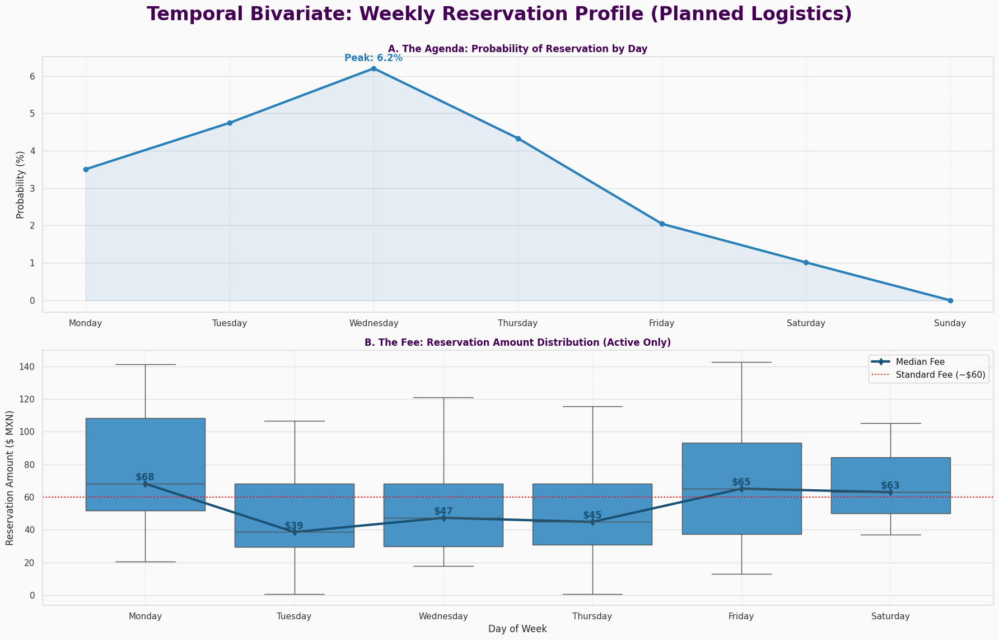

In [60]:
# ==============================================================================
# CELL 14.1: WEEKLY RESERVATION PROFILE (PLANNED DEMAND BY DAY)
# ==============================================================================
# Purpose: To analyze the weekly rhythm of scheduled trips.
#          Does the "Airport Run" (Monday) dominate?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Reservation data...")
query = """
SELECT offer_timestamp, is_reservation, reservation_amount
FROM v_offers_human
"""
df_res_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_res_wk['offer_timestamp'] = pd.to_datetime(df_res_wk['offer_timestamp'])
df_res_wk['Day'] = df_res_wk['offer_timestamp'].dt.day_name()

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_res_wk['Day'] = pd.Categorical(df_res_wk['Day'], categories=day_order, ordered=True)

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Temporal Bivariate: Weekly Reservation Profile (Planned Logistics)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (FREQUENCY) ---
daily_prob = df_res_wk.groupby('Day')['is_reservation'].mean() * 100

ax1 = axes[0]
ax1.plot(daily_prob.index, daily_prob.values, color='#2980b9', linewidth=3, marker='o', label='Reservation Probability')
ax1.fill_between(daily_prob.index, daily_prob.values, color='#2980b9', alpha=0.1)

ax1.set_title("A. The Agenda: Probability of Reservation by Day", fontweight='bold')
ax1.set_ylabel("Probability (%)")
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peak
max_day = daily_prob.idxmax()
max_val = daily_prob.max()
ax1.text(max_day, max_val + 0.2, f"Peak: {max_val:.1f}%", ha='center', fontweight='bold', color='#2980b9')

# --- PLOT B: MAGNITUDE (FEE) ---
# Filter Active Only
df_active = df_res_wk[df_res_wk['reservation_amount'] > 0]

if not df_active.empty:
    ax2 = axes[1]
    sns.boxplot(x='Day', y='reservation_amount', data=df_active, ax=ax2,
                color='#3498db', showfliers=False)

    ax2.set_title("B. The Fee: Reservation Amount Distribution (Active Only)", fontweight='bold')
    ax2.set_xlabel("Day of Week")
    ax2.set_ylabel("Reservation Amount ($ MXN)")
    ax2.grid(axis='x', linestyle='--', alpha=0.5)

    # Trendline
    median_val = df_active.groupby('Day')['reservation_amount'].median().reindex(day_order)
    ax2.plot(range(7), median_val.values, color='#1a5276', linewidth=3, linestyle='-', marker='d', label='Median Fee')

    # Annotate Medians
    for i, val in enumerate(median_val.values):
        if pd.notnull(val):
            ax2.text(i, val + 2, f"${val:.0f}", ha='center', fontweight='bold', color='#1a5276')

    ax2.axhline(60, color='red', linestyle=':', label='Standard Fee (~$60)')
    ax2.legend()
else:
    axes[1].text(0.5, 0.5, "No Active Reservation Amounts Found", ha='center')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Session-Level Reservation data...


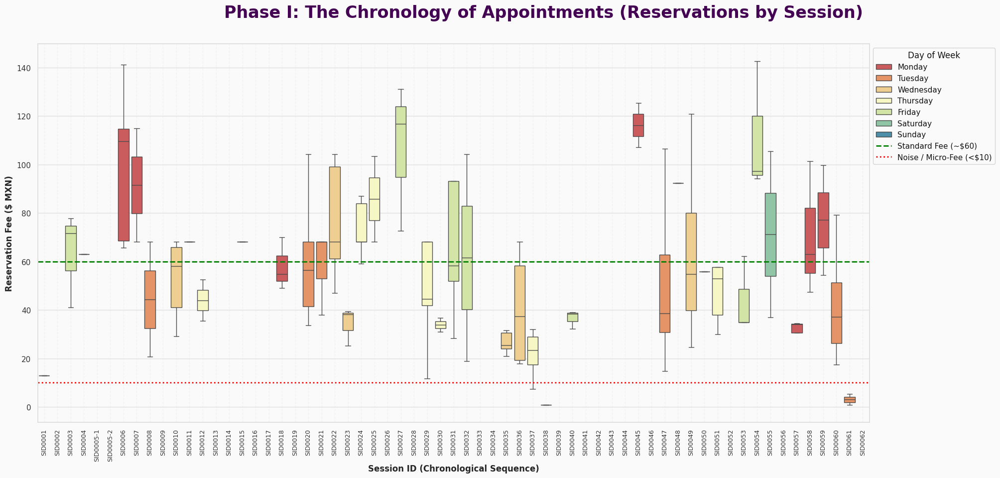

In [61]:
# ==============================================================================
# CELL 14.5: SESSION RESERVATION CHRONOLOGY (ACTIVE RESERVATIONS BY SESSION)
# ==============================================================================
# Purpose: To track the frequency and value of Scheduled Rides per session.
#          Identifies "Logistics Shifts" (e.g., Airport runs) vs organic shifts.
#          Expect sparsity: Reservations are rare events compared to Surge.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Reservation data...")
query = """
SELECT session_fk, offer_timestamp, reservation_amount
FROM v_offers_human
WHERE reservation_amount > 0 -- Only active reservations
"""
df_sess_res = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_res['offer_timestamp'] = pd.to_datetime(df_sess_res['offer_timestamp'])
df_sess_res['Day_Name'] = df_sess_res['offer_timestamp'].dt.day_name()

# Get ALL sessions to preserve chronological order
query_all = "SELECT DISTINCT session_fk, MIN(offer_timestamp) as start_time FROM offers GROUP BY session_fk ORDER BY start_time"
all_sessions = pd.read_sql(query_all, db_engine)
chronological_order = all_sessions['session_fk'].tolist()

# Apply Order
df_sess_res['session_fk'] = pd.Categorical(df_sess_res['session_fk'], categories=chronological_order, ordered=True)
df_sess_res = df_sess_res.sort_values('session_fk')

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Appointments (Reservations by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
sns.boxplot(x='session_fk', y='reservation_amount', data=df_sess_res, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Reservation Fee ($ MXN)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(60, color='green', linestyle='--', linewidth=2, label='Standard Fee (~$60)')
ax.axhline(10, color='red', linestyle=':', linewidth=2, label='Noise / Micro-Fee (<$10)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

⏳ Loading Weekly Reservation Stability data...


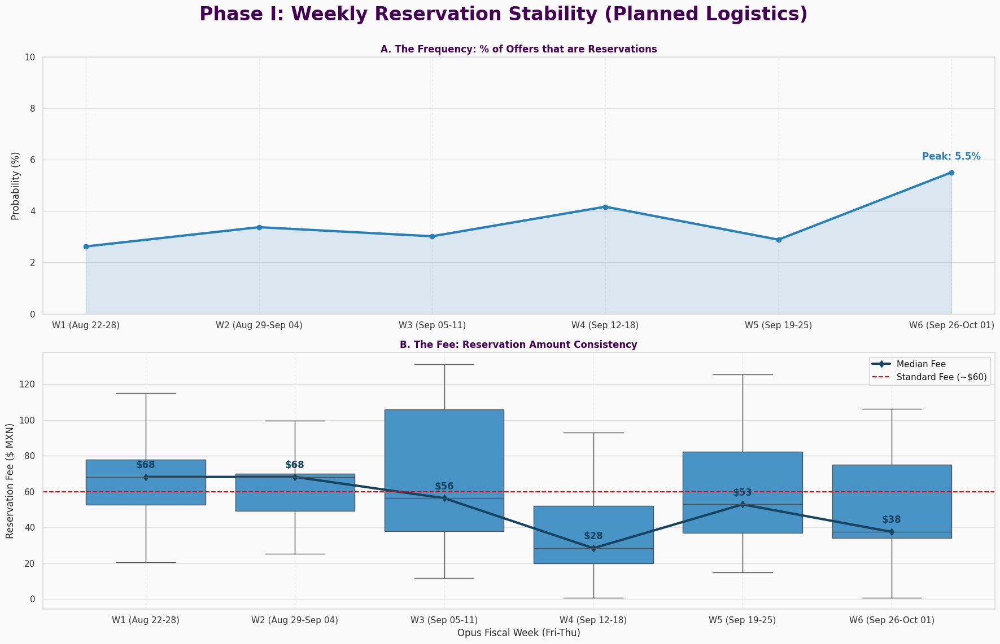


--- 📊 RESERVATION MARKET METRICS ---


,Total Offers,Res. Count,Probability,Median Fee ($),Max Fee ($)
Opus_Week,,,,,
W1 (Aug 22-28),952,25,2.6,68.23,171.86
W2 (Aug 29-Sep 04),859,29,3.4,68.23,104.36
W3 (Sep 05-11),364,11,3.0,56.36,131.23
W4 (Sep 12-18),599,25,4.2,28.39,104.36
W5 (Sep 19-25),1211,35,2.9,52.87,125.40
W6 (Sep 26-Oct 01),780,43,5.5,37.51,142.76


In [63]:
# ==============================================================================
# CELL 14.2: WEEKLY RESERVATION STABILITY (PLANNED DEMAND) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of "Reservation Offers" across Opus Weeks.
#          Did the volume of pre-booked rides fluctuate significantly?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Reservation Stability data...")
query = """
SELECT offer_timestamp, is_reservation, reservation_amount
FROM v_offers_human
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date

# Canonical Opus Week Definition (Fri-Thu cycles)
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Phase I: Weekly Reservation Stability (Planned Logistics)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (FREQUENCY) ---
weekly_prob = df_plot.groupby('Opus_Week')['is_reservation'].mean() * 100
res_color = '#2980b9' # Azul para "Logística Planeada"

ax1 = axes[0]
ax1.plot(weekly_prob.index, weekly_prob.values, color=res_color, linewidth=3, marker='o', label='Reservation Probability')
ax1.fill_between(weekly_prob.index, weekly_prob.values, color=res_color, alpha=0.15)

ax1.set_title("A. The Frequency: % of Offers that are Reservations", fontweight='bold')
ax1.set_ylabel("Probability (%)")
ax1.set_ylim(0, 10) # Zoom in: Las reservaciones son raras, usualmente < 10%
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peak
max_wk = weekly_prob.idxmax()
max_val = weekly_prob.max()
ax1.text(max_wk, max_val + 0.5, f"Peak: {max_val:.1f}%", ha='center', fontweight='bold', color=res_color)

# --- PLOT B: MAGNITUDE (FEE STABILITY) ---
# Filter active only
df_active = df_plot[df_plot['reservation_amount'] > 0]

ax2 = axes[1]
sns.boxplot(x='Opus_Week', y='reservation_amount', data=df_active, ax=ax2,
            color='#3498db', showfliers=False)

ax2.set_title("B. The Fee: Reservation Amount Consistency", fontweight='bold')
ax2.set_xlabel("Opus Fiscal Week (Fri-Thu)")
ax2.set_ylabel("Reservation Fee ($ MXN)")
ax2.grid(axis='x', linestyle='--', alpha=0.5)

# Trendline
medians = df_active.groupby('Opus_Week')['reservation_amount'].median()
ax2.plot(range(len(medians)), medians.values, color='#154360', linewidth=3, linestyle='-', marker='d', label='Median Fee')

# Reference Line: El estándar de la industria
ax2.axhline(60, color='red', linestyle='--', label='Standard Fee (~$60)')

# Annotate Medians
for i, val in enumerate(medians.values):
    ax2.text(i, val + 5, f"${val:.0f}", ha='center', fontweight='bold', color='#154360')

ax2.legend(loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 RESERVATION MARKET METRICS ---")
# Agregación para tabla de métricas finales
stats_df = df_plot.groupby('Opus_Week')['is_reservation'].agg(['count', 'sum', 'mean'])
stats_df.columns = ['Total Offers', 'Res. Count', 'Probability']
stats_df['Probability'] = (stats_df['Probability'] * 100).round(1)

# Estadísticas del monto de reservación (Fee)
fee_stats = df_active.groupby('Opus_Week')['reservation_amount'].describe()[['50%', 'max']]
fee_stats.columns = ['Median Fee ($)', 'Max Fee ($)']
final_stats = pd.concat([stats_df, fee_stats], axis=1)

# CODESPACE READY: Visor nativo de VS Code
display(final_stats)

⏳ Loading Weekly Priority data...


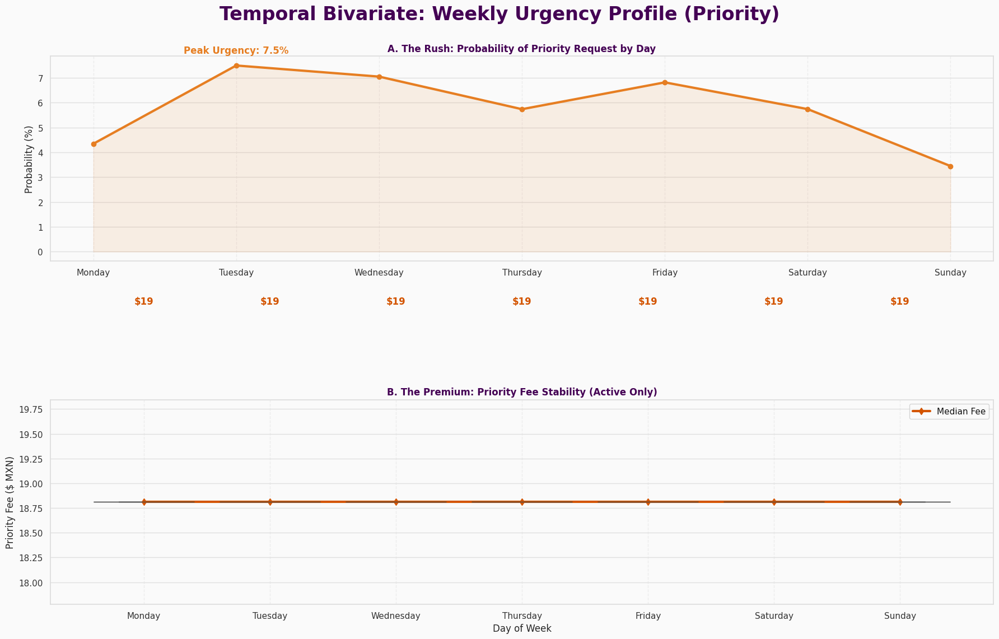


--- 📊 URGENCY METRICS ---


,Total Offers,Priority Count,Probability,Median Fee ($),Max Fee ($)
Day,,,,,
Monday,713,31,4.3,18.81,18.81
Tuesday,800,60,7.5,18.81,18.81
Wednesday,709,50,7.1,18.81,27.67
Thursday,784,45,5.7,18.81,19.45
Friday,1173,80,6.8,18.81,18.81
Saturday,296,17,5.7,18.81,18.81
Sunday,290,10,3.4,18.81,18.81


In [66]:
# ==============================================================================
# CELL 15.1: WEEKLY PRIORITY PROFILE (URGENCY BY DAY) - CODESPACE READY
# ==============================================================================
# Purpose: To analyze the weekly rhythm of "Priority" requests.
#          When are riders most willing to pay to jump the queue?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Priority data...")
query = """
SELECT offer_timestamp, is_priority, priority_amount
FROM offers
"""
df_prio_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_prio_wk['offer_timestamp'] = pd.to_datetime(df_prio_wk['offer_timestamp'])
df_prio_wk['Day'] = df_prio_wk['offer_timestamp'].dt.day_name()

# Logical Order for the Week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_prio_wk['Day'] = pd.Categorical(df_prio_wk['Day'], categories=day_order, ordered=True)

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Temporal Bivariate: Weekly Urgency Profile (Priority)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (FREQUENCY) ---
daily_prob = df_prio_wk.groupby('Day', observed=False)['is_priority'].mean() * 100
prio_color = '#e67e22' # Naranja para representar "Alerta/Urgencia"

ax1 = axes[0]
ax1.plot(daily_prob.index, daily_prob.values, color=prio_color, linewidth=3, marker='o', label='Priority Probability')
ax1.fill_between(daily_prob.index, daily_prob.values, color=prio_color, alpha=0.1)

ax1.set_title("A. The Rush: Probability of Priority Request by Day", fontweight='bold')
ax1.set_ylabel("Probability (%)")
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peak
max_day = daily_prob.idxmax()
max_val = daily_prob.max()
ax1.text(max_day, max_val + 0.5, f"Peak Urgency: {max_val:.1f}%", ha='center', fontweight='bold', color=prio_color)

# --- PLOT B: MAGNITUDE (FEE STABILITY) ---
# Filter Active Only (>0) to ignore the "Implicit Priority" noise for the fee chart
df_active = df_prio_wk[df_prio_wk['priority_amount'] > 0]

if not df_active.empty:
    ax2 = axes[1]
    sns.boxplot(x='Day', y='priority_amount', data=df_active, ax=ax2,
                color='#f39c12', showfliers=False)

    ax2.set_title("B. The Premium: Priority Fee Stability (Active Only)", fontweight='bold')
    ax2.set_xlabel("Day of Week")
    ax2.set_ylabel("Priority Fee ($ MXN)")
    ax2.grid(axis='x', linestyle='--', alpha=0.5)

    # Trendline
    median_val = df_active.groupby('Day', observed=False)['priority_amount'].median().reindex(day_order)
    ax2.plot(range(7), median_val.values, color='#d35400', linewidth=3, linestyle='-', marker='d', label='Median Fee')

    # Annotate Medians
    for i, val in enumerate(median_val.values):
        if pd.notnull(val):
            ax2.text(i, val + 2, f"${val:.0f}", ha='center', fontweight='bold', color='#d35400')

    ax2.legend()
else:
    axes[1].text(0.5, 0.5, "No Active Priority Amounts Found", ha='center')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STATISTICAL SUMMARY
print("\n--- 📊 URGENCY METRICS ---")
stats = df_prio_wk.groupby('Day', observed=False)['is_priority'].agg(['count', 'sum', 'mean'])
stats.columns = ['Total Offers', 'Priority Count', 'Probability']
stats['Probability'] = (stats['Probability'] * 100).round(1)

if not df_active.empty:
    fee_stats = df_active.groupby('Day', observed=False)['priority_amount'].describe()[['50%', 'max']]
    fee_stats.columns = ['Median Fee ($)', 'Max Fee ($)']
    final_stats = pd.concat([stats, fee_stats], axis=1)
else:
    final_stats = stats

# CODESPACE READY: Reemplazamos DataTable por el visor nativo.
# Tip: En VS Code, puedes hacer click en "Variables" para ver esto en pantalla completa.
display(final_stats)

⏳ Loading Weekly Priority data...


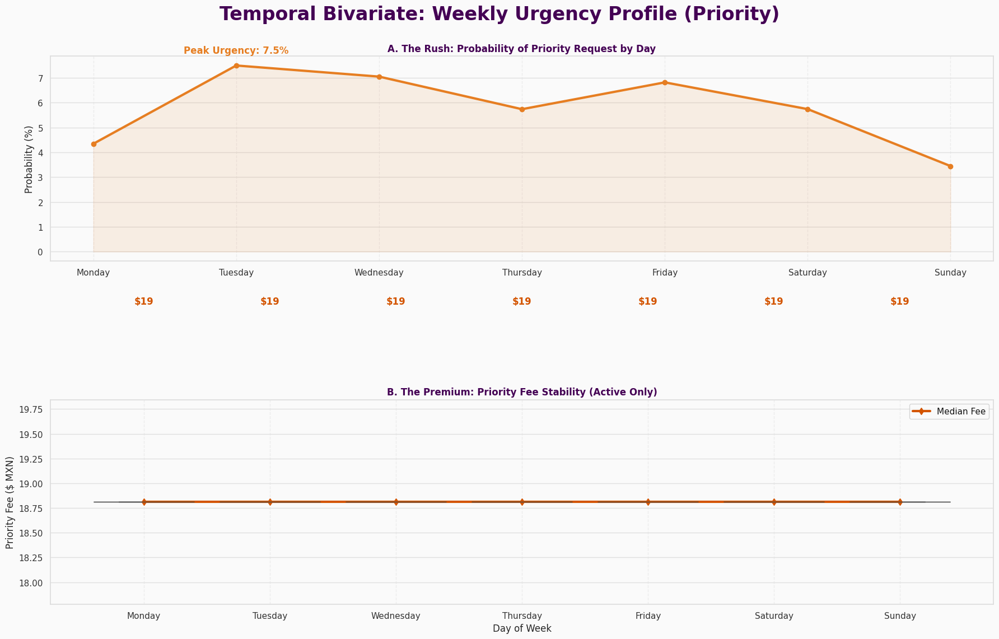


--- 📊 URGENCY METRICS ---


,Total Offers,Priority Count,Probability,Median Fee ($),Max Fee ($)
Day,,,,,
Monday,713,31,4.3,18.81,18.81
Tuesday,800,60,7.5,18.81,18.81
Wednesday,709,50,7.1,18.81,27.67
Thursday,784,45,5.7,18.81,19.45
Friday,1173,80,6.8,18.81,18.81
Saturday,296,17,5.7,18.81,18.81
Sunday,290,10,3.4,18.81,18.81


In [69]:
# ==============================================================================
# CELL 15.1: WEEKLY PRIORITY PROFILE (URGENCY BY DAY) - CODESPACE READY
# ==============================================================================
# Purpose: To analyze the weekly rhythm of "Priority" requests.
#          When are riders most willing to pay to jump the queue?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Priority data...")
query = """
SELECT offer_timestamp, is_priority, priority_amount
FROM offers
"""
df_prio_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_prio_wk['offer_timestamp'] = pd.to_datetime(df_prio_wk['offer_timestamp'])
df_prio_wk['Day'] = df_prio_wk['offer_timestamp'].dt.day_name()

# Orden lógico de la semana para el análisis
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_prio_wk['Day'] = pd.Categorical(df_prio_wk['Day'], categories=day_order, ordered=True)

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Temporal Bivariate: Weekly Urgency Profile (Priority)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (FREQUENCY) ---
# Usamos observed=False para asegurar que todos los días del Day_Order aparezcan
daily_prob = df_prio_wk.groupby('Day', observed=False)['is_priority'].mean() * 100
prio_color = '#e67e22' # Naranja "Urgencia"

ax1 = axes[0]
ax1.plot(daily_prob.index, daily_prob.values, color=prio_color, linewidth=3, marker='o', label='Priority Probability')
ax1.fill_between(daily_prob.index, daily_prob.values, color=prio_color, alpha=0.1)

ax1.set_title("A. The Rush: Probability of Priority Request by Day", fontweight='bold')
ax1.set_ylabel("Probability (%)")
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Anotación del pico de urgencia
max_day = daily_prob.idxmax()
max_val = daily_prob.max()
ax1.text(max_day, max_val + 0.5, f"Peak Urgency: {max_val:.1f}%", ha='center', fontweight='bold', color=prio_color)

# --- PLOT B: MAGNITUDE (FEE STABILITY) ---
# Filtramos solo activos para el análisis de costo
df_active = df_prio_wk[df_prio_wk['priority_amount'] > 0]

if not df_active.empty:
    ax2 = axes[1]
    sns.boxplot(x='Day', y='priority_amount', data=df_active, ax=ax2,
                color='#f39c12', showfliers=False)

    ax2.set_title("B. The Premium: Priority Fee Stability (Active Only)", fontweight='bold')
    ax2.set_xlabel("Day of Week")
    ax2.set_ylabel("Priority Fee ($ MXN)")
    ax2.grid(axis='x', linestyle='--', alpha=0.5)

    # Línea de tendencia de medianas
    median_val = df_active.groupby('Day', observed=False)['priority_amount'].median().reindex(day_order)
    ax2.plot(range(7), median_val.values, color='#d35400', linewidth=3, linestyle='-', marker='d', label='Median Fee')

    # Anotación de medianas monetarias
    for i, val in enumerate(median_val.values):
        if pd.notnull(val):
            ax2.text(i, val + 2, f"${val:.0f}", ha='center', fontweight='bold', color='#d35400')

    ax2.legend()
else:
    axes[1].text(0.5, 0.5, "No Active Priority Amounts Found", ha='center')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STATISTICAL SUMMARY
print("\n--- 📊 URGENCY METRICS ---")
stats_df = df_prio_wk.groupby('Day', observed=False)['is_priority'].agg(['count', 'sum', 'mean'])
stats_df.columns = ['Total Offers', 'Priority Count', 'Probability']
stats_df['Probability'] = (stats_df['Probability'] * 100).round(1)

if not df_active.empty:
    fee_stats = df_active.groupby('Day', observed=False)['priority_amount'].describe()[['50%', 'max']]
    fee_stats.columns = ['Median Fee ($)', 'Max Fee ($)']
    final_stats = pd.concat([stats_df, fee_stats], axis=1)
else:
    final_stats = stats_df

# CODESPACE READY: Reemplazo de DataTable por display interactivo estándar
display(final_stats)

⏳ Loading Session-Level Priority data...


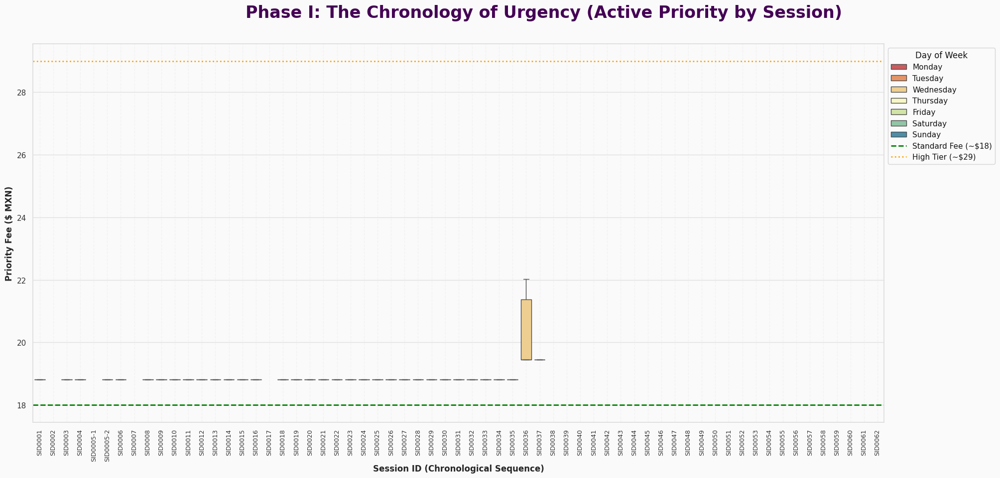

In [70]:
# ==============================================================================
# CELL 15.5: SESSION PRIORITY CHRONOLOGY (URGENCY BY SESSION)
# ==============================================================================
# Purpose: To track the frequency and price stability of Priority requests per session.
#          Identifies if specific shifts (e.g., Monday Morning) trigger high urgency.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Priority data...")
query = """
SELECT session_fk, offer_timestamp, priority_amount
FROM offers
WHERE priority_amount > 0 -- Only active priority
"""
df_sess_prio = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_prio['offer_timestamp'] = pd.to_datetime(df_sess_prio['offer_timestamp'])
df_sess_prio['Day_Name'] = df_sess_prio['offer_timestamp'].dt.day_name()

# Get ALL sessions to preserve chronological order
query_all = "SELECT DISTINCT session_fk, MIN(offer_timestamp) as start_time FROM offers GROUP BY session_fk ORDER BY start_time"
all_sessions = pd.read_sql(query_all, db_engine)
chronological_order = all_sessions['session_fk'].tolist()

# Apply Order
df_sess_prio['session_fk'] = pd.Categorical(df_sess_prio['session_fk'], categories=chronological_order, ordered=True)
df_sess_prio = df_sess_prio.sort_values('session_fk')

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Urgency (Active Priority by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
sns.boxplot(x='session_fk', y='priority_amount', data=df_sess_prio, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Priority Fee ($ MXN)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(18, color='green', linestyle='--', linewidth=2, label='Standard Fee (~$18)')
ax.axhline(29, color='orange', linestyle=':', linewidth=2, label='High Tier (~$29)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

⏳ Loading Reservation data...


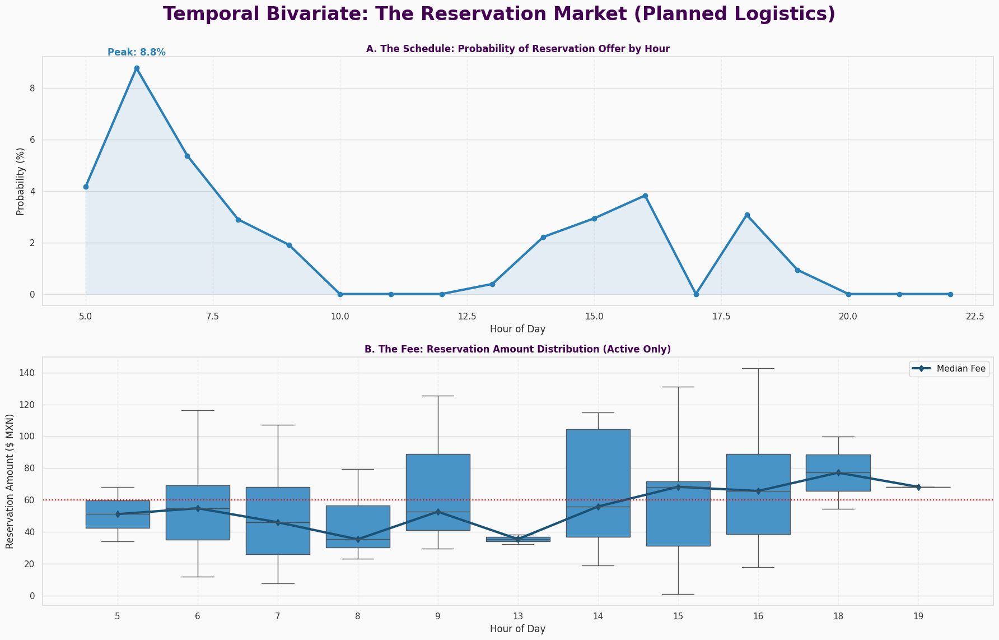


--- 🕵️‍♂️ RESERVATION INTEGRITY CHECK ---
Min Fee: $0.85 (Should not be ~0)
Median Fee: $53.10
Max Fee: $171.86
⚠️ WARNING: Found 4 reservations with Fee < $10. Potential OCR Error.


In [71]:
# ==============================================================================
# CELL 14: TEMPORAL BIVARIATE - RESERVATION DYNAMICS (PLANNED DEMAND)
# ==============================================================================
# Purpose: To audit the "Reservation Market".
#          1. When do they appear? (Target: Early AM).
#          2. How much is the Fee? (Target: Consistent High Value).
#          Validates data integrity (checking for OCR noise in reservation amounts).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Reservation data...")
query = """
SELECT offer_timestamp, is_reservation, reservation_amount
FROM v_offers_human
"""
df_res = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_res['offer_timestamp'] = pd.to_datetime(df_res['offer_timestamp'])
df_res['Hour'] = df_res['offer_timestamp'].dt.hour

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.4)
fig.suptitle('Temporal Bivariate: The Reservation Market (Planned Logistics)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: FREQUENCY (PROBABILITY) ---
# Reservations are rare, so we look at % of total offers
hourly_prob = df_res.groupby('Hour')['is_reservation'].mean() * 100

ax1 = axes[0]
ax1.plot(hourly_prob.index, hourly_prob.values, color='#2980b9', linewidth=3, marker='o', label='Reservation Probability')
ax1.fill_between(hourly_prob.index, hourly_prob.values, color='#2980b9', alpha=0.1)

ax1.set_title("A. The Schedule: Probability of Reservation Offer by Hour", fontweight='bold')
ax1.set_xlabel("Hour of Day")
ax1.set_ylabel("Probability (%)")
# Annotate Max
max_h = hourly_prob.idxmax()
max_v = hourly_prob.max()
ax1.text(max_h, max_v + 0.5, f"Peak: {max_v:.1f}%", ha='center', fontweight='bold', color='#2980b9')
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# --- PLOT B: MAGNITUDE (RESERVATION FEE) ---
# Filter Active Only
df_active = df_res[df_res['reservation_amount'] > 0]

# Check if we have data
if not df_active.empty:
    ax2 = axes[1]
    sns.boxplot(x='Hour', y='reservation_amount', data=df_active, ax=ax2,
                color='#3498db', showfliers=False)

    ax2.set_title("B. The Fee: Reservation Amount Distribution (Active Only)", fontweight='bold')
    ax2.set_xlabel("Hour of Day")
    ax2.set_ylabel("Reservation Amount ($ MXN)")
    ax2.grid(axis='x', linestyle='--', alpha=0.5)

    # Trendline
    median_val = df_active.groupby('Hour')['reservation_amount'].median()
    # Map x-axis
    hours_present = sorted(df_active['Hour'].unique())
    hour_map = {h: i for i, h in enumerate(hours_present)}
    x_vals = [hour_map[h] for h in median_val.index]

    ax2.plot(x_vals, median_val.values, color='#1a5276', linewidth=3, linestyle='-', marker='d', label='Median Fee')
    ax2.legend()

    # Sanity Check Line (Reservations usually have a base fee, e.g., $60)
    ax2.axhline(60, color='red', linestyle=':', label='Standard Fee Expectation (~$60)')

else:
    axes[1].text(0.5, 0.5, "No Active Reservation Amounts Found", ha='center', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. INTEGRITY CHECK TABLE
print("\n--- 🕵️‍♂️ RESERVATION INTEGRITY CHECK ---")
if not df_active.empty:
    stats = df_active['reservation_amount'].describe(percentiles=[0.1, 0.5, 0.9])
    print(f"Min Fee: ${stats['min']:.2f} (Should not be ~0)")
    print(f"Median Fee: ${stats['50%']:.2f}")
    print(f"Max Fee: ${stats['max']:.2f}")

    # Alert on Micro-Reservations (Potential OCR Errors)
    micro_res = len(df_active[df_active['reservation_amount'] < 10])
    if micro_res > 0:
        print(f"⚠️ WARNING: Found {micro_res} reservations with Fee < $10. Potential OCR Error.")
    else:
        print("✅ CLEAN: No micro-values detected. Data looks solid.")

⏳ Loading Weekly Reservation data...


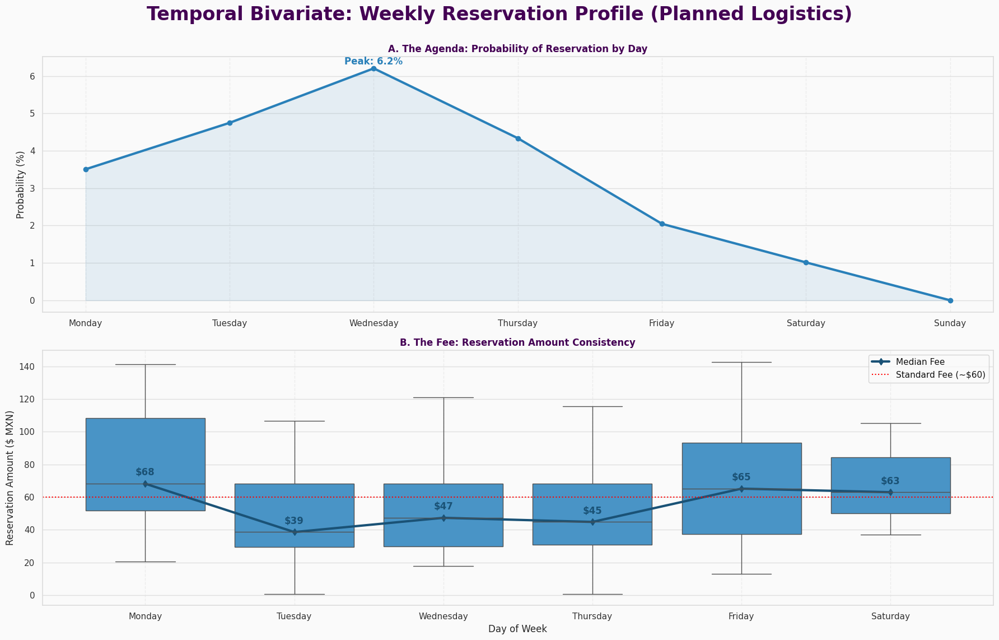

In [73]:
# ==============================================================================
# CELL 14.1: WEEKLY RESERVATION PROFILE (PLANNED DEMAND BY DAY)
# ==============================================================================
# Purpose: To analyze the weekly rhythm of scheduled trips.
#          Does the "Airport Run" (Monday) dominate? Or Weekend travel?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Reservation data...")
query = """
SELECT offer_timestamp, is_reservation, reservation_amount
FROM offers
"""
df_res_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_res_wk['offer_timestamp'] = pd.to_datetime(df_res_wk['offer_timestamp'])
df_res_wk['Day'] = df_res_wk['offer_timestamp'].dt.day_name()

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_res_wk['Day'] = pd.Categorical(df_res_wk['Day'], categories=day_order, ordered=True)

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Temporal Bivariate: Weekly Reservation Profile (Planned Logistics)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (FREQUENCY) ---
daily_prob = df_res_wk.groupby('Day')['is_reservation'].mean() * 100
res_color = '#2980b9'

ax1 = axes[0]
ax1.plot(daily_prob.index, daily_prob.values, color=res_color, linewidth=3, marker='o', label='Reservation Probability')
ax1.fill_between(daily_prob.index, daily_prob.values, color=res_color, alpha=0.1)

ax1.set_title("A. The Agenda: Probability of Reservation by Day", fontweight='bold')
ax1.set_ylabel("Probability (%)")
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peak
max_day = daily_prob.idxmax()
max_val = daily_prob.max()
ax1.text(max_day, max_val + 0.1, f"Peak: {max_val:.1f}%", ha='center', fontweight='bold', color=res_color)

# --- PLOT B: MAGNITUDE (FEE STABILITY) ---
# Filter Active Only
df_active = df_res_wk[df_res_wk['reservation_amount'] > 0]

if not df_active.empty:
    ax2 = axes[1]
    sns.boxplot(x='Day', y='reservation_amount', data=df_active, ax=ax2,
                color='#3498db', showfliers=False)

    ax2.set_title("B. The Fee: Reservation Amount Consistency", fontweight='bold')
    ax2.set_xlabel("Day of Week")
    ax2.set_ylabel("Reservation Amount ($ MXN)")
    ax2.grid(axis='x', linestyle='--', alpha=0.5)

    # Trendline
    median_val = df_active.groupby('Day')['reservation_amount'].median().reindex(day_order)
    ax2.plot(range(7), median_val.values, color='#1a5276', linewidth=3, linestyle='-', marker='d', label='Median Fee')

    # Annotate Medians
    for i, val in enumerate(median_val.values):
        if pd.notnull(val):
            ax2.text(i, val + 5, f"${val:.0f}", ha='center', fontweight='bold', color='#1a5276')

    ax2.axhline(60, color='red', linestyle=':', label='Standard Fee (~$60)')
    ax2.legend()
else:
    axes[1].text(0.5, 0.5, "No Active Reservation Amounts Found", ha='center')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Session-Level Reservation data...


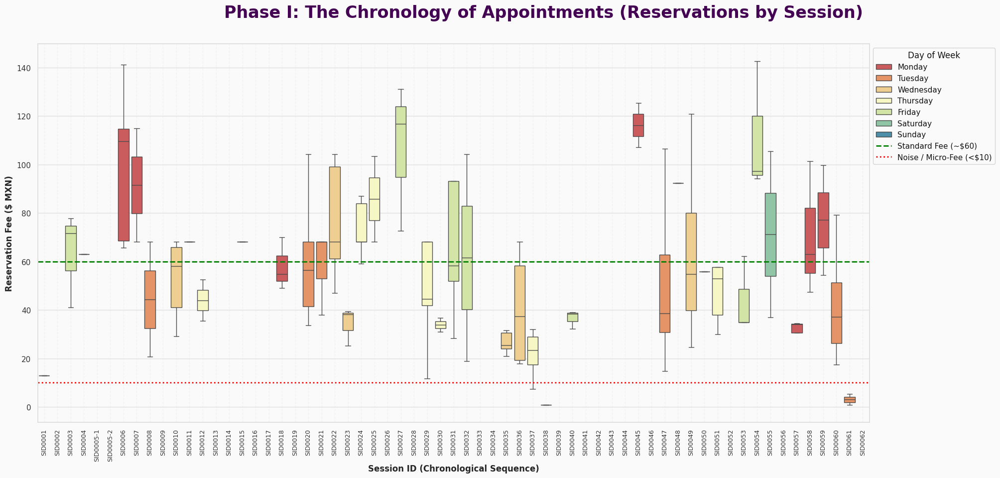

In [74]:
# ==============================================================================
# CELL 14.5: SESSION RESERVATION CHRONOLOGY (ACTIVE RESERVATIONS BY SESSION)
# ==============================================================================
# Purpose: To track the frequency and value of Scheduled Rides per session.
#          Identifies "Logistics Shifts" (e.g., Airport runs) vs organic shifts.
#          Expect sparsity: Reservations are rare events compared to Surge.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Reservation data...")
query = """
SELECT session_fk, offer_timestamp, reservation_amount
FROM offers
WHERE reservation_amount > 0 -- Only active reservations
"""
df_sess_res = pd.read_sql(query, db_engine)

# 3. ENGINEERING & SORTING
df_sess_res['offer_timestamp'] = pd.to_datetime(df_sess_res['offer_timestamp'])
df_sess_res['Day_Name'] = df_sess_res['offer_timestamp'].dt.day_name()

# Get ALL sessions to preserve chronological order
query_all = "SELECT DISTINCT session_fk, MIN(offer_timestamp) as start_time FROM offers GROUP BY session_fk ORDER BY start_time"
all_sessions = pd.read_sql(query_all, db_engine)
chronological_order = all_sessions['session_fk'].tolist()

# Apply Order
df_sess_res['session_fk'] = pd.Categorical(df_sess_res['session_fk'], categories=chronological_order, ordered=True)
df_sess_res = df_sess_res.sort_values('session_fk')

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(22, 10)) # Widescreen
fig.suptitle('Phase I: The Chronology of Appointments (Reservations by Session)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- THE PLOT ---
sns.boxplot(x='session_fk', y='reservation_amount', data=df_sess_res, ax=ax,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, showfliers=False)

ax.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax.set_ylabel("Reservation Fee ($ MXN)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=9)
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines
ax.axhline(60, color='green', linestyle='--', linewidth=2, label='Standard Fee (~$60)')
ax.axhline(10, color='red', linestyle=':', linewidth=2, label='Noise / Micro-Fee (<$10)')

# Legend Position
ax.legend(title='Day of Week', bbox_to_anchor=(1, 1), loc='upper left', frameon=True)

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

⏳ Loading Weekly Reservation Stability data...


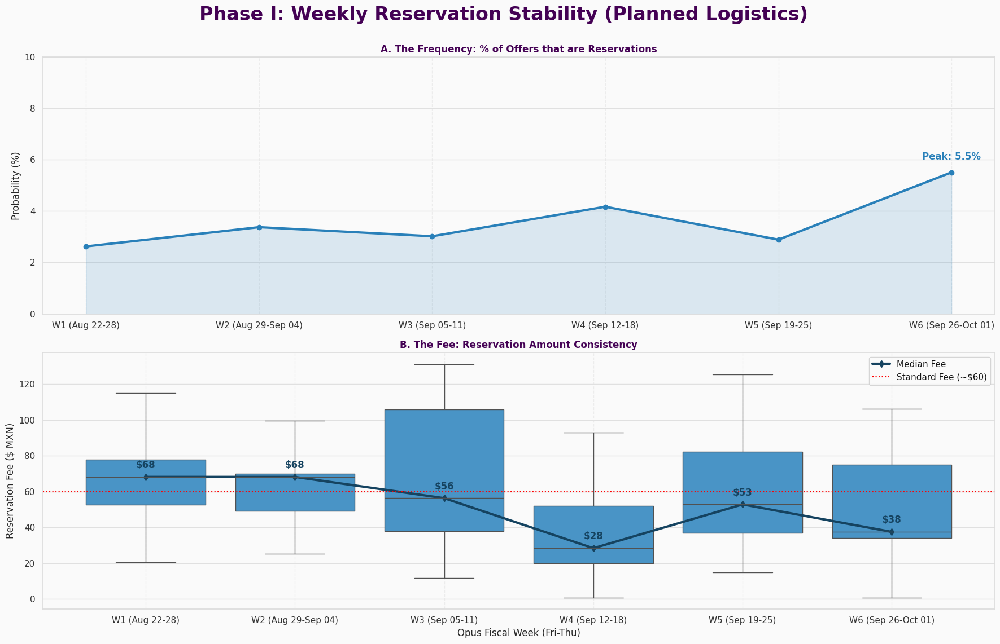


--- 📊 RESERVATION MARKET METRICS ---


,Total Offers,Res. Count,Probability,Median Fee ($),Max Fee ($)
Opus_Week,,,,,
W1 (Aug 22-28),952,25,2.6,68.23,171.86
W2 (Aug 29-Sep 04),859,29,3.4,68.23,104.36
W3 (Sep 05-11),364,11,3.0,56.36,131.23
W4 (Sep 12-18),599,25,4.2,28.39,104.36
W5 (Sep 19-25),1211,35,2.9,52.87,125.40
W6 (Sep 26-Oct 01),780,43,5.5,37.51,142.76


In [3]:
# ==============================================================================
# CELL 14.2: WEEKLY RESERVATION STABILITY (PLANNED DEMAND) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of "Reservation Offers" across Opus Weeks.
#          Did the volume of pre-booked rides fluctuate significantly?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Reservation Stability data...")
# Asegúrate de que 'db_engine' esté inicializado en tu notebook
query = """
SELECT offer_timestamp, is_reservation, reservation_amount
FROM offers
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date

# Canonical Opus Week Definition (Fri-Thu)
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# 4. PLOTTING CONFIGURATION
fig, axes = plt.subplots(2, 1, figsize=(18, 12))
plt.subplots_adjust(hspace=0.3)
fig.suptitle('Phase I: Weekly Reservation Stability (Planned Logistics)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: PROBABILITY (FREQUENCY) ---
weekly_prob = df_plot.groupby('Opus_Week', observed=False)['is_reservation'].mean() * 100
res_color = '#2980b9' # Azul para indicar "Calma/Planeación"

ax1 = axes[0]
ax1.plot(weekly_prob.index, weekly_prob.values, color=res_color, linewidth=3, marker='o', label='Reservation Probability')
ax1.fill_between(weekly_prob.index, weekly_prob.values, color=res_color, alpha=0.15)

ax1.set_title("A. The Frequency: % of Offers that are Reservations", fontweight='bold')
ax1.set_ylabel("Probability (%)")
ax1.set_ylim(0, 10) # Zoom in: Las reservaciones son raras (< 10%)
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Annotate Peak
max_wk = weekly_prob.idxmax()
max_val = weekly_prob.max()
ax1.text(max_wk, max_val + 0.5, f"Peak: {max_val:.1f}%", ha='center', fontweight='bold', color=res_color)

# --- PLOT B: MAGNITUDE (FEE STABILITY) ---
df_active = df_plot[df_plot['reservation_amount'] > 0]

if not df_active.empty:
    ax2 = axes[1]
    sns.boxplot(x='Opus_Week', y='reservation_amount', data=df_active, ax=ax2,
                color='#3498db', showfliers=False)

    ax2.set_title("B. The Fee: Reservation Amount Consistency", fontweight='bold')
    ax2.set_xlabel("Opus Fiscal Week (Fri-Thu)")
    ax2.set_ylabel("Reservation Fee ($ MXN)")
    ax2.grid(axis='x', linestyle='--', alpha=0.5)

    # Trendline
    medians = df_active.groupby('Opus_Week', observed=False)['reservation_amount'].median()
    ax2.plot(range(len(medians)), medians.values, color='#154360', linewidth=3, linestyle='-', marker='d', label='Median Fee')

    # Reference Line: El estándar de la industria en CDMX (~$60)
    ax2.axhline(60, color='red', linestyle=':', label='Standard Fee (~$60)')

    # Annotate Medians
    for i, val in enumerate(medians.values):
        if pd.notnull(val):
            ax2.text(i, val + 5, f"${val:.0f}", ha='center', fontweight='bold', color='#154360')
    
    ax2.legend(loc='upper right')
else:
    axes[1].text(0.5, 0.5, "No Active Reservation Fees Found", ha='center')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 RESERVATION MARKET METRICS ---")
# Agregación combinada
stats_df = df_plot.groupby('Opus_Week', observed=False)['is_reservation'].agg(['count', 'sum', 'mean'])
stats_df.columns = ['Total Offers', 'Res. Count', 'Probability']
stats_df['Probability'] = (stats_df['Probability'] * 100).round(1)

# Añadimos métricas de monto solo si hay activas
if not df_active.empty:
    fee_stats = df_active.groupby('Opus_Week', observed=False)['reservation_amount'].describe()[['50%', 'max']]
    fee_stats.columns = ['Median Fee ($)', 'Max Fee ($)']
    final_stats = pd.concat([stats_df, fee_stats], axis=1)
else:
    final_stats = stats_df

# CODESPACE READY: Usando el display interactivo nativo
display(final_stats)

⏳ Loading Operational Flags data from 'offers' table...


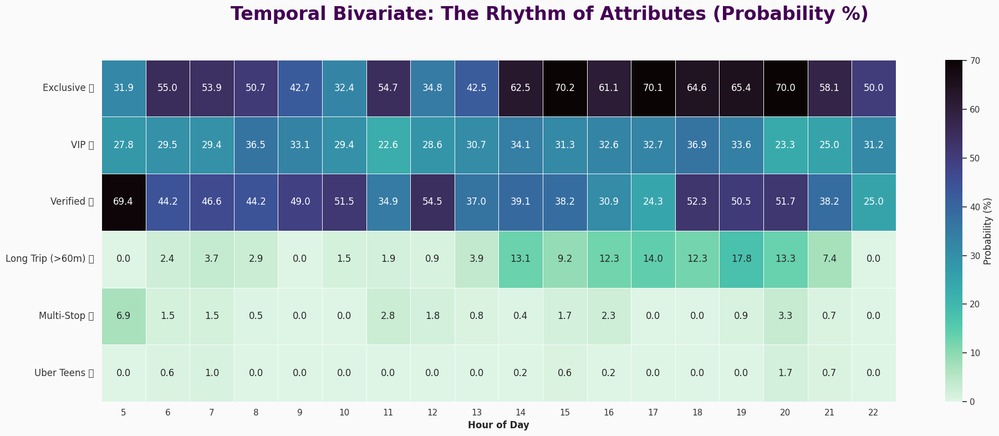

In [4]:
# ==============================================================================
# CELL 16 (REVISED): TEMPORAL BIVARIATE - OPERATIONAL FLAGS MATRIX (SOURCE: OFFERS)
# ==============================================================================
# Purpose: To audit the temporal correlation of non-monetary flags.
#          Source: Direct 'offers' table to ensure all flags are available.
#          Visualizes the Probability (%) of each flag by Hour.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA (DIRECT FROM SOURCE)
print("⏳ Loading Operational Flags data from 'offers' table...")
query = """
SELECT
    offer_timestamp,
    is_exclusive,
    is_vip,
    is_identity_verified,
    is_long_trip,
    is_multiple_destinations,
    is_teens
FROM offers
"""
df_flags = pd.read_sql(query, db_engine)

# 3. ENGINEERING
df_flags['offer_timestamp'] = pd.to_datetime(df_flags['offer_timestamp'])
df_flags['Hour'] = df_flags['offer_timestamp'].dt.hour

# Calculate Hourly Probability for each flag
# Group by Hour, take Mean of all columns, multiply by 100
hourly_probs = df_flags.groupby('Hour')[
    ['is_exclusive', 'is_vip', 'is_identity_verified',
     'is_long_trip', 'is_multiple_destinations', 'is_teens']
].mean() * 100

# Transpose for Heatmap (Rows = Flags, Cols = Hours)
heatmap_data = hourly_probs.T

# Clean Names for Display
heatmap_data.index = [
    'Exclusive 💎', 'VIP ⭐', 'Verified 🛡️',
    'Long Trip (>60m) 🛣️', 'Multi-Stop 🛑', 'Uber Teens 🎒'
]

# 4. PLOTTING
fig, ax = plt.subplots(figsize=(20, 8))
fig.suptitle('Temporal Bivariate: The Rhythm of Attributes (Probability %)', fontsize=24, color='#440154', weight='bold', y=0.98)

# We use 'mako_r' (Reverse Mako) so high probability is dark/intense
sns.heatmap(heatmap_data, cmap="mako_r", linewidths=0.5, linecolor='#FAFAFA', ax=ax,
            annot=True, fmt='.1f', cbar_kws={'label': 'Probability (%)'})

ax.set_xlabel("Hour of Day", fontweight='bold')
ax.set_ylabel("")
ax.tick_params(axis='y', rotation=0, labelsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Weekly Flags data...


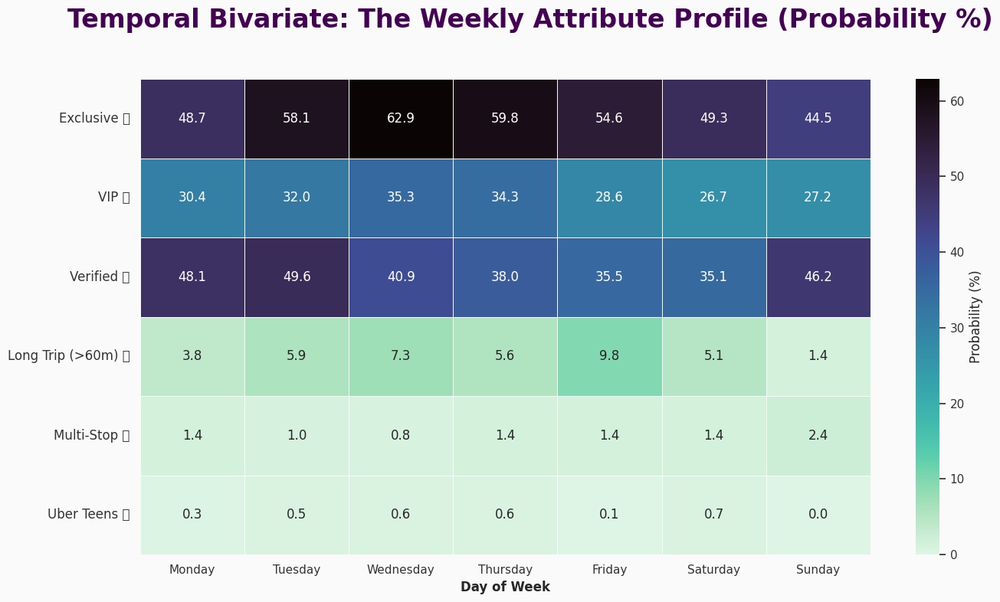

In [5]:
# ==============================================================================
# CELL 16.1: WEEKLY ATTRIBUTE MATRIX (FLAGS BY DAY)
# ==============================================================================
# Purpose: To audit the weekly correlation of operational flags.
#          Does the "Long Trip" probability spike on Sundays?
#          Are weekends less "Verified"?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Flags data...")
query = """
SELECT
    offer_timestamp,
    is_exclusive,
    is_vip,
    is_identity_verified,
    is_long_trip,
    is_multiple_destinations,
    is_teens
FROM offers
"""
df_flags_wk = pd.read_sql(query, db_engine)

# 3. ENGINEERING
df_flags_wk['offer_timestamp'] = pd.to_datetime(df_flags_wk['offer_timestamp'])
df_flags_wk['Day'] = df_flags_wk['offer_timestamp'].dt.day_name()

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Calculate Weekly Probability
daily_probs = df_flags_wk.groupby('Day')[
    ['is_exclusive', 'is_vip', 'is_identity_verified',
     'is_long_trip', 'is_multiple_destinations', 'is_teens']
].mean() * 100

# Reindex to ensure logical order
daily_probs = daily_probs.reindex(day_order)

# Transpose for Heatmap
heatmap_wk = daily_probs.T

# Clean Names
heatmap_wk.index = [
    'Exclusive 💎', 'VIP ⭐', 'Verified 🛡️',
    'Long Trip (>60m) 🛣️', 'Multi-Stop 🛑', 'Uber Teens 🎒'
]

# 4. PLOTTING
fig, ax = plt.subplots(figsize=(14, 8))
fig.suptitle('Temporal Bivariate: The Weekly Attribute Profile (Probability %)', fontsize=24, color='#440154', weight='bold', y=0.98)

# Using 'mako_r' again for consistency
sns.heatmap(heatmap_wk, cmap="mako_r", linewidths=0.5, linecolor='#FAFAFA', ax=ax,
            annot=True, fmt='.1f', cbar_kws={'label': 'Probability (%)'})

ax.set_xlabel("Day of Week", fontweight='bold')
ax.set_ylabel("")
ax.tick_params(axis='y', rotation=0, labelsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Weekly Attribute Stability data...


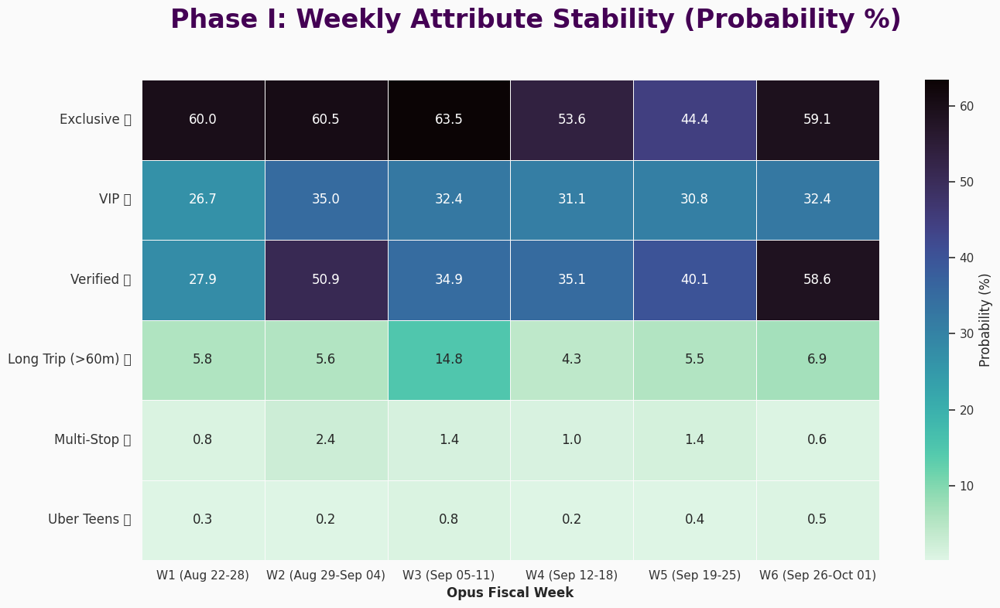

In [7]:
# ==============================================================================
# CELL 16.2: WEEKLY ATTRIBUTE STABILITY (FLAGS WALK-FORWARD)
# ==============================================================================
# Purpose: To audit the stability of operational flags across Opus Weeks.
#          Did the "Mix of Riders" change over the 6-week campaign?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Attribute Stability data...")
query = """
SELECT
    offer_timestamp,
    is_exclusive,
    is_vip,
    is_identity_verified,
    is_long_trip,
    is_multiple_destinations,
    is_teens
FROM offers
"""
df_flags_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_flags_wk['offer_timestamp'] = pd.to_datetime(df_flags_wk['offer_timestamp'])
df_flags_wk['Date'] = df_flags_wk['offer_timestamp'].dt.date

# Canonical Opus Week Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_flags_wk['Opus_Week'] = df_flags_wk['Date'].apply(get_opus_week)
df_plot = df_flags_wk[df_flags_wk['Opus_Week'] != 'Out of Scope']

# Calculate Weekly Probability
weekly_probs = df_plot.groupby('Opus_Week')[
    ['is_exclusive', 'is_vip', 'is_identity_verified',
     'is_long_trip', 'is_multiple_destinations', 'is_teens']
].mean() * 100

# Transpose for Heatmap
heatmap_wk = weekly_probs.T

# Clean Names
heatmap_wk.index = [
    'Exclusive 💎', 'VIP ⭐', 'Verified 🛡️',
    'Long Trip (>60m) 🛣️', 'Multi-Stop 🛑', 'Uber Teens 🎒'
]

# 4. PLOTTING
fig, ax = plt.subplots(figsize=(14, 8))
fig.suptitle('Phase I: Weekly Attribute Stability (Probability %)', fontsize=24, color='#440154', weight='bold', y=0.98)

# Using 'mako_r' for consistency
sns.heatmap(heatmap_wk, cmap="mako_r", linewidths=0.5, linecolor='#FAFAFA', ax=ax,
            annot=True, fmt='.1f', cbar_kws={'label': 'Probability (%)'})

ax.set_xlabel("Opus Fiscal Week", fontweight='bold')
ax.set_ylabel("")
ax.tick_params(axis='y', rotation=0, labelsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [9]:
# ==============================================================================
# CELL: THE HOURLY SCORECARD (TABLE VIEW) - CODESPACE READY
# ==============================================================================
# Purpose: To see the raw numbers behind the "Decision Clock".
#          Validates the relationship between Volume and Acceptance per Hour.
# ==============================================================================

import pandas as pd

print("⏳ Generating Hourly Scorecard...")

query = """
SELECT
    strftime('%H', offer_timestamp) as hour,
    COUNT(*) as total_offers,
    SUM(CASE WHEN str_action = 'accepted' THEN 1 ELSE 0 END) as accepted_count
FROM v_offers_human
GROUP BY hour
ORDER BY hour ASC
"""

df_scorecard = pd.read_sql(query, db_engine)

# 1. FEATURE ENGINEERING: Acceptance Rate
df_scorecard['acceptance_rate_pct'] = (df_scorecard['accepted_count'] / df_scorecard['total_offers']) * 100
df_scorecard['acceptance_rate_pct'] = df_scorecard['acceptance_rate_pct'].round(2)

# 2. DISPLAY LOGIC
print("\n--- 📊 HOURLY SELECTIVITY SCORECARD ---")
# CODESPACE READY: El visor de VS Code te permite ordenar por 'acceptance_rate_pct'
# para identificar instantáneamente tus horas de mayor "filtro".
display(df_scorecard)

⏳ Generating Hourly Scorecard...

--- 📊 HOURLY SELECTIVITY SCORECARD ---


,hour,total_offers,accepted_count,acceptance_rate_pct
0,05,72,1,1.39
1,06,797,72,9.03
2,07,595,44,7.39
3,08,414,36,8.70
4,09,157,13,8.28
5,10,68,9,13.24
6,11,106,6,5.66
7,12,112,10,8.93
8,13,511,23,4.50
9,14,496,40,8.06


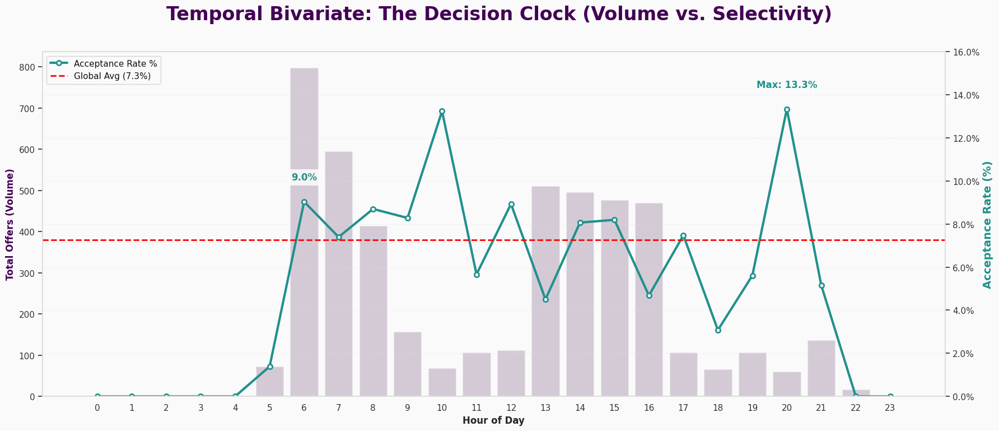

In [10]:
# ==============================================================================
# CELL 17 (FINAL v4): THE DECISION CLOCK (DIRECT TABLE PLOT)
# ==============================================================================
# Purpose: Visualizes Volume vs. Selectivity using the aggregated Scorecard data.
#          Guarantees 1:1 alignment between the table numbers and the visual line.
#          Eliminates any "shifting" or "dropout" artifacts.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. RE-CALCULATE AGGREGATION (To ensure self-contained cell)
# This matches exactly the logic of the Scorecard Table you just approved.
query = """
SELECT
    CAST(strftime('%H', offer_timestamp) AS INTEGER) as hour,
    COUNT(*) as total_offers,
    SUM(CASE WHEN str_action = 'accepted' THEN 1 ELSE 0 END) as accepted_count
FROM v_offers_human
GROUP BY hour
"""
df_plot = pd.read_sql(query, db_engine)

# Calculate Rate
df_plot['acceptance_rate_pct'] = (df_plot['accepted_count'] / df_plot['total_offers']) * 100

# Reindex to ensure 0-23 continuity (fill gaps with 0)
full_day = pd.DataFrame({'hour': range(24)})
df_plot = full_day.merge(df_plot, on='hour', how='left').fillna(0)

# Global Avg
global_ar = df_plot['accepted_count'].sum() / df_plot['total_offers'].sum() * 100

# 3. PLOTTING
fig, ax1 = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: The Decision Clock (Volume vs. Selectivity)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- AXIS 1: VOLUME (BARS) ---
# Purple Bars for Offers
sns.barplot(x='hour', y='total_offers', data=df_plot, ax=ax1,
            color='#440154', alpha=0.2, edgecolor=None)

ax1.set_xlabel("Hour of Day", fontweight='bold')
ax1.set_ylabel("Total Offers (Volume)", color='#440154', fontweight='bold', fontsize=12)
ax1.grid(False)

# --- AXIS 2: ACCEPTANCE RATE (LINE) ---
ax2 = ax1.twinx()
color_rate = '#21918c' # Teal

# Plot Line
ax2.plot(df_plot['hour'], df_plot['acceptance_rate_pct'],
         color=color_rate, linewidth=3,
         marker='o', markersize=6, markerfacecolor='white', markeredgewidth=2,
         label='Acceptance Rate %')

# Global Avg Reference
ax2.axhline(global_ar, color='red', linestyle='--', linewidth=2, label=f'Global Avg ({global_ar:.1f}%)')

ax2.set_ylabel("Acceptance Rate (%)", color=color_rate, fontweight='bold', fontsize=14)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax2.set_ylim(0, max(df_plot['acceptance_rate_pct']) * 1.2)
ax2.grid(axis='y', linestyle='--', alpha=0.3)

# Annotate Specific Points (Example: The Morning Rush 6 AM)
# We explicitly pull the value for 6 AM to show it matches the table
val_6am = df_plot.loc[df_plot['hour'] == 6, 'acceptance_rate_pct'].values[0]
ax2.text(6, val_6am + 1, f"{val_6am:.1f}%", ha='center', fontweight='bold', color=color_rate,
         bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

# Annotate Max
max_ar = df_plot['acceptance_rate_pct'].max()
max_hr = df_plot['acceptance_rate_pct'].idxmax()
ax2.text(max_hr, max_ar + 1, f"Max: {max_ar:.1f}%", ha='center', fontweight='bold', color=color_rate)

ax2.legend(loc='upper left')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

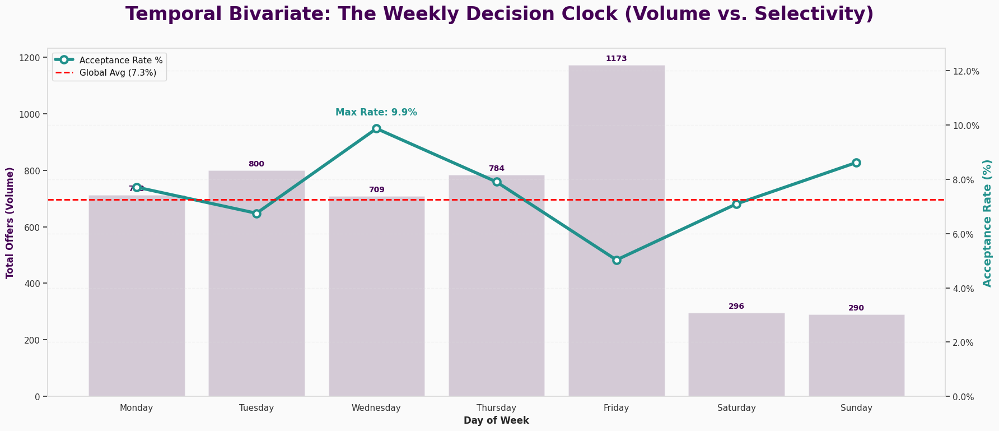

In [11]:
# ==============================================================================
# CELL 17.1 (REVISED v2): WEEKLY DECISION CLOCK (WITH DATA LABELS)
# ==============================================================================
# Purpose: To analyze Agent Selectivity across the week.
#          Includes EXPLICIT DATA LABELS for Total Volume to verify integrity.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA (UNIVERSAL TIMELINE)
query = """
SELECT
    o.offer_id,
    oa.offer_action_description,
    COALESCE(o.offer_timestamp, te.event_timestamp) as true_timestamp
FROM offers o
LEFT JOIN offer_action oa ON o.offer_action_fk = oa.offer_action_id
LEFT JOIN trip_events te ON o.offer_id = te.offer_id_fk AND te.event_types_id_fk = 2
"""
df_week = pd.read_sql(query, db_engine)

# 3. ENGINEERING
df_week = df_week.dropna(subset=['true_timestamp'])
df_week['true_timestamp'] = pd.to_datetime(df_week['true_timestamp'])
df_week['Day'] = df_week['true_timestamp'].dt.day_name()
df_week['is_accepted'] = df_week['offer_action_description'].apply(lambda x: 1 if x == 'accepted' else 0)

# 4. AGGREGATE BY DAY
daily_stats = df_week.groupby('Day').agg(
    Total_Offers=('is_accepted', 'count'),
    Accepted_Count=('is_accepted', 'sum'),
    Acceptance_Rate=('is_accepted', 'mean')
)
daily_stats['Acceptance_Rate_Pct'] = daily_stats['Acceptance_Rate'] * 100

# Logical Sorting
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_stats = daily_stats.reindex(day_order)

# Global Average
global_ar = df_week['is_accepted'].mean() * 100

# 5. PLOTTING CONFIGURATION
fig, ax1 = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: The Weekly Decision Clock (Volume vs. Selectivity)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- AXIS 1: VOLUME (BARS) ---
sns.barplot(x=daily_stats.index, y=daily_stats['Total_Offers'], ax=ax1,
            color='#440154', alpha=0.2, edgecolor=None)

ax1.set_xlabel("Day of Week", fontweight='bold')
ax1.set_ylabel("Total Offers (Volume)", color='#440154', fontweight='bold', fontsize=12)
ax1.grid(False)

# *** DATA LABELS (THE VOBO CHECK) ***
for i, p in enumerate(ax1.patches):
    height = p.get_height()
    if height > 0:
        ax1.text(p.get_x() + p.get_width()/2., height + 10,
                 f'{int(height)}',
                 ha='center', va='bottom', fontsize=10, fontweight='bold', color='#440154')

# --- AXIS 2: ACCEPTANCE RATE (LINE) ---
ax2 = ax1.twinx()
color_rate = '#21918c'

ax2.plot(daily_stats.index, daily_stats['Acceptance_Rate_Pct'],
         color=color_rate, linewidth=4,
         marker='o', markersize=9, markerfacecolor='white', markeredgewidth=3,
         label='Acceptance Rate %')

ax2.axhline(global_ar, color='red', linestyle='--', linewidth=2, label=f'Global Avg ({global_ar:.1f}%)')

ax2.set_ylabel("Acceptance Rate (%)", color=color_rate, fontweight='bold', fontsize=14)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax2.set_ylim(0, max(daily_stats['Acceptance_Rate_Pct']) * 1.3) # More headroom for labels
ax2.grid(axis='y', linestyle='--', alpha=0.3)

# Annotate Peak Rate
max_ar = daily_stats['Acceptance_Rate_Pct'].max()
max_day = daily_stats['Acceptance_Rate_Pct'].idxmax()
day_idx = day_order.index(max_day)
ax2.text(day_idx, max_ar + 0.5, f"Max Rate: {max_ar:.1f}%", ha='center', fontweight='bold', color=color_rate)

ax2.legend(loc='upper left')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Session-Level Decision data...


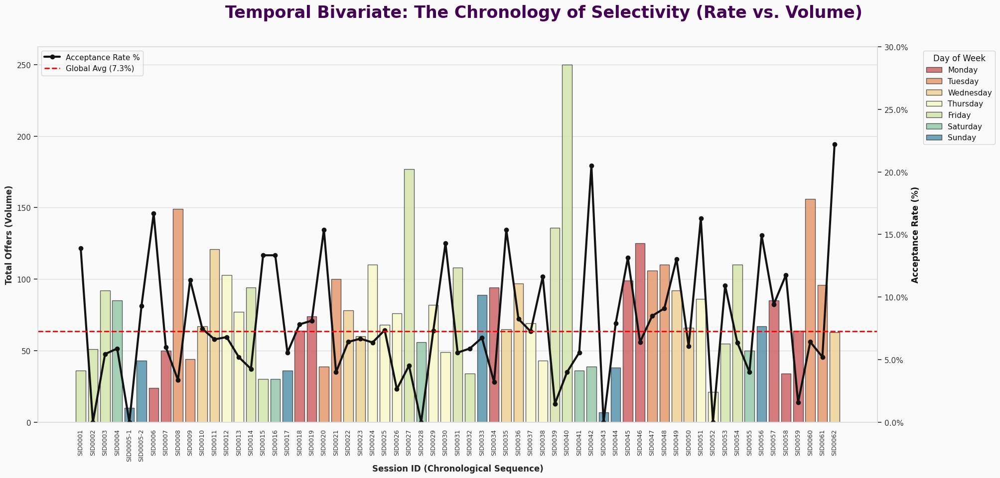

In [12]:
# ==============================================================================
# CELL 17.5 (REVISED v2): SESSION DECISION CLOCK (SYNTAX FIXED)
# ==============================================================================
# Purpose: To visualize the Agent's behavior per session.
#          Bars = Volume (Opportunity). Line = Acceptance Rate (Strategy).
#          Fixes Matplotlib 'grid_b' deprecation error.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Session-Level Decision data...")
query = """
SELECT session_fk, offer_timestamp, str_action
FROM v_offers_human
"""
df_sess_dec = pd.read_sql(query, db_engine)

# 3. ENGINEERING
df_sess_dec['offer_timestamp'] = pd.to_datetime(df_sess_dec['offer_timestamp'])
df_sess_dec['Day_Name'] = df_sess_dec['offer_timestamp'].dt.day_name()
df_sess_dec['is_accepted'] = df_sess_dec['str_action'].apply(lambda x: 1 if x == 'accepted' else 0)

# Chronological Ordering
session_starts = df_sess_dec.groupby('session_fk')['offer_timestamp'].min().sort_values()
chronological_order = session_starts.index.tolist()

# Aggregate per Session
sess_stats = df_sess_dec.groupby(['session_fk', 'Day_Name'], observed=True).agg(
    Total_Offers=('is_accepted', 'count'),
    Acceptance_Rate=('is_accepted', 'mean')
).reset_index()

# Apply Order
sess_stats['session_fk'] = pd.Categorical(sess_stats['session_fk'], categories=chronological_order, ordered=True)
sess_stats = sess_stats.sort_values('session_fk')
sess_stats['Acceptance_Rate_Pct'] = sess_stats['Acceptance_Rate'] * 100

# Logical Day Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Global Average
global_ar = df_sess_dec['is_accepted'].mean() * 100

# 4. PLOTTING CONFIGURATION
fig, ax1 = plt.subplots(figsize=(22, 10))
fig.suptitle('Temporal Bivariate: The Chronology of Selectivity (Rate vs. Volume)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- AXIS 1: VOLUME (BARS - COLORED BY DAY) ---
sns.barplot(x='session_fk', y='Total_Offers', data=sess_stats, ax=ax1,
            hue='Day_Name', hue_order=day_order, palette='Spectral',
            dodge=False, edgecolor='#333333', alpha=0.8)

ax1.set_xlabel("Session ID (Chronological Sequence)", fontweight='bold', fontsize=12)
ax1.set_ylabel("Total Offers (Volume)", fontweight='bold', fontsize=12)
ax1.tick_params(axis='x', rotation=90, labelsize=9)

# FIXED: Modern syntax to disable vertical grid lines
ax1.xaxis.grid(False)

ax1.legend(title='Day of Week', bbox_to_anchor=(1.05, 1), loc='upper left')

# --- AXIS 2: ACCEPTANCE RATE (LINE) ---
ax2 = ax1.twinx()
# Use a dark, contrasting line to cut through the colors
ax2.plot(range(len(sess_stats)), sess_stats['Acceptance_Rate_Pct'],
         color='#121212', linewidth=3, marker='o', markersize=6, label='Acceptance Rate %')

ax2.axhline(global_ar, color='red', linestyle='--', linewidth=2, label=f'Global Avg ({global_ar:.1f}%)')

ax2.set_ylabel("Acceptance Rate (%)", color='#121212', fontweight='bold', fontsize=12)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter())
ax2.set_ylim(0, 30) # Zoom in on the relevant range (0-30%)
ax2.grid(False) # Disable secondary grid to avoid clutter

# Legend for Line
ax2.legend(loc='upper left')

plt.tight_layout(rect=[0, 0, 0.92, 0.95])
plt.show()

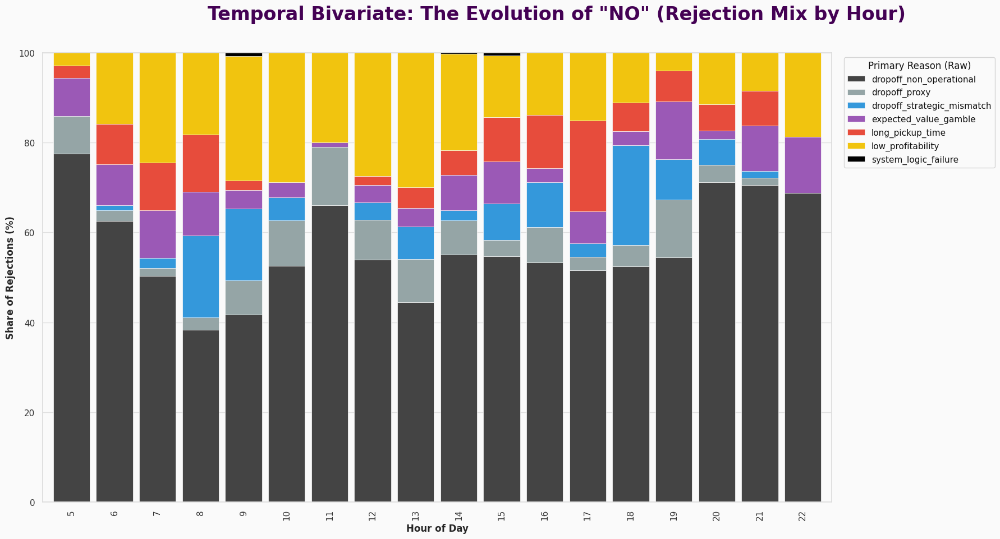

In [13]:
# ==============================================================================
# CELL 18 (FINAL v5): THE REJECTION CLOCK (RAW LABELS & FIXED SYNTAX)
# ==============================================================================
# Purpose: To visualize the changing COMPOSITION of rejection reasons.
#          Uses raw snake_case labels from the DB (as designed).
#          Fixes Matplotlib 'grid_b' error.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
query = """
SELECT offer_timestamp, str_reason
FROM v_offers_human
WHERE str_reason IS NOT NULL
"""
df_rejection = pd.read_sql(query, db_engine)

# 3. ENGINEERING
df_rejection['offer_timestamp'] = pd.to_datetime(df_rejection['offer_timestamp'])
df_rejection['Hour'] = df_rejection['offer_timestamp'].dt.hour

# Prepare Matrix (Cross-Tabulation) using RAW labels
ct = pd.crosstab(df_rejection['Hour'], df_rejection['str_reason'], normalize='index') * 100

# 4. PLOTTING
fig, ax = plt.subplots(figsize=(20, 10))
fig.suptitle('Temporal Bivariate: The Evolution of "NO" (Rejection Mix by Hour)', fontsize=24, color='#440154', weight='bold', y=0.96)

# Custom Colors mapped to RAW snake_case
color_map = {
    'dropoff_non_operational': '#444444',    # Dark Grey (Structural)
    'low_profitability': '#f1c40f',          # Yellow (Money)
    'long_pickup_time': '#e74c3c',           # Red (Pain)
    'expected_value_gamble': '#9b59b6',      # Purple (Choice)
    'dropoff_strategic_mismatch': '#3498db', # Blue (Vector)
    'dropoff_proxy': '#95a5a6',              # Light Grey
    'system_logic_failure': '#000000'        # Black
}

# Ensure colors match the column order
stack_colors = [color_map.get(col, '#cccccc') for col in ct.columns]

# The 100% Stacked Bar Plot
ct.plot(kind='bar', stacked=True, ax=ax, color=stack_colors, width=0.85, edgecolor='#FAFAFA', linewidth=0.5)

ax.set_xlabel("Hour of Day", fontweight='bold', fontsize=12)
ax.set_ylabel("Share of Rejections (%)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 100)

# FIXED: Modern syntax to disable vertical grid lines
ax.xaxis.grid(False)

# Legend
ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left', title="Primary Reason (Raw)", fontsize=11)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()

⏳ Loading Weekly Rejection data...


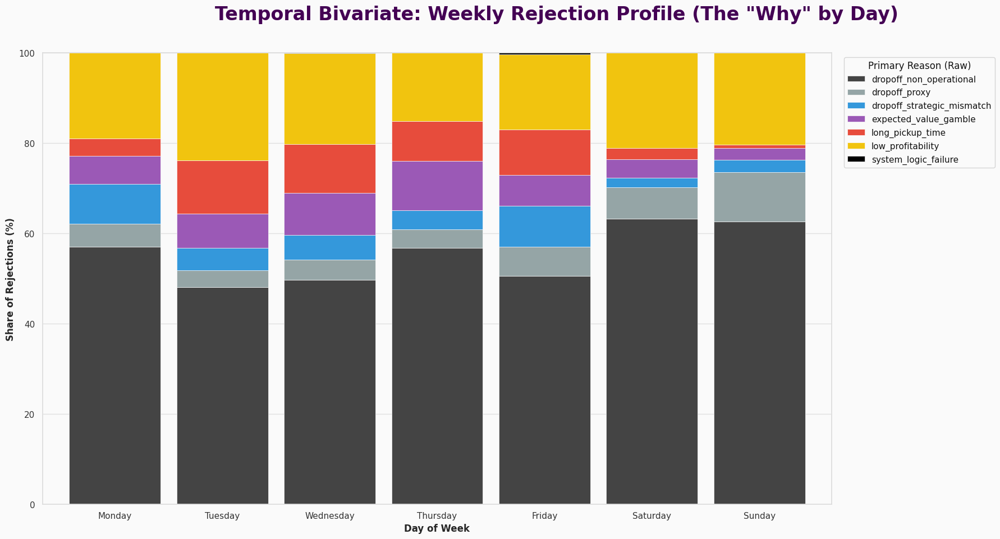

In [14]:
# ==============================================================================
# CELL 18.1: THE WEEKLY REJECTION PROFILE (REASON MIX BY DAY)
# ==============================================================================
# Purpose: To analyze how the rejection logic shifts across the week.
#          Does traffic (Friday) force more logistics rejections?
#          Does Sunday allow for more gambling?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Rejection data...")
query = """
SELECT offer_timestamp, str_reason
FROM v_offers_human
WHERE str_reason IS NOT NULL
"""
df_rej_wk = pd.read_sql(query, db_engine)

# 3. ENGINEERING
df_rej_wk['offer_timestamp'] = pd.to_datetime(df_rej_wk['offer_timestamp'])
df_rej_wk['Day'] = df_rej_wk['offer_timestamp'].dt.day_name()

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_rej_wk['Day'] = pd.Categorical(df_rej_wk['Day'], categories=day_order, ordered=True)

# Prepare Matrix (Cross-Tabulation)
ct = pd.crosstab(df_rej_wk['Day'], df_rej_wk['str_reason'], normalize='index') * 100

# 4. PLOTTING
fig, ax = plt.subplots(figsize=(20, 10))
fig.suptitle('Temporal Bivariate: Weekly Rejection Profile (The "Why" by Day)', fontsize=24, color='#440154', weight='bold', y=0.96)

# Reuse Consistent Color Map
color_map = {
    'dropoff_non_operational': '#444444',    # Dark Grey
    'low_profitability': '#f1c40f',          # Yellow
    'long_pickup_time': '#e74c3c',           # Red
    'expected_value_gamble': '#9b59b6',      # Purple
    'dropoff_strategic_mismatch': '#3498db', # Blue
    'dropoff_proxy': '#95a5a6',              # Light Grey
    'system_logic_failure': '#000000'        # Black
}
stack_colors = [color_map.get(col, '#cccccc') for col in ct.columns]

# The 100% Stacked Bar Plot
ct.plot(kind='bar', stacked=True, ax=ax, color=stack_colors, width=0.85, edgecolor='#FAFAFA', linewidth=0.5)

ax.set_xlabel("Day of Week", fontweight='bold', fontsize=12)
ax.set_ylabel("Share of Rejections (%)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 100)
ax.xaxis.grid(False) # Vertical grid off
ax.tick_params(axis='x', rotation=0)

# Legend
ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left', title="Primary Reason (Raw)", fontsize=11)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()

⏳ Loading Weekly Rejection Stability data...


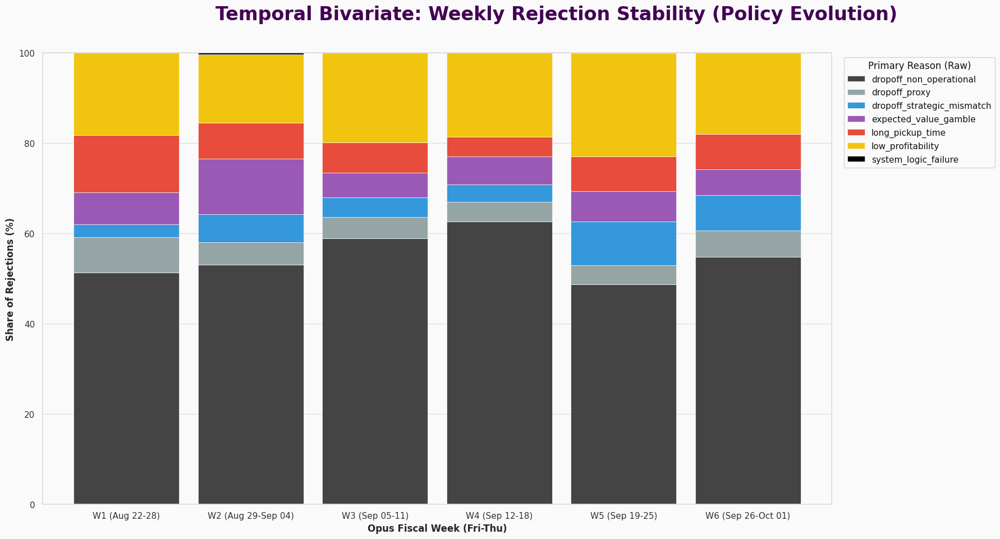

In [15]:
# ==============================================================================
# CELL 18.2: WEEKLY REJECTION STABILITY (POLICY WALK-FORWARD)
# ==============================================================================
# Purpose: To audit the stability of Rejection Logic across Opus Weeks.
#          Did the "Reason for No" change as the Agent matured or market shifted?
#          (e.g. Did Traffic rejection increase in September?)
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Rejection Stability data...")
query = """
SELECT offer_timestamp, str_reason
FROM v_offers_human
WHERE str_reason IS NOT NULL
"""
df_rej_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_rej_wk['offer_timestamp'] = pd.to_datetime(df_rej_wk['offer_timestamp'])
df_rej_wk['Date'] = df_rej_wk['offer_timestamp'].dt.date

# Canonical Opus Week Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_rej_wk['Opus_Week'] = df_rej_wk['Date'].apply(get_opus_week)
df_plot = df_rej_wk[df_rej_wk['Opus_Week'] != 'Out of Scope'].sort_values('Date')

# Prepare Matrix (Cross-Tabulation)
ct = pd.crosstab(df_plot['Opus_Week'], df_plot['str_reason'], normalize='index') * 100

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(20, 10))
fig.suptitle('Temporal Bivariate: Weekly Rejection Stability (Policy Evolution)', fontsize=24, color='#440154', weight='bold', y=0.96)

# Reuse Consistent Color Map
color_map = {
    'dropoff_non_operational': '#444444',    # Dark Grey
    'low_profitability': '#f1c40f',          # Yellow
    'long_pickup_time': '#e74c3c',           # Red
    'expected_value_gamble': '#9b59b6',      # Purple
    'dropoff_strategic_mismatch': '#3498db', # Blue
    'dropoff_proxy': '#95a5a6',              # Light Grey
    'system_logic_failure': '#000000'        # Black
}
stack_colors = [color_map.get(col, '#cccccc') for col in ct.columns]

# The 100% Stacked Bar Plot
ct.plot(kind='bar', stacked=True, ax=ax, color=stack_colors, width=0.85, edgecolor='#FAFAFA', linewidth=0.5)

ax.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold', fontsize=12)
ax.set_ylabel("Share of Rejections (%)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 100)
ax.xaxis.grid(False)
ax.tick_params(axis='x', rotation=0)

# Legend
ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left', title="Primary Reason (Raw)", fontsize=11)

plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()

⏳ Loading Traffic Chronology data...


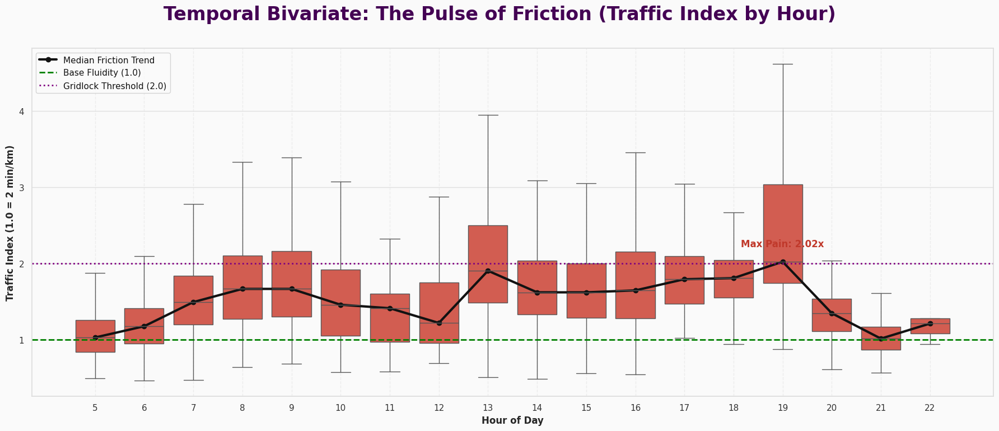

In [16]:
# ==============================================================================
# CELL 19: TEMPORAL BIVARIATE - THE TRAFFIC PULSE (HOURLY FRICTION)
# ==============================================================================
# Purpose: To map the congestion cycles of CDMX.
#          Visualizes the Traffic Index (Vexation) by Hour of Day.
#          Confirming the "Curve of Death" (Morning vs. Evening Rush).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Traffic Chronology data...")
query = """
SELECT offer_timestamp, traffic_index_base_120
FROM v_offers_human
WHERE traffic_index_base_120 IS NOT NULL
"""
df_traffic = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_traffic['offer_timestamp'] = pd.to_datetime(df_traffic['offer_timestamp'])
df_traffic['Hour'] = df_traffic['offer_timestamp'].dt.hour

# Filter extreme GPS errors (> 6.0) for visual clarity
df_plot = df_traffic[df_traffic['traffic_index_base_120'] < 6]

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Temporal Bivariate: The Pulse of Friction (Traffic Index by Hour)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT (DISTRIBUTION) ---
# Using "Reds" to signify Friction/Pain
sns.boxplot(x='Hour', y='traffic_index_base_120', data=df_plot, ax=ax,
            color='#e74c3c', showfliers=False)

ax.set_xlabel("Hour of Day", fontweight='bold')
ax.set_ylabel("Traffic Index (1.0 = 2 min/km)", fontweight='bold')
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
hourly_medians = df_plot.groupby('Hour')['traffic_index_base_120'].median()
# Align x-axis
hours_present = sorted(df_plot['Hour'].unique())
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in hourly_medians.index]

ax.plot(x_vals, hourly_medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Friction Trend')

# Reference Lines
ax.axhline(1.0, color='green', linestyle='--', linewidth=2, label='Base Fluidity (1.0)')
ax.axhline(2.0, color='purple', linestyle=':', linewidth=2, label='Gridlock Threshold (2.0)')

# Annotate Peaks
max_med = hourly_medians.max()
max_hour = hourly_medians.idxmax()
if max_hour in hour_map:
    ax.text(hour_map[max_hour], max_med + 0.2, f"Max Pain: {max_med:.2f}x", ha='center', fontweight='bold', color='#c0392b')

ax.legend(loc='upper left')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Weekly Traffic data...


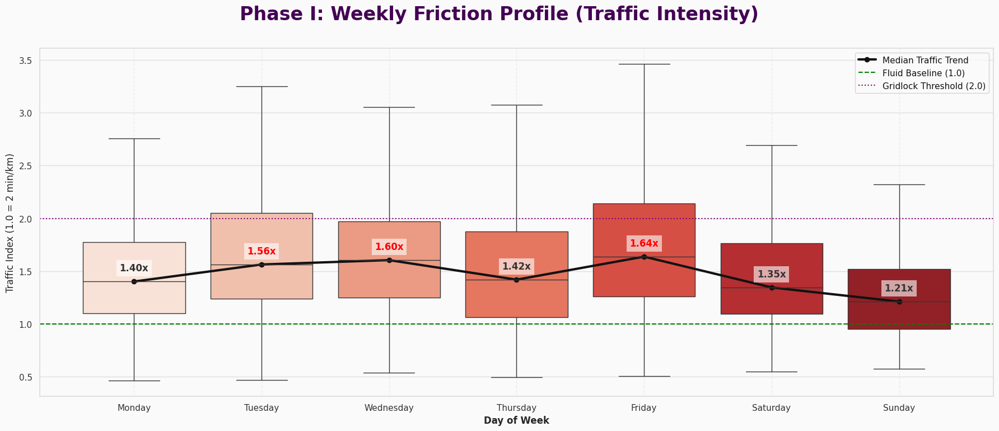


--- 📊 TRAFFIC INTENSITY METRICS ---


,Count,Mean,StdDev,Median,Max
Day,,,,,
Monday,707.0,1.473589,0.526408,1.402439,5.000000
Tuesday,798.0,1.704156,0.680561,1.563563,4.687500
Wednesday,707.0,1.694491,0.644347,1.604938,5.000000
Thursday,780.0,1.609338,0.764497,1.419868,5.192308
Friday,1162.0,1.798911,0.769801,1.637931,5.952381
Saturday,295.0,1.486895,0.555526,1.346154,3.750000
Sunday,289.0,1.298453,0.455138,1.212121,3.750000


In [18]:
# ==============================================================================
# CELL 19.2: TEMPORAL BIVARIATE - WEEKLY FRICTION PROFILE (TRAFFIC BY DAY)
# ==============================================================================
# Purpose: To compare congestion levels across the week.
#          Is Friday statistically worse than Monday? Is Sunday truly free flow?
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Traffic data...")
query = """
SELECT offer_timestamp, traffic_index_base_120
FROM v_offers_human
WHERE traffic_index_base_120 IS NOT NULL
"""
df_traf_wk = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_traf_wk['offer_timestamp'] = pd.to_datetime(df_traf_wk['offer_timestamp'])
df_traf_wk['Day'] = df_traf_wk['offer_timestamp'].dt.day_name()

# Filter outliers for visual clarity (Index < 6)
# Un índice de 6 significaría 12 minutos por kilómetro... un estacionamiento, básicamente.
df_plot = df_traf_wk[df_traf_wk['traffic_index_base_120'] < 6].copy()

# Logical Order for CDMX Weekly Analysis
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_plot['Day'] = pd.Categorical(df_plot['Day'], categories=day_order, ordered=True)

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Phase I: Weekly Friction Profile (Traffic Intensity)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT (DISTRIBUTION) ---
# Usamos "Reds" para representar la Fricción/Congestión
sns.boxplot(x='Day', y='traffic_index_base_120', data=df_plot, ax=ax,
            palette="Reds", showfliers=False, hue='Day', legend=False)

ax.set_xlabel("Day of Week", fontweight='bold')
ax.set_ylabel("Traffic Index (1.0 = 2 min/km)")
ax.grid(axis='x', linestyle='--', alpha=0.5)

# --- TRENDLINE (MEDIAN) ---
daily_medians = df_plot.groupby('Day', observed=False)['traffic_index_base_120'].median()
ax.plot(range(7), daily_medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Traffic Trend')

# Reference Lines: La "física" del tráfico en CDMX
ax.axhline(1.0, color='green', linestyle='--', label='Fluid Baseline (1.0)')
ax.axhline(2.0, color='purple', linestyle=':', label='Gridlock Threshold (2.0)')

# Annotate Medians
for i, val in enumerate(daily_medians.values):
    color = 'red' if val >= 1.5 else '#333333'
    ax.text(i, val + 0.1, f"{val:.2f}x", ha='center', fontweight='bold', color=color,
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))

ax.legend(loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 TRAFFIC INTENSITY METRICS ---")
# CODESPACE READY: Reemplazamos DataTable por display nativo con formateo
stats_summary = df_plot.groupby('Day', observed=False)['traffic_index_base_120'].describe()[['count', 'mean', 'std', '50%', 'max']]
stats_summary.columns = ['Count', 'Mean', 'StdDev', 'Median', 'Max']

display(stats_summary)

In [20]:
# ==============================================================================
# CELL 19.3: TRAFFIC VARIANCE AUDIT (IQR & EXTREMES) - CODESPACE READY
# ==============================================================================
# Purpose: To breakdown traffic intensity beyond the median.
#          Calculates IQR (Interquartile Range) to measure volatility per day.
#          Identifies the "Pain Threshold" (Q3) for each day of the week.
# ==============================================================================

import pandas as pd
import numpy as np

# 1. LOAD DATA
query = """
SELECT offer_timestamp, traffic_index_base_120
FROM v_offers_human
WHERE traffic_index_base_120 IS NOT NULL
"""
df_traf = pd.read_sql(query, db_engine)

# 2. ENGINEERING
df_traf['offer_timestamp'] = pd.to_datetime(df_traf['offer_timestamp'])
df_traf['Day'] = df_traf['offer_timestamp'].dt.day_name()

# Logical Order para CDMX
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_traf['Day'] = pd.Categorical(df_traf['Day'], categories=day_order, ordered=True)

# Filter GPS errors (Filtro de seguridad para el análisis)
df_traf = df_traf[df_traf['traffic_index_base_120'] < 6].copy()

# 3. CALCULATE DETAILED STATISTICS
# Usamos observed=False para mantener la estructura de la semana aunque falten datos
stats = df_traf.groupby('Day', observed=False)['traffic_index_base_120'].describe(
    percentiles=[0.25, 0.50, 0.75, 0.90, 0.95]
)

# 4. CALCULATE IQR & RISK
stats['IQR'] = stats['75%'] - stats['25%']
stats['Risk_Score'] = stats['95%'] # El nivel del peor 5% de los casos (Caos puro)

# 5. FORMATTING FOR DISPLAY
display_cols = ['count', 'mean', '25%', '50%', '75%', 'IQR', '95%', 'max']
final_table = stats[display_cols].round(2).copy()

# Rename para el Scorecard Final
final_table.columns = [
    'Count', 'Mean',
    'Q1 (Best Case)', 'Median', 'Q3 (Pain Threshold)',
    'IQR (Volatility)',
    '95% (Chaos Line)', 'Max (Peak)'
]

print("--- 📊 THE TRAFFIC RISK TABLE (IQR Analysis) ---")

# CODESPACE READY: El visor de VS Code renderiza esto con scroll horizontal y 
# capacidades de ordenamiento automático.
display(final_table)

--- 📊 THE TRAFFIC RISK TABLE (IQR Analysis) ---


,Count,Mean,Q1 (Best Case),Median,Q3 (Pain Threshold),IQR (Volatility),95% (Chaos Line),Max (Peak)
Day,,,,,,,,
Monday,707.0,1.47,1.10,1.40,1.78,0.68,2.36,5.00
Tuesday,798.0,1.70,1.24,1.56,2.05,0.81,2.95,4.69
Wednesday,707.0,1.69,1.25,1.60,1.97,0.72,2.89,5.00
Thursday,780.0,1.61,1.07,1.42,1.88,0.81,3.18,5.19
Friday,1162.0,1.80,1.26,1.64,2.14,0.88,3.28,5.95
Saturday,295.0,1.49,1.10,1.35,1.77,0.67,2.52,3.75
Sunday,289.0,1.30,0.95,1.21,1.52,0.57,2.14,3.75


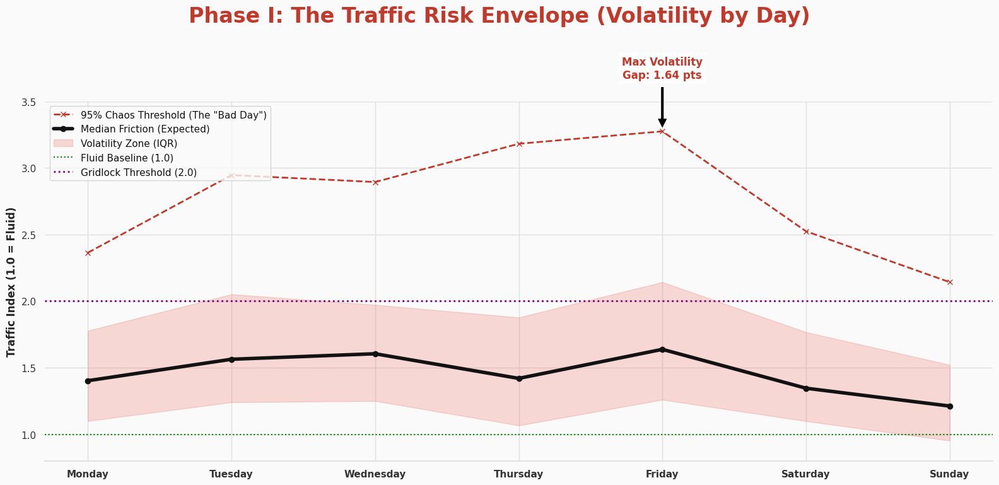

In [21]:
# ==============================================================================
# CELL 19.4 (REVISED): VISUALIZING TRAFFIC RISK (THE CHAOS ENVELOPE)
# ==============================================================================
# Purpose: To visualize the volatility of traffic by Day.
#          Shows Median (Expected), IQR (Normal Range), and 95% (Catastrophe).
#          Fixes KeyError by recalculating stats locally with correct column names.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD & PREPARE DATA
query = """
SELECT offer_timestamp, traffic_index_base_120
FROM v_offers_human
WHERE traffic_index_base_120 IS NOT NULL
"""
df_traf = pd.read_sql(query, db_engine)
df_traf['offer_timestamp'] = pd.to_datetime(df_traf['offer_timestamp'])
df_traf['Day'] = df_traf['offer_timestamp'].dt.day_name()
df_traf = df_traf[df_traf['traffic_index_base_120'] < 6]

# 3. CALCULATE STATS (LOCALLY)
stats = df_traf.groupby('Day')['traffic_index_base_120'].describe(percentiles=[0.25, 0.50, 0.75, 0.95])

# Logical Sort
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
stats = stats.reindex(day_order)
x_vals = range(len(stats))

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(16, 8))
fig.suptitle('Phase I: The Traffic Risk Envelope (Volatility by Day)', fontsize=24, color='#c0392b', weight='bold', y=0.96)

# --- LAYER 1: THE CATASTROPHE LINE (95%) ---
# Using raw column name '95%'
ax.plot(x_vals, stats['95%'], color='#c0392b', linestyle='--', linewidth=2, marker='x', label='95% Chaos Threshold (The "Bad Day")')

# --- LAYER 2: THE MEDIAN TREND ---
# Using raw column name '50%'
ax.plot(x_vals, stats['50%'], color='#121212', linewidth=4, marker='o', label='Median Friction (Expected)')

# --- LAYER 3: THE VOLATILITY BAND (IQR) ---
# Using raw column names '25%' and '75%'
ax.fill_between(x_vals, stats['25%'], stats['75%'],
                color='#e74c3c', alpha=0.2, label='Volatility Zone (IQR)')

# 5. AESTHETICS
ax.set_xticks(x_vals)
ax.set_xticklabels(stats.index, fontweight='bold', fontsize=11)
ax.set_ylabel("Traffic Index (1.0 = Fluid)", fontweight='bold')
ax.set_ylim(0.8, 3.5)

# Reference Lines
ax.axhline(1.0, color='green', linestyle=':', label='Fluid Baseline (1.0)')
ax.axhline(2.0, color='purple', linestyle=':', linewidth=2, label='Gridlock Threshold (2.0)')

# Annotate the Friday Gap (Volatility)
fri_idx = day_order.index('Friday')
fri_max = stats.loc['Friday', '95%']
fri_med = stats.loc['Friday', '50%']
gap = fri_max - fri_med

ax.annotate(f'Max Volatility\nGap: {gap:.2f} pts',
            xy=(fri_idx, fri_max), xytext=(fri_idx, fri_max + 0.4),
            arrowprops=dict(facecolor='black', shrink=0.05),
            ha='center', fontweight='bold', color='#c0392b',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

ax.legend(loc='upper left')
sns.despine(left=True, bottom=False)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

⏳ Loading Traffic Matrix data...


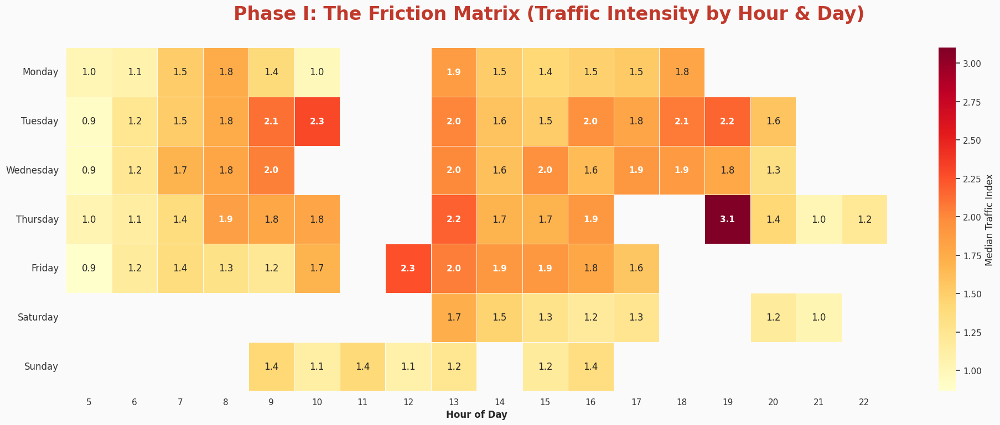

In [22]:
# ==============================================================================
# CELL 19.1: TEMPORAL BIVARIATE - THE TRAFFIC HEATMAP (DAY x HOUR)
# ==============================================================================
# Purpose: To visualize the congestion intensity across the entire week.
#          Identifies the "Red Zones" where the Traffic Index spikes.
#          Metric: Median Traffic Index (1.0 = Fluid, >2.0 = Gridlock).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="white")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Traffic Matrix data...")
query = """
SELECT offer_timestamp, traffic_index_base_120
FROM v_offers_human
WHERE traffic_index_base_120 IS NOT NULL
"""
df_traf = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING
df_traf['offer_timestamp'] = pd.to_datetime(df_traf['offer_timestamp'])
df_traf['Day'] = df_traf['offer_timestamp'].dt.day_name()
df_traf['Hour'] = df_traf['offer_timestamp'].dt.hour

# Clean extreme outliers
df_traf = df_traf[df_traf['traffic_index_base_120'] < 6]

# Logical Order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. PREPARE MATRIX
# Pivot: Index=Day, Columns=Hour, Values=Median Traffic Index
pivot_traffic = df_traf.groupby(['Day', 'Hour'])['traffic_index_base_120'].median().unstack()
pivot_traffic = pivot_traffic.reindex(day_order)

# 5. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(20, 8))
fig.suptitle('Phase I: The Friction Matrix (Traffic Intensity by Hour & Day)', fontsize=24, color='#c0392b', weight='bold', y=0.96)

# Heatmap
# cmap='YlOrRd': Yellow (1.0) -> Orange -> Red (High Friction) -> Dark Red (Gridlock)
sns.heatmap(pivot_traffic, cmap="YlOrRd", linewidths=0.5, linecolor='#FAFAFA', ax=ax,
            annot=True, fmt='.1f', cbar_kws={'label': 'Median Traffic Index'})

ax.set_xlabel("Hour of Day", fontweight='bold')
ax.set_ylabel("")
ax.tick_params(axis='y', rotation=0, labelsize=12)

# Highlight the "Danger Zone" (Values > 1.8)
# We can iterate through the text annotations created by sns.heatmap
for text in ax.texts:
    try:
        val = float(text.get_text())
        if val > 1.8:
            text.set_weight('bold')
            text.set_color('white') # White text on dark red background
            text.set_fontsize(11)
    except ValueError:
        pass

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [24]:
# ==============================================================================
# CELL: FORENSIC AUDIT - FRIDAY EVENING GAPS - CODESPACE READY
# ==============================================================================
# Purpose: To investigate why Friday evening (17:00+) has gaps in the Traffic Map.
#          Is it lack of data (Offline) or just low volume?
# ==============================================================================

import pandas as pd

print("🕵️‍♂️ AUDITING FRIDAY EVENING VOLUME (14:00 - 23:59)...\n")

query = """
SELECT
    strftime('%H', offer_timestamp) as hour,
    COUNT(*) as total_offers,
    ROUND(AVG(traffic_index_base_120), 2) as avg_traffic
FROM v_offers_human
WHERE day_of_week = 'Friday'
  AND CAST(strftime('%H', offer_timestamp) AS INTEGER) BETWEEN 14 AND 23
GROUP BY hour
ORDER BY hour ASC
"""

df_audit_fri = pd.read_sql(query, db_engine)

# 1. VISUAL INSPECTION
print("--- 📊 FRIDAY HOURLY STATS ---")

# CODESPACE READY: Usamos styler para identificar visualmente los "valles" de volumen
display(
    df_audit_fri.style.background_gradient(subset=['total_offers'], cmap='YlGn')
    .highlight_min(subset=['total_offers'], color='#ff7675')
    .format({"avg_traffic": "{:.2f}"})
)

# 2. LOGICAL CHECK
if not df_audit_fri.empty:
    min_vol_hour = df_audit_fri.loc[df_audit_fri['total_offers'].idxmin(), 'hour']
    min_vol_val = df_audit_fri['total_offers'].min()
    print(f"\n💡 Insight: El punto más bajo es a las {min_vol_hour}:00 con solo {min_vol_val} ofertas.")
    if min_vol_val < 5:
        print("⚠️ Advertencia: Volumen críticamente bajo. El 'gap' es estadístico por falta de muestras.")
    else:
        print("✅ Volumen suficiente: El 'gap' visual podría ser por outliers filtrados en celdas anteriores.")

🕵️‍♂️ AUDITING FRIDAY EVENING VOLUME (14:00 - 23:59)...

--- 📊 FRIDAY HOURLY STATS ---


,hour,total_offers,avg_traffic
0,14,107,2.05
1,15,115,2.08
2,16,206,1.97
3,17,53,1.72



💡 Insight: El punto más bajo es a las 17:00 con solo 53 ofertas.
✅ Volumen suficiente: El 'gap' visual podría ser por outliers filtrados en celdas anteriores.


⏳ Loading Weekly Traffic Stability data...


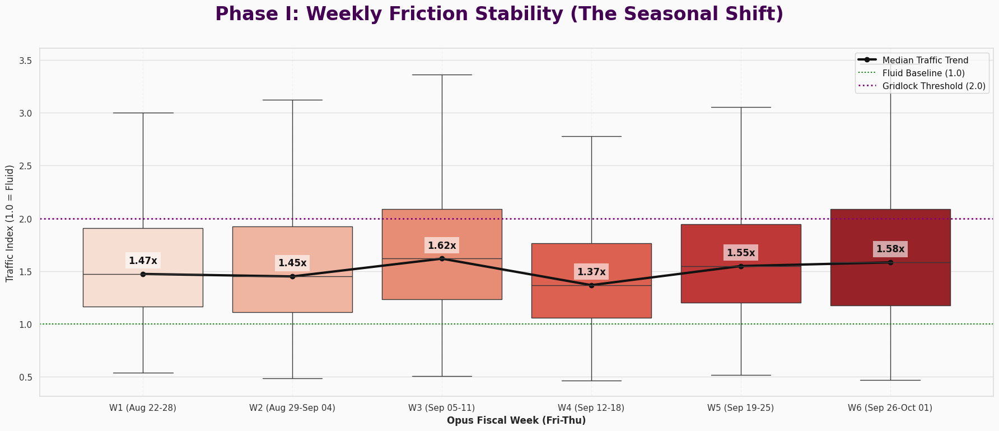


--- 📊 TRAFFIC SEASONALITY METRICS ---


,Count,Mean,StdDev,Median,Max
Opus_Week,,,,,
W1 (Aug 22-28),936.0,1.639420,0.713314,1.473930,5.000000
W2 (Aug 29-Sep 04),856.0,1.589284,0.677372,1.450444,5.384615
W3 (Sep 05-11),364.0,1.723372,0.670248,1.618750,4.423077
W4 (Sep 12-18),597.0,1.498773,0.613060,1.368159,5.000000
W5 (Sep 19-25),1206.0,1.653947,0.647836,1.548810,5.192308
W6 (Sep 26-Oct 01),779.0,1.729904,0.771629,1.583333,5.952381


In [26]:
# ==============================================================================
# CELL 19.6: WEEKLY FRICTION STABILITY (TRAFFIC WALK-FORWARD) - CODESPACE READY
# ==============================================================================
# Purpose: To audit the stability of Traffic Intensity across Opus Weeks.
#          Specifically looking for the "Back to School" shock (W2).
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Weekly Traffic Stability data...")
query = """
SELECT offer_timestamp, traffic_index_base_120
FROM v_offers_human
WHERE traffic_index_base_120 IS NOT NULL
"""
df_weekly = pd.read_sql(query, db_engine)

# 3. FEATURE ENGINEERING: OPUS WEEKS
df_weekly['offer_timestamp'] = pd.to_datetime(df_weekly['offer_timestamp'])
df_weekly['Date'] = df_weekly['offer_timestamp'].dt.date

# Canonical Opus Week Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22-28)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Aug 29-Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 05-11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 12-18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 19-25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Sep 26-Oct 01)'
    return 'Out of Scope'

df_weekly['Opus_Week'] = df_weekly['Date'].apply(get_opus_week)
df_plot = df_weekly[df_weekly['Opus_Week'] != 'Out of Scope'].sort_values('Date').copy()

# Filter outliers (GPS errors > 6.0)
df_plot = df_plot[df_plot['traffic_index_base_120'] < 6]

# 4. PLOTTING CONFIGURATION
fig, ax = plt.subplots(figsize=(18, 8))
fig.suptitle('Phase I: Weekly Friction Stability (The Seasonal Shift)', fontsize=24, color='#440154', weight='bold', y=0.96)

# --- BOXPLOT ---
# Usamos 'Reds' para mantener la consistencia visual del "Costo de Tiempo"
sns.boxplot(x='Opus_Week', y='traffic_index_base_120', data=df_plot, ax=ax,
            palette="Reds", showfliers=False, hue='Opus_Week', legend=False)

# --- TRENDLINE ---
medians = df_plot.groupby('Opus_Week', observed=False)['traffic_index_base_120'].median()
ax.plot(range(len(medians)), medians.values, color='#121212', linewidth=3, linestyle='-', marker='o', label='Median Traffic Trend')

ax.set_xlabel("Opus Fiscal Week (Fri-Thu)", fontweight='bold')
ax.set_ylabel("Traffic Index (1.0 = Fluid)")
ax.grid(axis='x', linestyle='--', alpha=0.3)

# Reference Lines: La "Física" de la ciudad
ax.axhline(1.0, color='green', linestyle=':', label='Fluid Baseline (1.0)')
ax.axhline(2.0, color='purple', linestyle=':', linewidth=2, label='Gridlock Threshold (2.0)')

# Annotate Medians
for i, (idx, val) in enumerate(medians.items()):
    # Resaltamos visualmente si hay un salto significativo en W2
    color = 'red' if i == 1 and val > medians.iloc[0] else '#121212'
    ax.text(i, val + 0.1, f"{val:.2f}x", ha='center', fontweight='bold', color=color,
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))

ax.legend(loc='upper right')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# 5. STABILITY TABLE
print("\n--- 📊 TRAFFIC SEASONALITY METRICS ---")
# CODESPACE READY: Reemplazamos DataTable por display nativo de Pandas
stats_summary = df_plot.groupby('Opus_Week', observed=False)['traffic_index_base_120'].describe()[['count', 'mean', 'std', '50%', 'max']]
stats_summary.columns = ['Count', 'Mean', 'StdDev', 'Median', 'Max']

display(stats_summary)

In [27]:
# ==============================================================================
# CELL SPECIAL: 3D TRAFFIC TOPOGRAPHY (ANIMATED BY WEEK)
# ==============================================================================
# Purpose: To visualize Traffic Friction as a 3D Terrain.
#          X=Hour, Y=Day, Z=Traffic Index.
#          Animation Slider = Opus Week (To see the evolution of congestion).
#          WARNING: 3D plots prioritize patterns over precision.
# ==============================================================================

import plotly.express as px
import pandas as pd

# 1. LOAD DATA
print("⏳ Loading 3D Traffic Model...")
query = """
SELECT offer_timestamp, traffic_index_base_120
FROM v_offers_human
WHERE traffic_index_base_120 IS NOT NULL
"""
df_3d = pd.read_sql(query, db_engine)

# 2. ENGINEERING
df_3d['offer_timestamp'] = pd.to_datetime(df_3d['offer_timestamp'])
df_3d['Date'] = df_3d['offer_timestamp'].dt.date
df_3d['Day'] = df_3d['offer_timestamp'].dt.day_name()
df_3d['Hour'] = df_3d['offer_timestamp'].dt.hour

# Canonical Opus Week Definition
def get_opus_week(d):
    d = str(d)
    if '2025-08-22' <= d <= '2025-08-28': return 'W1 (Aug 22)'
    if '2025-08-29' <= d <= '2025-09-04': return 'W2 (Sep 04)'
    if '2025-09-05' <= d <= '2025-09-11': return 'W3 (Sep 11)'
    if '2025-09-12' <= d <= '2025-09-18': return 'W4 (Sep 18)'
    if '2025-09-19' <= d <= '2025-09-25': return 'W5 (Sep 25)'
    if '2025-09-26' <= d <= '2025-10-01': return 'W6 (Oct 01)'
    return 'Out'

df_3d['Opus_Week'] = df_3d['Date'].apply(get_opus_week)
df_3d = df_3d[df_3d['Opus_Week'] != 'Out']

# Filter extreme outliers for Z-Axis stability
df_3d = df_3d[df_3d['traffic_index_base_120'] < 5]

# Sort for animation
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df_3d['Day'] = pd.Categorical(df_3d['Day'], categories=day_order, ordered=True)
df_3d = df_3d.sort_values(['Opus_Week', 'Day', 'Hour'])

# 3. PLOTTING (3D SCATTER)
fig = px.scatter_3d(
    df_3d,
    x='Hour',
    y='Day',
    z='traffic_index_base_120',
    animation_frame='Opus_Week', # The Time Travel Slider
    color='traffic_index_base_120',
    color_continuous_scale='portland', # Red=High, Blue=Low
    range_z=[0.8, 4.0], # Fix Z axis so mountains grow, not scale
    opacity=0.7,
    title="<b>Phase I: The Topography of Friction (3D Traffic Evolution)</b>",
    height=800
)

# 4. AESTHETICS
fig.update_layout(
    scene = dict(
        xaxis_title='Hour of Day',
        yaxis_title='Day of Week',
        zaxis_title='Traffic Index (Pain)',
        xaxis = dict(tickmode = 'linear', dtick = 2),
    ),
    margin={"r":0,"t":40,"l":0,"b":0}
)

# Slow down animation
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

fig.show()

⏳ Loading 3D Traffic Model...


⏳ Loading Market Pulse data...


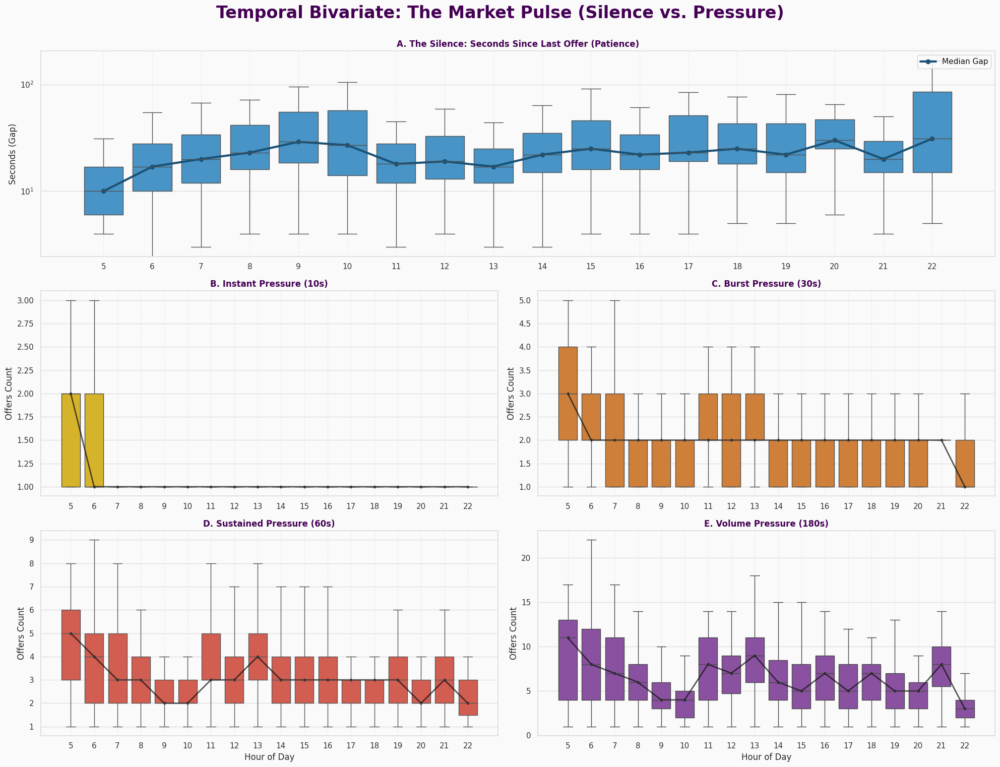

In [28]:
# ==============================================================================
# CELL 20 (FINAL v3): THE MARKET PULSE (FIXED ALIGNMENT)
# ==============================================================================
# Purpose: To visualize the rhythm of the market across all time windows.
#          Fixes ValueError by matching trendline X-axis to available data.
# ==============================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. APPLY "OPUS LAB" THEME
sns.set_theme(style="whitegrid")
opus_light_params = {
    'figure.facecolor': '#FAFAFA',
    'axes.facecolor': '#FAFAFA',
    'text.color': '#121212',
    'xtick.color': '#333333',
    'ytick.color': '#333333',
    'axes.edgecolor': '#DDDDDD',
    'grid.color': '#E0E0E0',
    'font.family': 'sans-serif'
}
plt.rcParams.update(opus_light_params)

# 2. LOAD DATA
print("⏳ Loading Market Pulse data...")
query = """
SELECT
    o.offer_timestamp,
    ef.time_since_last_offer,
    ef.offer_density_10sec,
    ef.offer_density_30sec,
    ef.offer_density_60sec,
    ef.offer_density_180sec
FROM engineered_features ef
JOIN offers o ON ef.offer_id_fk = o.offer_id
WHERE ef.time_since_last_offer IS NOT NULL
"""
df_pulse = pd.read_sql(query, db_engine)

# 3. ENGINEERING
df_pulse['offer_timestamp'] = pd.to_datetime(df_pulse['offer_timestamp'])
df_pulse['Hour'] = df_pulse['offer_timestamp'].dt.hour

# Filter huge gaps (> 1 hour)
df_pulse = df_pulse[df_pulse['time_since_last_offer'] < 3600]

# 4. PLOTTING CONFIGURATION
fig = plt.figure(figsize=(20, 16))
gs = fig.add_gridspec(3, 2)
fig.suptitle('Temporal Bivariate: The Market Pulse (Silence vs. Pressure)', fontsize=24, color='#440154', weight='bold', y=0.95)

# --- PLOT A: THE SILENCE (Top Row) ---
ax1 = fig.add_subplot(gs[0, :])
sns.boxplot(x='Hour', y='time_since_last_offer', data=df_pulse, ax=ax1,
            color='#3498db', showfliers=False)

ax1.set_title("A. The Silence: Seconds Since Last Offer (Patience)", fontweight='bold')
ax1.set_xlabel("")
ax1.set_ylabel("Seconds (Gap)")
ax1.set_yscale("log")
ax1.grid(axis='x', linestyle='--', alpha=0.5)

# Trendline Fix: Use the index (Hour) directly
med_silence = df_pulse.groupby('Hour')['time_since_last_offer'].median()
# Align X-Axis: We need to map the Hour to the categorical position (0, 1, 2...)
hours_present = sorted(df_pulse['Hour'].unique())
hour_map = {h: i for i, h in enumerate(hours_present)}
x_vals = [hour_map[h] for h in med_silence.index]

ax1.plot(x_vals, med_silence.values, color='#1a5276', linewidth=3, marker='o', label='Median Gap')
ax1.legend(loc='upper right')

# --- PLOTS B-E: THE PRESSURE (2x2 Grid) ---
densities = [
    (1, 0, 'offer_density_10sec', 'B. Instant Pressure (10s)', '#f1c40f'),
    (1, 1, 'offer_density_30sec', 'C. Burst Pressure (30s)', '#e67e22'),
    (2, 0, 'offer_density_60sec', 'D. Sustained Pressure (60s)', '#e74c3c'),
    (2, 1, 'offer_density_180sec', 'E. Volume Pressure (180s)', '#8e44ad')
]

for r, c, col, title, color in densities:
    ax = fig.add_subplot(gs[r, c])
    sns.boxplot(x='Hour', y=col, data=df_pulse, ax=ax, color=color, showfliers=False)

    ax.set_title(title, fontweight='bold')
    ax.set_ylabel("Offers Count")
    ax.set_xlabel("Hour of Day" if r == 2 else "")
    ax.grid(axis='x', linestyle='--', alpha=0.5)

    # Trendline Fix
    med_dens = df_pulse.groupby('Hour')[col].median()
    x_vals_dens = [hour_map[h] for h in med_dens.index]
    ax.plot(x_vals_dens, med_dens.values, color='#121212', linewidth=2, marker='.', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()